In this notebook we look at the subgroups FP, FN, TP/N wrt. is_recid. To that end, we train a model for each option, trying to predict subgroup.

In [82]:
%load_ext autoreload
%autoreload 2
import numpy
import os
import sys
import copy
import torch
import pandas as pd
import matplotlib
from tqdm import tqdm
from collections import OrderedDict , Counter
%matplotlib inline
from matplotlib import pyplot as plt
import matplotlib.cm as cm
import matplotlib.lines as mlines
import matplotlib.transforms as mtransforms
import seaborn as sns
from sklearn.metrics import confusion_matrix
from sklearn import svm, preprocessing
from sklearn.metrics import mean_squared_error
from sklearn.metrics import silhouette_samples, silhouette_score

# Don't truncate column lists
pd.options.display.max_columns = None

# Add code path to look for files to import
code_path = os.path.abspath('..')
base_path = os.path.join(code_path, '..')
if code_path not in sys.path:
    sys.path.append(code_path)


import ml_utils
import explain
import plot_helpers
from mfi2 import mfi
from datasets import PandasDataset
from models import Custom_Net
from train import fit_NN, evaluate
from plot_helpers import silouette_plot, plot_clustered_relevance

from sklearn.cluster import OPTICS, cluster_optics_dbscan
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import normalize
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.neighbors import kneighbors_graph
from sklearn.cluster import DBSCAN
from sklearn import metrics

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [2]:
#set datapath and dataset
data_path = os.path.join(base_path, "data", "preprocessed")
dataset = "_reduced_size"

## Dataset and Preprocessing

In [3]:
df_X, df_y, matchframe = ml_utils.load_and_prep_data(data_path, dataset)

doubled_items = ['p_charge','p_famviol_arrest', "crim_inv_arrest", "crim_inv_charge", "vio_hist", "history_noncomp"]
df_X.drop(labels=doubled_items, axis = 1, inplace=True)

df_X_norm = ml_utils.rescale_df(df_X)

target = 'Risk of Violence_raw_score'
strat = None
if not os.path.exists(os.path.join(base_path, "data", "train_val_test", "{}_x_train.json".format(dataset))):
    X_train, X_val, X_test, y_train, y_val, y_test = ml_utils.custom_train_test_split(df_X_norm, df_y, matchframe, dataset,
                                                                    test_size=0.25, stratify = strat, random_state=0)
    
    X_train.to_json(os.path.join(base_path, "data", "train_val_test", "{}_x_train.json".format(dataset)))
    X_val.to_json(os.path.join(base_path, "data", "train_val_test", "{}_x_val.json".format(dataset)))
    X_test.to_json(os.path.join(base_path, "data", "train_val_test", "{}_x_test.json".format(dataset)))
    y_train.to_json(os.path.join(base_path, "data", "train_val_test", "{}_y_train.json".format(dataset)))
    y_val.to_json(os.path.join(base_path, "data", "train_val_test", "{}_y_val.json".format(dataset)))
    y_test.to_json(os.path.join(base_path, "data", "train_val_test", "{}_y_test.json".format(dataset)))
else:
    X_train = pd.read_json(os.path.join(base_path, "data", "train_val_test", "{}_x_train.json".format(dataset)))
    X_val = pd.read_json(os.path.join(base_path, "data", "train_val_test", "{}_x_val.json".format(dataset)))
    X_test = pd.read_json(os.path.join(base_path, "data", "train_val_test", "{}_x_test.json".format(dataset)))
    y_train = pd.read_json(os.path.join(base_path, "data", "train_val_test", "{}_y_train.json".format(dataset)))
    y_val = pd.read_json(os.path.join(base_path, "data", "train_val_test", "{}_y_val.json".format(dataset)))
    y_test = pd.read_json(os.path.join(base_path, "data", "train_val_test", "{}_y_test.json".format(dataset)))

In [4]:
#Rescale y values also
#scorelabels = [x if '_score_text' not in x for x in list(df_ys.columns.values)]
scorelabels = ['Risk of Failure to Appear_decile_score',
       'Risk of Failure to Appear_raw_score',
       'Risk of Recidivism_decile_score', 'Risk of Recidivism_raw_score',
       'Risk of Violence_decile_score', 'Risk of Violence_raw_score', 
       'Risk of Recidivism_decile_score/10',
       'Risk of Violence_decile_score/10', 'target_error_regression_base',
       'target_error_regression_viol']#'recid','recid_violent',
featurelabels = list(df_X_norm.columns.values)


ys_train = ml_utils.rescale_df(y_train[scorelabels])
y_train_norm = pd.concat([ys_train, y_train.drop(scorelabels + ['Unnamed: 0'], axis=1)], axis=1)

ys_val = ml_utils.rescale_df(y_val[scorelabels])
y_val_norm = pd.concat([ys_val, y_val.drop(scorelabels + ['Unnamed: 0'], axis=1)], axis=1)

df_ys = ml_utils.rescale_df(df_y[scorelabels])
df_y_norm = pd.concat([df_ys, df_y.drop(scorelabels + ['Unnamed: 0'], axis=1)], axis=1)

In [5]:
y_train_norm['group_viol'] = y_train_norm.apply(lambda x: ml_utils.marker(x['Risk of Violence_score_text'],
                                                           x.recid_violent), axis=1)

y_val_norm['group_viol'] = y_val_norm .apply(lambda x: ml_utils.marker(x['Risk of Violence_score_text'],
                                                           x.recid_violent), axis=1)

df_y['group_viol'] = df_y.apply(lambda x: ml_utils.marker(x['Risk of Violence_score_text'],
                                                           x.recid_violent), axis=1)

y_train_norm['group_recid'] = y_train_norm.apply(lambda x: ml_utils.marker(x['Risk of Recidivism_score_text'],
                                                           x.recid), axis=1)

y_val_norm['group_recid'] = y_val_norm .apply(lambda x: ml_utils.marker(x['Risk of Recidivism_score_text'],
                                                           x.recid), axis=1)

df_y['group_recid'] = df_y.apply(lambda x: ml_utils.marker(x['Risk of Recidivism_score_text'],
                                                           x.recid), axis=1)


In [6]:
##make subgroups
for tp in ['group_viol', 'group_recid']:
    y_val[tp+'_FP'] =  y_val_norm[tp] == 1
    y_val[tp+'_FN'] =  y_val_norm[tp] == -1
    y_val[tp+'_TP'] =  y_val_norm[tp] == 0.5
    y_val[tp+'_TN'] =  y_val_norm[tp] == -0.5
    y_val[tp+'_T'] =  abs(y_val_norm[tp]) < 1
    y_train[tp+'_FP'] =  y_train_norm[tp] == 1
    y_train[tp+'_FN'] =  y_train_norm[tp] == -1
    y_train[tp+'_TP'] =  y_train_norm[tp] == 0.5
    y_train[tp+'_TN'] =  y_train_norm[tp] == -0.5
    y_train[tp+'_T'] =  abs(y_train_norm[tp]) < 1
    df_y[tp+'_FP'] =  df_y[tp] == 1
    df_y[tp+'_FN'] =  df_y[tp] == -1
    df_y[tp+'_TP'] =  df_y[tp] == 0.5
    df_y[tp+'_TN'] =  df_y[tp] == -0.5
    df_y[tp+'_T'] =  abs(df_y[tp]) < 1    


In [7]:
y_to_X = ['Risk of Recidivism_decile_score/10', 'Risk of Recidivism_raw_score',
       'Risk of Violence_decile_score/10', 'Risk of Violence_raw_score', ]
for y2X in y_to_X:
    X_train[y2X] = y_train_norm[y2X]
    X_val[y2X] = y_val_norm[y2X]
    df_X_norm[y2X] = df_y_norm[y2X]

In [8]:
def visualize_relevance(labels, relevance, target_label):
    plt.figure(figsize=(8,8))
    plt.barh(labels, relevance, height=1)
    plt.title(target_label)
    plt.xlabel("Linear model coefficients");
    plt.show()

## Model Training on the subgroups 

  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Using device cpu
Epoch: 1/300
Train BCEwL 0.648:
Epoch: 2/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.635:
Epoch: 3/300
Train BCEwL 0.623:
Epoch: 4/300
Train BCEwL 0.611:
Epoch: 5/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.598:
Epoch: 6/300
Train BCEwL 0.576:
Epoch: 7/300
Train BCEwL 0.541:
Epoch: 8/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.491:
Epoch: 9/300
Train BCEwL 0.432:
Epoch: 10/300
Train BCEwL 0.374:
Epoch: 11/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.328:
Epoch: 12/300
Train BCEwL 0.300:
Epoch: 13/300
Train BCEwL 0.283:
Epoch: 14/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.273:
Epoch: 15/300
Train BCEwL 0.266:
Epoch: 16/300
Train BCEwL 0.259:
Epoch: 17/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.252:
Epoch: 18/300
Train BCEwL 0.246:
Epoch: 19/300
Train BCEwL 0.239:
Epoch: 20/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.236:
Epoch: 21/300
Train BCEwL 0.231:
Epoch: 22/300
Train BCEwL 0.227:
Epoch: 23/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.221:
Epoch: 24/300
Train BCEwL 0.219:
Epoch: 25/300
Train BCEwL 0.217:
Epoch: 26/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.215:
Epoch: 27/300
Train BCEwL 0.209:
Epoch: 28/300
Train BCEwL 0.208:
Epoch: 29/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.204:
Epoch: 30/300
Train BCEwL 0.202:
Epoch: 31/300
Train BCEwL 0.198:
Epoch: 32/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.198:
Epoch: 33/300
Train BCEwL 0.194:
Epoch: 34/300
Train BCEwL 0.192:
Epoch: 35/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.190:
Epoch: 36/300
Train BCEwL 0.191:
Epoch: 37/300
Train BCEwL 0.187:
Epoch: 38/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.186:
Epoch: 39/300
Train BCEwL 0.184:
Epoch: 40/300
Train BCEwL 0.181:
Epoch: 41/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.183:
Epoch: 42/300
Train BCEwL 0.183:
Epoch: 43/300
Train BCEwL 0.182:
Epoch: 44/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.182:
Epoch: 45/300
Train BCEwL 0.181:
Epoch: 46/300
Train BCEwL 0.181:
Epoch: 47/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.180:
Epoch: 48/300
Train BCEwL 0.178:
Epoch: 49/300
Train BCEwL 0.178:
Epoch: 50/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.179:
Epoch: 51/300
Train BCEwL 0.178:
Epoch: 52/300
Train BCEwL 0.177:
Epoch: 53/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.176:
Epoch: 54/300
Train BCEwL 0.177:
Epoch: 55/300
Train BCEwL 0.176:
Epoch: 56/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.174:
Epoch: 57/300
Train BCEwL 0.177:
Epoch: 58/300
Train BCEwL 0.179:
Epoch: 59/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.177:
Epoch: 60/300
Train BCEwL 0.174:
Epoch: 61/300
Train BCEwL 0.177:
Epoch: 62/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.173:
Epoch: 63/300
Train BCEwL 0.174:
Epoch: 64/300
Train BCEwL 0.174:
Epoch: 65/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.173:
Epoch: 66/300
Train BCEwL 0.173:
Epoch: 67/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.174:
Epoch: 68/300
Train BCEwL 0.174:
Epoch: 69/300
Train BCEwL 0.172:
Epoch: 70/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.171:
Epoch: 71/300
Train BCEwL 0.171:
Epoch: 72/300
Train BCEwL 0.171:
Epoch: 73/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.171:
Epoch: 74/300
Train BCEwL 0.170:
Epoch: 75/300
Train BCEwL 0.172:
Epoch: 76/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.171:
Epoch: 77/300
Train BCEwL 0.172:
Epoch: 78/300
Train BCEwL 0.170:
Epoch: 79/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.170:
Epoch: 80/300
Train BCEwL 0.172:
Epoch: 81/300
Train BCEwL 0.169:
Epoch: 82/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.170:
Epoch: 83/300
Train BCEwL 0.172:
Epoch: 84/300
Train BCEwL 0.173:
Epoch: 85/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.169:
Epoch: 86/300
Train BCEwL 0.170:
Epoch: 87/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.171:
Epoch: 88/300
Train BCEwL 0.173:
Epoch: 89/300
Train BCEwL 0.170:
Epoch: 90/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.170:
Epoch: 91/300
Train BCEwL 0.172:
Epoch: 92/300
Train BCEwL 0.173:
Epoch: 93/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.170:
Epoch: 94/300
Train BCEwL 0.170:
Epoch: 95/300
Train BCEwL 0.167:
Epoch: 96/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.168:
Epoch: 97/300
Train BCEwL 0.169:
Epoch: 98/300
Train BCEwL 0.170:
Epoch: 99/300


100%|█████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 129.68it/s]

Train BCEwL 0.168:
Epoch: 100/300
Train BCEwL 0.167:
Epoch: 101/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.166:
Epoch: 102/300
Train BCEwL 0.169:
Epoch: 103/300
Train BCEwL 0.167:
Epoch: 104/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.165:
Epoch: 105/300
Train BCEwL 0.166:
Epoch: 106/300
Train BCEwL 0.167:
Epoch: 107/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.169:
Epoch: 108/300
Train BCEwL 0.166:
Epoch: 109/300
Train BCEwL 0.167:
Epoch: 110/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.165:
Epoch: 111/300
Train BCEwL 0.167:
Epoch: 112/300
Train BCEwL 0.165:
Epoch: 113/300
Train BCEwL 0.163:
Epoch: 114/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.168:
Epoch: 115/300
Train BCEwL 0.167:
Epoch: 116/300
Train BCEwL 0.169:
Epoch: 117/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.165:
Epoch: 118/300
Train BCEwL 0.163:
Epoch: 119/300
Train BCEwL 0.168:
Epoch: 120/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.166:
Epoch: 121/300
Train BCEwL 0.165:
Epoch: 122/300
Train BCEwL 0.167:
Epoch: 123/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.164:
Epoch: 124/300
Train BCEwL 0.165:
Epoch: 125/300
Train BCEwL 0.167:
Epoch: 126/300


 92%|██████████████████████████████████████████████████████████████████████████▊      | 12/13 [00:00<00:00, 103.57it/s]

Train BCEwL 0.165:
Epoch: 127/300
Train BCEwL 0.165:
Epoch: 128/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.164:
Epoch: 129/300
Train BCEwL 0.163:
Epoch: 130/300
Train BCEwL 0.166:
Epoch: 131/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.163:
Epoch: 132/300
Train BCEwL 0.163:
Epoch: 133/300
Train BCEwL 0.164:
Epoch: 134/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.164:
Epoch: 135/300
Train BCEwL 0.162:
Epoch: 136/300
Train BCEwL 0.165:
Epoch: 137/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.161:
Epoch: 138/300
Train BCEwL 0.166:
Epoch: 139/300
Train BCEwL 0.163:
Epoch: 140/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.164:
Epoch: 141/300
Train BCEwL 0.161:
Epoch: 142/300
Train BCEwL 0.161:
Epoch: 143/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.162:
Epoch: 144/300
Train BCEwL 0.162:
Epoch: 145/300
Train BCEwL 0.163:
Epoch: 146/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.160:
Epoch: 147/300
Train BCEwL 0.161:
Epoch: 148/300
Train BCEwL 0.163:
Epoch: 149/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.161:
Epoch: 150/300
Train BCEwL 0.161:
Epoch: 151/300
Train BCEwL 0.160:
Epoch: 152/300


100%|█████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 129.69it/s]

Train BCEwL 0.160:
Epoch: 153/300
Train BCEwL 0.160:
Epoch: 154/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.160:
Epoch: 155/300
Train BCEwL 0.161:
Epoch: 156/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.159:
Epoch: 157/300
Train BCEwL 0.161:
Epoch: 158/300
Train BCEwL 0.159:
Epoch: 159/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.161:
Epoch: 160/300
Train BCEwL 0.159:
Epoch: 161/300
Train BCEwL 0.161:
Epoch: 162/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.160:
Epoch: 163/300
Train BCEwL 0.161:
Epoch: 164/300
Train BCEwL 0.161:
Epoch: 165/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.161:
Epoch: 166/300
Train BCEwL 0.163:
Epoch: 167/300
Train BCEwL 0.160:
Epoch: 168/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.160:
Epoch: 169/300
Train BCEwL 0.158:
Epoch: 170/300
Train BCEwL 0.159:
Epoch: 171/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.158:
Epoch: 172/300
Train BCEwL 0.160:
Epoch: 173/300
Train BCEwL 0.162:
Epoch: 174/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.161:
Epoch: 175/300
Train BCEwL 0.159:
Epoch: 176/300
Train BCEwL 0.159:
Epoch: 177/300


100%|█████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 156.35it/s]


Train BCEwL 0.158:
Epoch: 178/300
Train BCEwL 0.158:
Epoch: 179/300
Train BCEwL 0.156:

  0%|                                                                                           | 0/13 [00:00<?, ?it/s]


Epoch: 180/300
Train BCEwL 0.157:
Epoch: 181/300
Train BCEwL 0.157:
Epoch: 182/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.156:
Epoch: 183/300
Train BCEwL 0.157:
Epoch: 184/300
Train BCEwL 0.159:
Epoch: 185/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.156:
Epoch: 186/300
Train BCEwL 0.158:
Epoch: 187/300
Train BCEwL 0.163:
Epoch: 188/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.160:
Epoch: 189/300
Train BCEwL 0.160:
Epoch: 190/300
Train BCEwL 0.159:
Epoch: 191/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.161:
Epoch: 192/300
Train BCEwL 0.163:
Epoch: 193/300
Train BCEwL 0.158:
Epoch: 194/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.158:
Epoch: 195/300
Train BCEwL 0.157:
Epoch: 196/300
Train BCEwL 0.158:
Epoch: 197/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.157:
Epoch: 198/300
Train BCEwL 0.156:
Epoch: 199/300
Train BCEwL 0.156:
Epoch: 200/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.156:
Epoch: 201/300
Train BCEwL 0.156:
Epoch: 202/300
Train BCEwL 0.160:
Epoch: 203/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.158:
Epoch: 204/300
Train BCEwL 0.158:
Epoch: 205/300
Train BCEwL 0.156:
Epoch: 206/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.156:
Epoch: 207/300
Train BCEwL 0.157:
Epoch: 208/300
Train BCEwL 0.157:
Epoch: 209/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.157:
Epoch: 210/300
Train BCEwL 0.154:
Epoch: 211/300
Train BCEwL 0.156:
Epoch: 212/300


 92%|██████████████████████████████████████████████████████████████████████████▊      | 12/13 [00:00<00:00, 103.57it/s]

Train BCEwL 0.156:
Epoch: 213/300
Train BCEwL 0.155:
Epoch: 214/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.158:
Epoch: 215/300
Train BCEwL 0.156:
Epoch: 216/300
Train BCEwL 0.156:
Epoch: 217/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.154:
Epoch: 218/300
Train BCEwL 0.155:
Epoch: 219/300
Train BCEwL 0.156:
Epoch: 220/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.154:
Epoch: 221/300
Train BCEwL 0.156:
Epoch: 222/300
Train BCEwL 0.154:
Epoch: 223/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.159:
Epoch: 224/300
Train BCEwL 0.156:
Epoch: 225/300
Train BCEwL 0.154:
Epoch: 226/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.157:
Epoch: 227/300
Train BCEwL 0.155:
Epoch: 228/300
Train BCEwL 0.154:
Epoch: 229/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.153:
Epoch: 230/300
Train BCEwL 0.154:
Epoch: 231/300
Train BCEwL 0.153:
Epoch: 232/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.152:
Epoch: 233/300
Train BCEwL 0.152:
Epoch: 234/300
Train BCEwL 0.152:
Epoch: 235/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.154:
Epoch: 236/300
Train BCEwL 0.155:
Epoch: 237/300
Train BCEwL 0.154:
Epoch: 238/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.154:
Epoch: 239/300
Train BCEwL 0.153:
Epoch: 240/300
Train BCEwL 0.151:
Epoch: 241/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.154:
Epoch: 242/300
Train BCEwL 0.152:
Epoch: 243/300
Train BCEwL 0.151:
Epoch: 244/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.152:
Epoch: 245/300
Train BCEwL 0.151:
Epoch: 246/300
Train BCEwL 0.151:
Epoch: 247/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.152:
Epoch: 248/300
Train BCEwL 0.154:
Epoch: 249/300
Train BCEwL 0.151:
Epoch: 250/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.151:
Epoch: 251/300
Train BCEwL 0.150:
Epoch: 252/300
Train BCEwL 0.153:
Epoch: 253/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.153:
Epoch: 254/300
Train BCEwL 0.152:
Epoch: 255/300


 92%|██████████████████████████████████████████████████████████████████████████▊      | 12/13 [00:00<00:00, 103.57it/s]

Train BCEwL 0.152:
Epoch: 256/300
Train BCEwL 0.152:
Epoch: 257/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.152:
Epoch: 258/300
Train BCEwL 0.152:
Epoch: 259/300
Train BCEwL 0.150:
Epoch: 260/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.151:
Epoch: 261/300
Train BCEwL 0.151:
Epoch: 262/300
Train BCEwL 0.149:
Epoch: 263/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.150:
Epoch: 264/300
Train BCEwL 0.151:
Epoch: 265/300
Train BCEwL 0.149:
Epoch: 266/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.149:
Epoch: 267/300
Train BCEwL 0.151:
Epoch: 268/300
Train BCEwL 0.150:
Epoch: 269/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.150:
Epoch: 270/300
Train BCEwL 0.149:
Epoch: 271/300
Train BCEwL 0.149:
Epoch: 272/300


100%|█████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 188.40it/s]


Train BCEwL 0.149:
Epoch: 273/300
Train BCEwL 0.148:
Epoch: 274/300
Train BCEwL 0.147:
Epoch: 275/300

  0%|                                                                                           | 0/13 [00:00<?, ?it/s]


Train BCEwL 0.148:
Epoch: 276/300
Train BCEwL 0.150:
Epoch: 277/300
Train BCEwL 0.147:
Epoch: 278/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.146:
Epoch: 279/300
Train BCEwL 0.148:
Epoch: 280/300
Train BCEwL 0.146:
Epoch: 281/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.148:
Epoch: 282/300
Train BCEwL 0.146:
Epoch: 283/300
Train BCEwL 0.147:
Epoch: 284/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.155:
Epoch: 285/300
Train BCEwL 0.153:
Epoch: 286/300
Train BCEwL 0.155:
Epoch: 287/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.152:
Epoch: 288/300
Train BCEwL 0.148:
Epoch: 289/300
Train BCEwL 0.148:
Epoch: 290/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.146:
Epoch: 291/300
Train BCEwL 0.146:
Epoch: 292/300
Train BCEwL 0.147:
Epoch: 293/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.148:
Epoch: 294/300
Train BCEwL 0.146:
Epoch: 295/300
Train BCEwL 0.145:
Epoch: 296/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.145:
Epoch: 297/300
Train BCEwL 0.145:
Epoch: 298/300
Train BCEwL 0.146:
Epoch: 299/300


100%|█████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 112.20it/s]
C:\Users\schubert\anaconda3\lib\site-packages\torch\nn\modules\loss.py:445: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Train BCEwL 0.145:
Epoch: 300/300
Train BCEwL 0.146:
AUC: 0.9556492582808372
Validation RMSE 24.876:
Validation BCEwL 0.241:


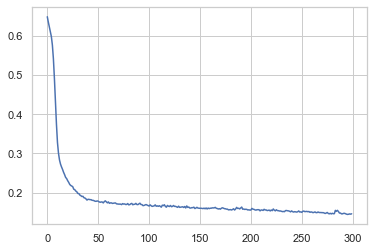

group_viol_FP
####################################################################################
Using device cpu


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Epoch: 1/300
Train BCEwL 0.666:
Epoch: 2/300
Train BCEwL 0.635:
Epoch: 3/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.592:
Epoch: 4/300
Train BCEwL 0.524:
Epoch: 5/300
Train BCEwL 0.420:
Epoch: 6/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.311:
Epoch: 7/300
Train BCEwL 0.281:
Epoch: 8/300
Train BCEwL 0.281:
Epoch: 9/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.276:
Epoch: 10/300
Train BCEwL 0.272:
Epoch: 11/300
Train BCEwL 0.274:
Epoch: 12/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.272:
Epoch: 13/300
Train BCEwL 0.271:
Epoch: 14/300
Train BCEwL 0.271:
Epoch: 15/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.269:
Epoch: 16/300
Train BCEwL 0.268:
Epoch: 17/300
Train BCEwL 0.266:
Epoch: 18/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.264:
Epoch: 19/300
Train BCEwL 0.266:
Epoch: 20/300
Train BCEwL 0.262:
Epoch: 21/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.262:
Epoch: 22/300
Train BCEwL 0.260:
Epoch: 23/300
Train BCEwL 0.260:
Epoch: 24/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.258:
Epoch: 25/300
Train BCEwL 0.259:
Epoch: 26/300
Train BCEwL 0.258:
Epoch: 27/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.258:
Epoch: 28/300
Train BCEwL 0.256:
Epoch: 29/300
Train BCEwL 0.255:
Epoch: 30/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.256:
Epoch: 31/300
Train BCEwL 0.254:
Epoch: 32/300
Train BCEwL 0.252:
Epoch: 33/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.249:
Epoch: 34/300
Train BCEwL 0.252:
Epoch: 35/300
Train BCEwL 0.250:
Epoch: 36/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.249:
Epoch: 37/300
Train BCEwL 0.246:
Epoch: 38/300
Train BCEwL 0.247:
Epoch: 39/300


 62%|███████████████████████████████████████████████████                                | 8/13 [00:00<00:00, 79.81it/s]

Train BCEwL 0.247:
Epoch: 40/300
Train BCEwL 0.245:
Epoch: 41/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.245:
Epoch: 42/300
Train BCEwL 0.243:
Epoch: 43/300
Train BCEwL 0.240:
Epoch: 44/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.241:
Epoch: 45/300
Train BCEwL 0.240:
Epoch: 46/300
Train BCEwL 0.240:
Epoch: 47/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.239:
Epoch: 48/300
Train BCEwL 0.236:
Epoch: 49/300
Train BCEwL 0.237:
Epoch: 50/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.234:
Epoch: 51/300
Train BCEwL 0.232:
Epoch: 52/300
Train BCEwL 0.232:
Epoch: 53/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.233:
Epoch: 54/300
Train BCEwL 0.230:
Epoch: 55/300
Train BCEwL 0.228:
Epoch: 56/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.227:
Epoch: 57/300
Train BCEwL 0.228:
Epoch: 58/300
Train BCEwL 0.226:
Epoch: 59/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.225:
Epoch: 60/300
Train BCEwL 0.225:
Epoch: 61/300
Train BCEwL 0.222:
Epoch: 62/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.223:
Epoch: 63/300
Train BCEwL 0.223:
Epoch: 64/300
Train BCEwL 0.222:
Epoch: 65/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.221:
Epoch: 66/300
Train BCEwL 0.218:
Epoch: 67/300
Train BCEwL 0.218:
Epoch: 68/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.216:
Epoch: 69/300
Train BCEwL 0.214:
Epoch: 70/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.215:
Epoch: 71/300
Train BCEwL 0.215:
Epoch: 72/300
Train BCEwL 0.213:
Epoch: 73/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.214:
Epoch: 74/300
Train BCEwL 0.214:
Epoch: 75/300
Train BCEwL 0.212:
Epoch: 76/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.212:
Epoch: 77/300
Train BCEwL 0.211:
Epoch: 78/300
Train BCEwL 0.211:
Epoch: 79/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.212:
Epoch: 80/300
Train BCEwL 0.208:
Epoch: 81/300
Train BCEwL 0.208:
Epoch: 82/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.208:
Epoch: 83/300
Train BCEwL 0.207:
Epoch: 84/300
Train BCEwL 0.207:
Epoch: 85/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.207:
Epoch: 86/300
Train BCEwL 0.206:
Epoch: 87/300
Train BCEwL 0.207:
Epoch: 88/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.204:
Epoch: 89/300
Train BCEwL 0.207:
Epoch: 90/300
Train BCEwL 0.206:
Epoch: 91/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.207:
Epoch: 92/300
Train BCEwL 0.204:
Epoch: 93/300
Train BCEwL 0.201:
Epoch: 94/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.202:
Epoch: 95/300
Train BCEwL 0.202:
Epoch: 96/300
Train BCEwL 0.202:
Epoch: 97/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.202:
Epoch: 98/300
Train BCEwL 0.202:
Epoch: 99/300
Train BCEwL 0.201:
Epoch: 100/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.202:
Epoch: 101/300
Train BCEwL 0.200:
Epoch: 102/300
Train BCEwL 0.197:
Epoch: 103/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.200:
Epoch: 104/300
Train BCEwL 0.199:
Epoch: 105/300
Train BCEwL 0.196:
Epoch: 106/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.195:
Epoch: 107/300
Train BCEwL 0.198:
Epoch: 108/300
Train BCEwL 0.196:
Epoch: 109/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.195:
Epoch: 110/300
Train BCEwL 0.195:
Epoch: 111/300
Train BCEwL 0.193:
Epoch: 112/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.194:
Epoch: 113/300
Train BCEwL 0.192:
Epoch: 114/300
Train BCEwL 0.195:
Epoch: 115/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.194:
Epoch: 116/300
Train BCEwL 0.194:
Epoch: 117/300
Train BCEwL 0.193:
Epoch: 118/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.191:
Epoch: 119/300
Train BCEwL 0.191:
Epoch: 120/300
Train BCEwL 0.190:
Epoch: 121/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.192:
Epoch: 122/300
Train BCEwL 0.190:
Epoch: 123/300
Train BCEwL 0.189:
Epoch: 124/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.188:
Epoch: 125/300
Train BCEwL 0.189:
Epoch: 126/300
Train BCEwL 0.188:
Epoch: 127/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.191:
Epoch: 128/300
Train BCEwL 0.186:
Epoch: 129/300
Train BCEwL 0.187:
Epoch: 130/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.187:
Epoch: 131/300
Train BCEwL 0.188:
Epoch: 132/300
Train BCEwL 0.187:
Epoch: 133/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.185:
Epoch: 134/300
Train BCEwL 0.185:
Epoch: 135/300
Train BCEwL 0.185:
Epoch: 136/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.184:
Epoch: 137/300
Train BCEwL 0.186:
Epoch: 138/300
Train BCEwL 0.186:
Epoch: 139/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.183:
Epoch: 140/300
Train BCEwL 0.180:
Epoch: 141/300
Train BCEwL 0.183:
Epoch: 142/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.182:
Epoch: 143/300
Train BCEwL 0.178:
Epoch: 144/300
Train BCEwL 0.180:
Epoch: 145/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.179:
Epoch: 146/300
Train BCEwL 0.178:
Epoch: 147/300
Train BCEwL 0.179:
Epoch: 148/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.179:
Epoch: 149/300
Train BCEwL 0.176:
Epoch: 150/300
Train BCEwL 0.177:
Epoch: 151/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.178:
Epoch: 152/300
Train BCEwL 0.175:
Epoch: 153/300
Train BCEwL 0.175:
Epoch: 154/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.175:
Epoch: 155/300
Train BCEwL 0.173:
Epoch: 156/300
Train BCEwL 0.173:
Epoch: 157/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.173:
Epoch: 158/300
Train BCEwL 0.172:
Epoch: 159/300
Train BCEwL 0.170:
Epoch: 160/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.170:
Epoch: 161/300
Train BCEwL 0.171:
Epoch: 162/300
Train BCEwL 0.171:
Epoch: 163/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.173:
Epoch: 164/300
Train BCEwL 0.166:
Epoch: 165/300
Train BCEwL 0.168:
Epoch: 166/300


100%|█████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 208.03it/s]


Train BCEwL 0.169:
Epoch: 167/300
Train BCEwL 0.167:
Epoch: 168/300
Train BCEwL 0.167:
Epoch: 169/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.164:
Epoch: 170/300
Train BCEwL 0.163:
Epoch: 171/300
Train BCEwL 0.164:
Epoch: 172/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.165:
Epoch: 173/300
Train BCEwL 0.164:
Epoch: 174/300
Train BCEwL 0.163:
Epoch: 175/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.162:
Epoch: 176/300
Train BCEwL 0.160:
Epoch: 177/300
Train BCEwL 0.161:
Epoch: 178/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.161:
Epoch: 179/300
Train BCEwL 0.163:
Epoch: 180/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.160:
Epoch: 181/300
Train BCEwL 0.160:
Epoch: 182/300
Train BCEwL 0.161:
Epoch: 183/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.162:
Epoch: 184/300
Train BCEwL 0.161:
Epoch: 185/300
Train BCEwL 0.156:
Epoch: 186/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.158:
Epoch: 187/300
Train BCEwL 0.156:
Epoch: 188/300
Train BCEwL 0.156:
Epoch: 189/300


 92%|██████████████████████████████████████████████████████████████████████████▊      | 12/13 [00:00<00:00, 119.71it/s]

Train BCEwL 0.158:
Epoch: 190/300
Train BCEwL 0.162:
Epoch: 191/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.160:
Epoch: 192/300
Train BCEwL 0.159:
Epoch: 193/300
Train BCEwL 0.159:
Epoch: 194/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.156:
Epoch: 195/300
Train BCEwL 0.152:
Epoch: 196/300
Train BCEwL 0.151:
Epoch: 197/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.150:
Epoch: 198/300
Train BCEwL 0.152:
Epoch: 199/300
Train BCEwL 0.149:
Epoch: 200/300


 92%|██████████████████████████████████████████████████████████████████████████▊      | 12/13 [00:00<00:00, 119.71it/s]

Train BCEwL 0.149:
Epoch: 201/300
Train BCEwL 0.152:
Epoch: 202/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.155:
Epoch: 203/300
Train BCEwL 0.155:
Epoch: 204/300
Train BCEwL 0.152:
Epoch: 205/300


100%|█████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 129.65it/s]

Train BCEwL 0.151:
Epoch: 206/300
Train BCEwL 0.151:
Epoch: 207/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.149:
Epoch: 208/300
Train BCEwL 0.146:
Epoch: 209/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.146:
Epoch: 210/300
Train BCEwL 0.147:
Epoch: 211/300
Train BCEwL 0.149:
Epoch: 212/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.147:
Epoch: 213/300
Train BCEwL 0.145:
Epoch: 214/300
Train BCEwL 0.147:
Epoch: 215/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.145:
Epoch: 216/300
Train BCEwL 0.141:
Epoch: 217/300
Train BCEwL 0.141:
Epoch: 218/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.143:
Epoch: 219/300
Train BCEwL 0.143:
Epoch: 220/300
Train BCEwL 0.141:
Epoch: 221/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.141:
Epoch: 222/300
Train BCEwL 0.139:
Epoch: 223/300
Train BCEwL 0.141:
Epoch: 224/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.144:
Epoch: 225/300
Train BCEwL 0.138:
Epoch: 226/300
Train BCEwL 0.141:
Epoch: 227/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.138:
Epoch: 228/300
Train BCEwL 0.138:
Epoch: 229/300
Train BCEwL 0.139:
Epoch: 230/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.138:
Epoch: 231/300
Train BCEwL 0.137:
Epoch: 232/300
Train BCEwL 0.138:
Epoch: 233/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.147:
Epoch: 234/300
Train BCEwL 0.143:
Epoch: 235/300
Train BCEwL 0.139:
Epoch: 236/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.136:
Epoch: 237/300
Train BCEwL 0.136:
Epoch: 238/300
Train BCEwL 0.134:
Epoch: 239/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.136:
Epoch: 240/300
Train BCEwL 0.135:
Epoch: 241/300
Train BCEwL 0.140:
Epoch: 242/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.138:
Epoch: 243/300
Train BCEwL 0.134:
Epoch: 244/300
Train BCEwL 0.135:
Epoch: 245/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.138:
Epoch: 246/300
Train BCEwL 0.136:
Epoch: 247/300
Train BCEwL 0.132:
Epoch: 248/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.133:
Epoch: 249/300
Train BCEwL 0.131:
Epoch: 250/300
Train BCEwL 0.131:
Epoch: 251/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.136:
Epoch: 252/300
Train BCEwL 0.132:
Epoch: 253/300
Train BCEwL 0.132:
Epoch: 254/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.130:
Epoch: 255/300
Train BCEwL 0.132:
Epoch: 256/300
Train BCEwL 0.131:
Epoch: 257/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.137:
Epoch: 258/300
Train BCEwL 0.136:
Epoch: 259/300
Train BCEwL 0.129:
Epoch: 260/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.129:
Epoch: 261/300
Train BCEwL 0.130:
Epoch: 262/300
Train BCEwL 0.128:
Epoch: 263/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.130:
Epoch: 264/300
Train BCEwL 0.127:
Epoch: 265/300
Train BCEwL 0.129:
Epoch: 266/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.131:
Epoch: 267/300
Train BCEwL 0.131:
Epoch: 268/300
Train BCEwL 0.132:
Epoch: 269/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.128:
Epoch: 270/300
Train BCEwL 0.132:
Epoch: 271/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.130:
Epoch: 272/300
Train BCEwL 0.129:
Epoch: 273/300
Train BCEwL 0.127:
Epoch: 274/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.127:
Epoch: 275/300
Train BCEwL 0.126:
Epoch: 276/300
Train BCEwL 0.125:
Epoch: 277/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.124:
Epoch: 278/300
Train BCEwL 0.125:
Epoch: 279/300
Train BCEwL 0.122:
Epoch: 280/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.122:
Epoch: 281/300
Train BCEwL 0.124:
Epoch: 282/300
Train BCEwL 0.122:
Epoch: 283/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.124:
Epoch: 284/300
Train BCEwL 0.126:
Epoch: 285/300
Train BCEwL 0.121:
Epoch: 286/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.121:
Epoch: 287/300
Train BCEwL 0.126:
Epoch: 288/300
Train BCEwL 0.123:
Epoch: 289/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.126:
Epoch: 290/300
Train BCEwL 0.128:
Epoch: 291/300
Train BCEwL 0.126:
Epoch: 292/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.124:
Epoch: 293/300
Train BCEwL 0.125:
Epoch: 294/300
Train BCEwL 0.129:
Epoch: 295/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.122:
Epoch: 296/300
Train BCEwL 0.122:
Epoch: 297/300
Train BCEwL 0.122:
Epoch: 298/300


100%|█████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 166.45it/s]


Train BCEwL 0.123:
Epoch: 299/300
Train BCEwL 0.123:
Epoch: 300/300
Train BCEwL 0.121:
AUC: 0.6590332892416225
Validation RMSE 15.568:
Validation BCEwL 0.497:


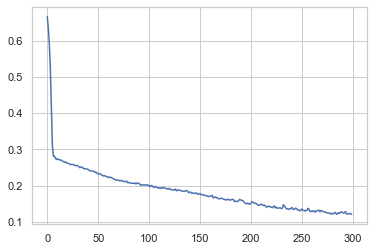

group_viol_FN
####################################################################################


In [9]:
keys = ['group_viol']#, 'group_recid']
subkeys = ['FP', 'FN']#, 'T']
y_val_predicted = {}
models = {}
for key in keys:
    for subkey in subkeys:
        target = key + '_' + subkey
        original_target_name = target
        
        # Fit model
        device = "cpu"  # "cuda" if torch.cuda.is_available() else "cpu"
        model_pos, X_train_pos, X_val_pos, y_val_predicted_pos, losses_pos = fit_NN(X_train, 
                                                                                        X_val,
                                                                                        y_train,
                                                                                        y_val,
                                                                                        target, 
                                                                                        scales=False, regex_keys=None,
                                                                                        n_layers=3, n_hidden=20, n_epochs=300, weighting=True,
                                                                                        batch_size=256,
                                                                                        device=device, return_loss=True)
        models[target] = model_pos
        plt.plot(losses_pos)
        plt.show()
            

            
        y_val_predicted[target] = y_val_predicted_pos
        
        print(target)
        print("####################################################################################")


group_viol_FP
Example: Subject 0
group_viol_FP = 0.0 	 prediction = tensor(1.2788e-19)


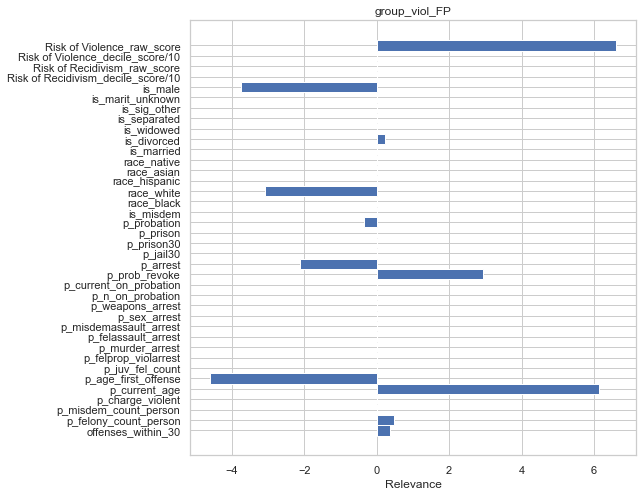

Example: Subject 1
group_viol_FP = 0.0 	 prediction = tensor(2.1652e-15)


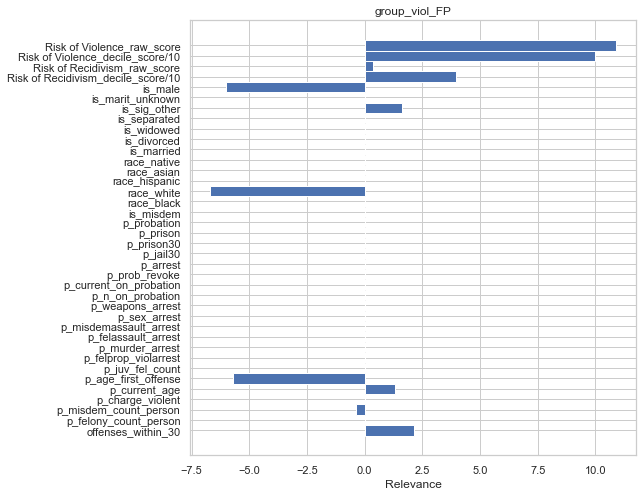

Example: Subject 2
group_viol_FP = 0.0 	 prediction = tensor(1.2056e-11)


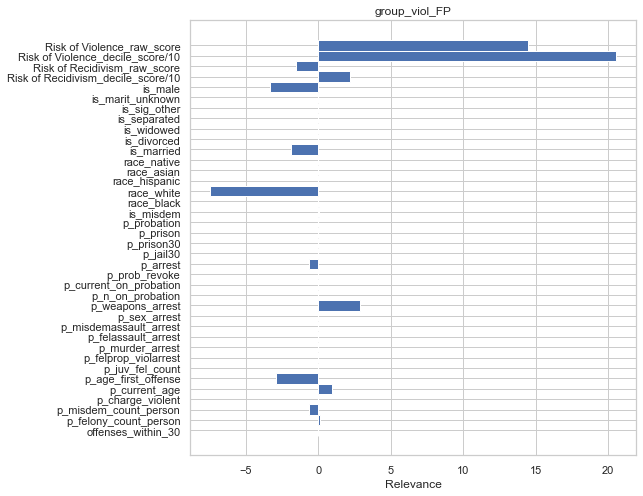

Example: Subject 3
group_viol_FP = 0.0 	 prediction = tensor(5.3211e-07)


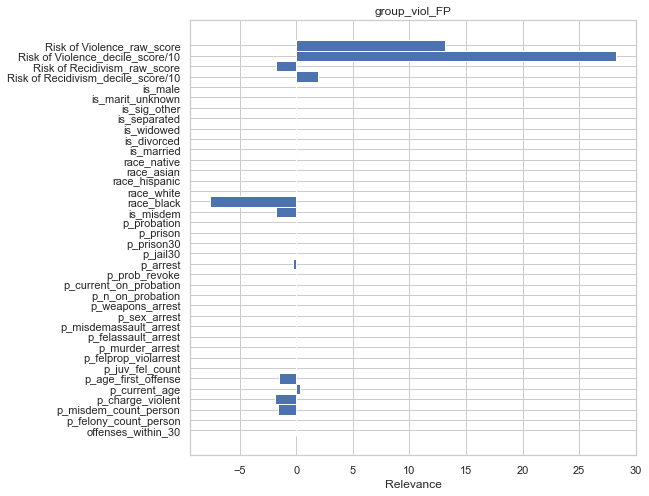

Example: Subject 4
group_viol_FP = 0.0 	 prediction = tensor(0.8629)


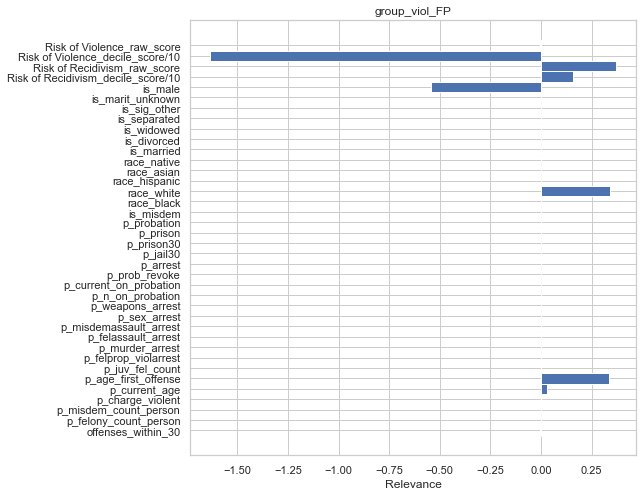

group_viol_FN
Example: Subject 0
group_viol_FN = 0.0 	 prediction = tensor(0.0011)


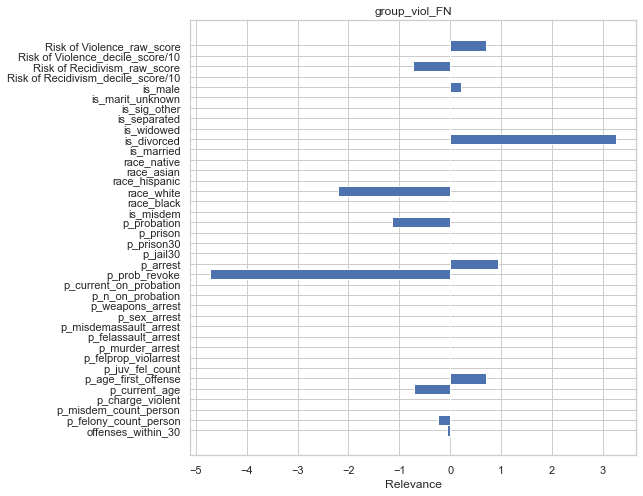

Example: Subject 1
group_viol_FN = 0.0 	 prediction = tensor(0.0097)


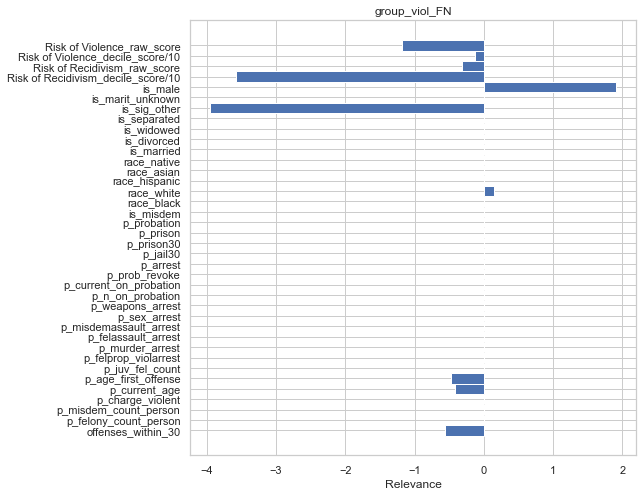

Example: Subject 2
group_viol_FN = 0.0 	 prediction = tensor(0.0242)


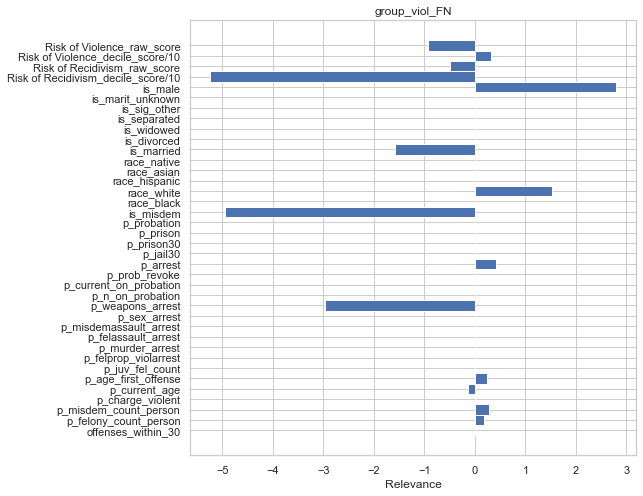

Example: Subject 3
group_viol_FN = 0.0 	 prediction = tensor(0.8190)


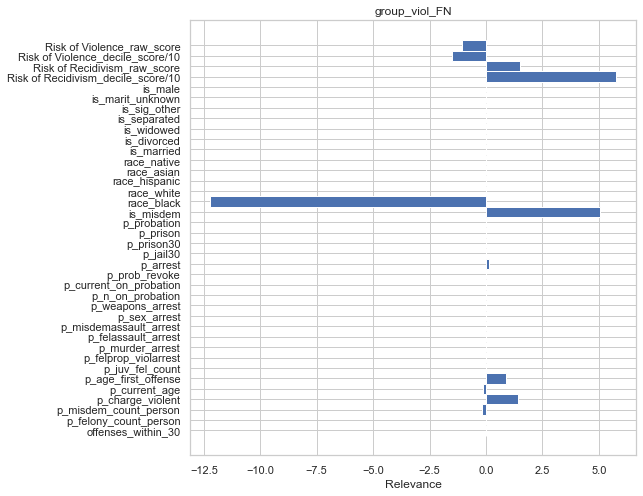

Example: Subject 4
group_viol_FN = 0.0 	 prediction = tensor(6.3680e-15)


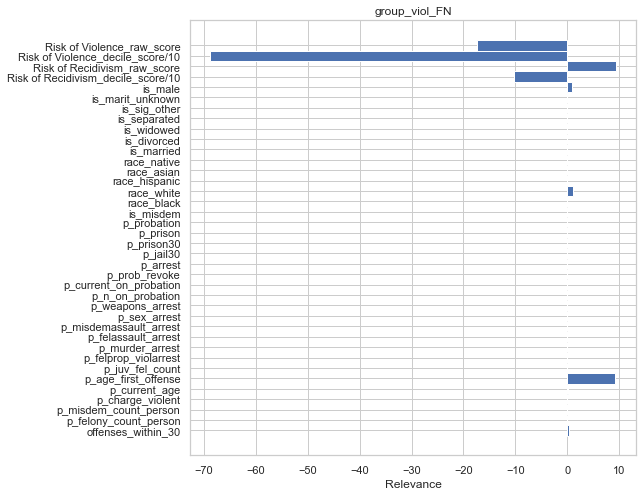

group_viol_FP
--Correct: 979
--Wrong:   101


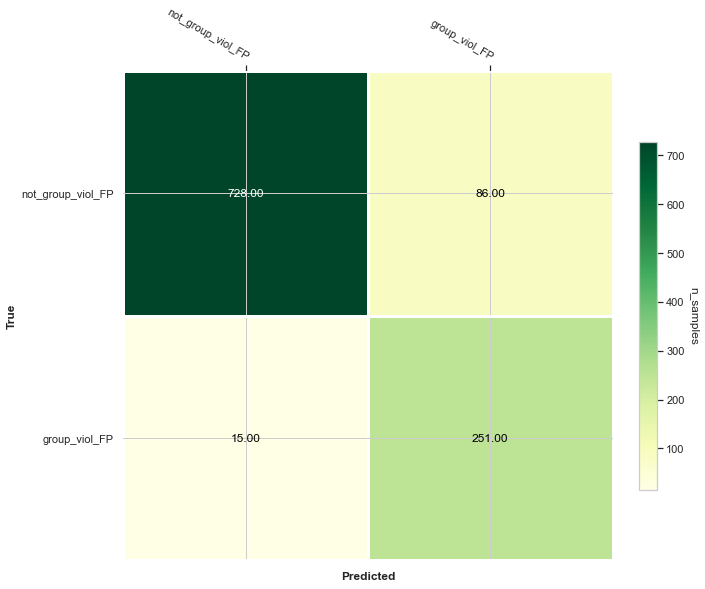

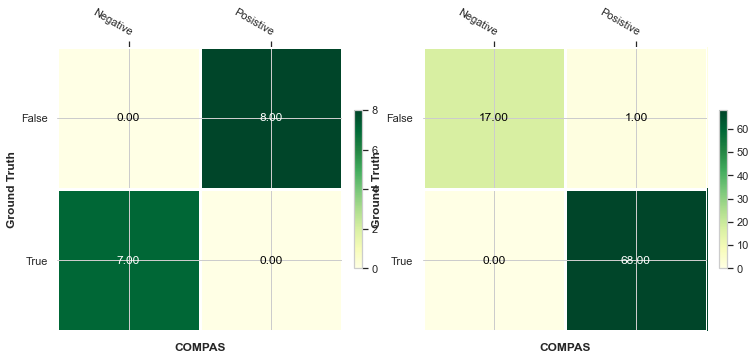

########################################################################################
group_viol_FN
--Correct: 975
--Wrong:   105


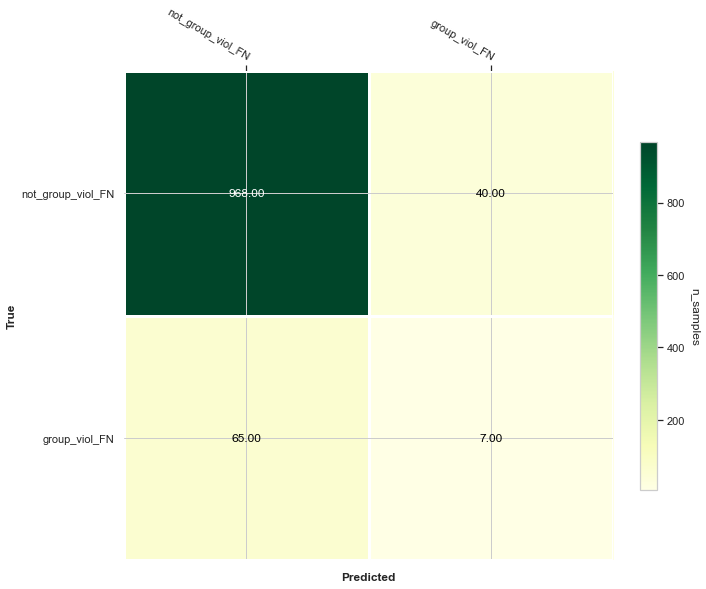

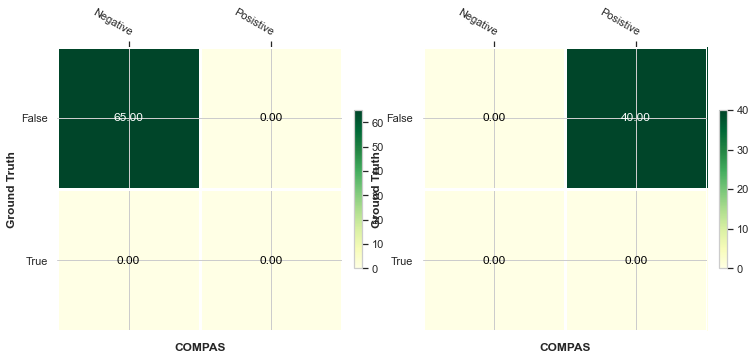

########################################################################################


In [11]:
for key in keys:
    for subkey in subkeys:
        target = key + '_' + subkey
        print(target)
        

        y_val_predicted_t = [1 if x >=.5 else 0 for x in list(torch.sigmoid(torch.tensor(y_val_predicted[target])))]


        
        y_val_predicted["correct"] = [int(y_val[target][i] == y_val_predicted_t[i]) for i in range(len(y_val_predicted_t))]

        print("--Correct:", sum(y_val_predicted["correct"]))
        print("--Wrong:  ", len(y_val[target]) - sum(y_val_predicted["correct"]))
        
        
        fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(12,9))
        mat = confusion_matrix(y_val[target], y_val_predicted_t)
        im, cbar = plot_helpers.heatmap(mat, ["not_" + target, target], ["not_" + target, target], ax=axs,
                                       cmap="YlGn", cbarlabel="n_samples")
        texts = plot_helpers.annotate_heatmap(im, valfmt="{x:.2f}")
        axs.set_xlabel('Predicted', fontweight='bold')
        axs.set_ylabel('True', fontweight='bold')
        #axs.set_title('Prediction Results on ' + target + ' for ' + text, fontsize=20, fontweight='bold',
        #                  loc='left')
        plt.show()
        
        
        # Show confusion matrices (true VS compas) for the off-diagonal cells
        subcategories = [[0,1], [1,0]]  # off-diagonals
        fig, axs = plt.subplots(nrows=1, ncols=len(subcategories), figsize=(12,9))
        for s, sub in enumerate(subcategories):   
            if "viol" in key:
                gt = 'recid_violent'
                compas = 'Risk of Violence_decile_score'
            else:
                gt = 'recid'
                compas = 'Risk of Recidivism_decile_score'

            gt_data = y_val[gt] # true value
            compas_data = y_val[compas]>4 # compas predicted
            # selector selects where our prediction disagrees with compas
            selector = [y_val_predicted_t[i] == sub[0] and y_val[target][i] == sub[1] for i in range(len(y_val))] 
            mat = numpy.zeros([2,2])
            for i in range(len(selector)):
                if selector[i]:
                    g = int(int(gt_data[i]) == int(compas_data[i]))
                    c = int(compas_data[i])
                    mat[c,g] += 1

            im, cbar = plot_helpers.heatmap(mat, ["False","True"], ["Negative","Posistive"], ax=axs[s],
                                           cmap="YlGn")
            texts = plot_helpers.annotate_heatmap(im, valfmt="{x:.2f}")
            axs[s].set_xlabel('COMPAS', fontweight='bold')
            axs[s].set_ylabel('Ground Truth', fontweight='bold')
        plt.show()
        
        
        print("########################################################################################")

### Model only with scores as input

  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Using device cpu
Epoch: 1/300
Train BCEwL 0.700:
Epoch: 2/300
Train BCEwL 0.686:
Epoch: 3/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.673:
Epoch: 4/300
Train BCEwL 0.657:
Epoch: 5/300


 85%|████████████████████████████████████████████████████████████████████▌            | 11/13 [00:00<00:00, 109.63it/s]

Train BCEwL 0.636:
Epoch: 6/300
Train BCEwL 0.602:
Epoch: 7/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.564:
Epoch: 8/300
Train BCEwL 0.549:
Epoch: 9/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.521:
Epoch: 10/300
Train BCEwL 0.464:
Epoch: 11/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.383:
Epoch: 12/300
Train BCEwL 0.316:
Epoch: 13/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.280:
Epoch: 14/300
Train BCEwL 0.261:
Epoch: 15/300
Train BCEwL 0.252:
Epoch: 16/300


 92%|██████████████████████████████████████████████████████████████████████████▊      | 12/13 [00:00<00:00, 119.64it/s]

Train BCEwL 0.244:
Epoch: 17/300
Train BCEwL 0.239:
Epoch: 18/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.235:
Epoch: 19/300
Train BCEwL 0.231:
Epoch: 20/300


 85%|████████████████████████████████████████████████████████████████████▌            | 11/13 [00:00<00:00, 109.67it/s]

Train BCEwL 0.227:
Epoch: 21/300
Train BCEwL 0.220:
Epoch: 22/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.213:
Epoch: 23/300
Train BCEwL 0.202:
Epoch: 24/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.191:
Epoch: 25/300
Train BCEwL 0.190:
Epoch: 26/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.190:
Epoch: 27/300
Train BCEwL 0.190:
Epoch: 28/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.190:
Epoch: 29/300
Train BCEwL 0.191:
Epoch: 30/300


 92%|██████████████████████████████████████████████████████████████████████████▊      | 12/13 [00:00<00:00, 119.68it/s]

Train BCEwL 0.189:
Epoch: 31/300
Train BCEwL 0.189:
Epoch: 32/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.189:
Epoch: 33/300
Train BCEwL 0.187:
Epoch: 34/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.188:
Epoch: 35/300
Train BCEwL 0.190:
Epoch: 36/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.190:
Epoch: 37/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.190:
Epoch: 38/300
Train BCEwL 0.189:
Epoch: 39/300


100%|█████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 129.73it/s]

Train BCEwL 0.189:
Epoch: 40/300
Train BCEwL 0.188:
Epoch: 41/300


 85%|████████████████████████████████████████████████████████████████████▌            | 11/13 [00:00<00:00, 109.65it/s]

Train BCEwL 0.188:
Epoch: 42/300
Train BCEwL 0.188:
Epoch: 43/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.188:
Epoch: 44/300
Train BCEwL 0.189:
Epoch: 45/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.187:
Epoch: 46/300
Train BCEwL 0.190:
Epoch: 47/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.188:
Epoch: 48/300
Train BCEwL 0.187:
Epoch: 49/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.187:
Epoch: 50/300
Train BCEwL 0.187:
Epoch: 51/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.187:
Epoch: 52/300
Train BCEwL 0.186:
Epoch: 53/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.186:
Epoch: 54/300
Train BCEwL 0.186:
Epoch: 55/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.186:
Epoch: 56/300
Train BCEwL 0.187:
Epoch: 57/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.186:
Epoch: 58/300
Train BCEwL 0.193:
Epoch: 59/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.192:
Epoch: 60/300
Train BCEwL 0.188:
Epoch: 61/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.186:
Epoch: 62/300
Train BCEwL 0.187:
Epoch: 63/300


 92%|██████████████████████████████████████████████████████████████████████████▊      | 12/13 [00:00<00:00, 119.64it/s]

Train BCEwL 0.185:
Epoch: 64/300
Train BCEwL 0.186:
Epoch: 65/300


 92%|██████████████████████████████████████████████████████████████████████████▊      | 12/13 [00:00<00:00, 119.72it/s]

Train BCEwL 0.185:
Epoch: 66/300
Train BCEwL 0.186:
Epoch: 67/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.187:
Epoch: 68/300
Train BCEwL 0.187:
Epoch: 69/300
Train BCEwL 0.186:
Epoch: 70/300


100%|█████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 188.36it/s]


Train BCEwL 0.187:
Epoch: 71/300
Train BCEwL 0.185:
Epoch: 72/300
Train BCEwL 0.186:
Epoch: 73/300


 92%|██████████████████████████████████████████████████████████████████████████▊      | 12/13 [00:00<00:00, 119.63it/s]

Train BCEwL 0.186:
Epoch: 74/300
Train BCEwL 0.187:
Epoch: 75/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.185:
Epoch: 76/300
Train BCEwL 0.186:
Epoch: 77/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.186:
Epoch: 78/300
Train BCEwL 0.186:
Epoch: 79/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.185:
Epoch: 80/300
Train BCEwL 0.185:
Epoch: 81/300
Train BCEwL 0.187:
Epoch: 82/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.186:
Epoch: 83/300
Train BCEwL 0.186:
Epoch: 84/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.184:
Epoch: 85/300
Train BCEwL 0.186:
Epoch: 86/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.187:
Epoch: 87/300
Train BCEwL 0.186:
Epoch: 88/300
Train BCEwL 0.186:
Epoch: 89/300


 85%|████████████████████████████████████████████████████████████████████▌            | 11/13 [00:00<00:00, 109.66it/s]

Train BCEwL 0.184:
Epoch: 90/300
Train BCEwL 0.185:
Epoch: 91/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.185:
Epoch: 92/300
Train BCEwL 0.185:
Epoch: 93/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.185:
Epoch: 94/300
Train BCEwL 0.185:
Epoch: 95/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.186:
Epoch: 96/300
Train BCEwL 0.185:
Epoch: 97/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.184:
Epoch: 98/300
Train BCEwL 0.184:
Epoch: 99/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.184:
Epoch: 100/300
Train BCEwL 0.185:
Epoch: 101/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.184:
Epoch: 102/300
Train BCEwL 0.185:
Epoch: 103/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.184:
Epoch: 104/300
Train BCEwL 0.186:
Epoch: 105/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.185:
Epoch: 106/300
Train BCEwL 0.185:
Epoch: 107/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.185:
Epoch: 108/300
Train BCEwL 0.185:
Epoch: 109/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.186:
Epoch: 110/300
Train BCEwL 0.186:
Epoch: 111/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.185:
Epoch: 112/300
Train BCEwL 0.186:
Epoch: 113/300


100%|█████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 129.61it/s]

Train BCEwL 0.185:
Epoch: 114/300
Train BCEwL 0.184:
Epoch: 115/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.185:
Epoch: 116/300
Train BCEwL 0.186:
Epoch: 117/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.186:
Epoch: 118/300
Train BCEwL 0.187:
Epoch: 119/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.184:
Epoch: 120/300
Train BCEwL 0.185:
Epoch: 121/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.184:
Epoch: 122/300
Train BCEwL 0.185:
Epoch: 123/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.184:
Epoch: 124/300
Train BCEwL 0.185:
Epoch: 125/300


 77%|███████████████████████████████████████████████████████████████                   | 10/13 [00:00<00:00, 99.72it/s]

Train BCEwL 0.185:
Epoch: 126/300
Train BCEwL 0.185:
Epoch: 127/300


100%|█████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 129.64it/s]

Train BCEwL 0.184:
Epoch: 128/300
Train BCEwL 0.184:
Epoch: 129/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.185:
Epoch: 130/300
Train BCEwL 0.185:
Epoch: 131/300


 85%|████████████████████████████████████████████████████████████████████▌            | 11/13 [00:00<00:00, 109.70it/s]

Train BCEwL 0.185:
Epoch: 132/300
Train BCEwL 0.185:
Epoch: 133/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.184:
Epoch: 134/300
Train BCEwL 0.183:
Epoch: 135/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.184:
Epoch: 136/300
Train BCEwL 0.185:
Epoch: 137/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.184:
Epoch: 138/300
Train BCEwL 0.184:
Epoch: 139/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.184:
Epoch: 140/300
Train BCEwL 0.185:
Epoch: 141/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.186:
Epoch: 142/300
Train BCEwL 0.186:
Epoch: 143/300


 85%|████████████████████████████████████████████████████████████████████▌            | 11/13 [00:00<00:00, 109.74it/s]

Train BCEwL 0.184:
Epoch: 144/300
Train BCEwL 0.186:
Epoch: 145/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.184:
Epoch: 146/300
Train BCEwL 0.186:
Epoch: 147/300


 77%|███████████████████████████████████████████████████████████████                   | 10/13 [00:00<00:00, 99.69it/s]

Train BCEwL 0.185:
Epoch: 148/300
Train BCEwL 0.184:
Epoch: 149/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.185:
Epoch: 150/300
Train BCEwL 0.184:
Epoch: 151/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.185:
Epoch: 152/300
Train BCEwL 0.185:
Epoch: 153/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.184:
Epoch: 154/300
Train BCEwL 0.184:
Epoch: 155/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.184:
Epoch: 156/300
Train BCEwL 0.186:
Epoch: 157/300


 92%|██████████████████████████████████████████████████████████████████████████▊      | 12/13 [00:00<00:00, 119.68it/s]

Train BCEwL 0.185:
Epoch: 158/300
Train BCEwL 0.184:
Epoch: 159/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.184:
Epoch: 160/300
Train BCEwL 0.185:
Epoch: 161/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.184:
Epoch: 162/300
Train BCEwL 0.185:
Epoch: 163/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.184:
Epoch: 164/300
Train BCEwL 0.185:
Epoch: 165/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.185:
Epoch: 166/300
Train BCEwL 0.185:
Epoch: 167/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.185:
Epoch: 168/300
Train BCEwL 0.184:
Epoch: 169/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.184:
Epoch: 170/300
Train BCEwL 0.183:
Epoch: 171/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.183:
Epoch: 172/300
Train BCEwL 0.184:
Epoch: 173/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.184:
Epoch: 174/300
Train BCEwL 0.186:
Epoch: 175/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.184:
Epoch: 176/300
Train BCEwL 0.186:
Epoch: 177/300


100%|█████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 129.69it/s]

Train BCEwL 0.185:
Epoch: 178/300
Train BCEwL 0.184:
Epoch: 179/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.186:
Epoch: 180/300
Train BCEwL 0.184:
Epoch: 181/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.186:
Epoch: 182/300
Train BCEwL 0.184:
Epoch: 183/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.184:
Epoch: 184/300
Train BCEwL 0.184:
Epoch: 185/300


100%|█████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 129.69it/s]

Train BCEwL 0.184:
Epoch: 186/300
Train BCEwL 0.185:
Epoch: 187/300


 92%|██████████████████████████████████████████████████████████████████████████▊      | 12/13 [00:00<00:00, 119.64it/s]

Train BCEwL 0.185:
Epoch: 188/300
Train BCEwL 0.185:
Epoch: 189/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.184:
Epoch: 190/300
Train BCEwL 0.184:
Epoch: 191/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.184:
Epoch: 192/300
Train BCEwL 0.184:
Epoch: 193/300


 85%|████████████████████████████████████████████████████████████████████▌            | 11/13 [00:00<00:00, 109.73it/s]

Train BCEwL 0.185:
Epoch: 194/300
Train BCEwL 0.184:
Epoch: 195/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.185:
Epoch: 196/300
Train BCEwL 0.184:
Epoch: 197/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.185:
Epoch: 198/300
Train BCEwL 0.183:
Epoch: 199/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.184:
Epoch: 200/300
Train BCEwL 0.186:
Epoch: 201/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.186:
Epoch: 202/300
Train BCEwL 0.185:
Epoch: 203/300


 85%|████████████████████████████████████████████████████████████████████▌            | 11/13 [00:00<00:00, 109.71it/s]

Train BCEwL 0.185:
Epoch: 204/300
Train BCEwL 0.184:
Epoch: 205/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.185:
Epoch: 206/300
Train BCEwL 0.185:
Epoch: 207/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.183:
Epoch: 208/300
Train BCEwL 0.185:
Epoch: 209/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.186:
Epoch: 210/300
Train BCEwL 0.185:
Epoch: 211/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.184:
Epoch: 212/300
Train BCEwL 0.185:
Epoch: 213/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.183:
Epoch: 214/300
Train BCEwL 0.184:
Epoch: 215/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.183:
Epoch: 216/300
Train BCEwL 0.186:
Epoch: 217/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.184:
Epoch: 218/300
Train BCEwL 0.184:
Epoch: 219/300


 92%|██████████████████████████████████████████████████████████████████████████▊      | 12/13 [00:00<00:00, 119.48it/s]

Train BCEwL 0.185:
Epoch: 220/300
Train BCEwL 0.184:
Epoch: 221/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.184:
Epoch: 222/300
Train BCEwL 0.185:
Epoch: 223/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.184:
Epoch: 224/300
Train BCEwL 0.184:
Epoch: 225/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.185:
Epoch: 226/300
Train BCEwL 0.185:
Epoch: 227/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.184:
Epoch: 228/300
Train BCEwL 0.184:
Epoch: 229/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.184:
Epoch: 230/300
Train BCEwL 0.185:
Epoch: 231/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.185:
Epoch: 232/300
Train BCEwL 0.183:
Epoch: 233/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.185:
Epoch: 234/300
Train BCEwL 0.184:
Epoch: 235/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.185:
Epoch: 236/300
Train BCEwL 0.185:
Epoch: 237/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.184:
Epoch: 238/300
Train BCEwL 0.184:
Epoch: 239/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.184:
Epoch: 240/300
Train BCEwL 0.186:
Epoch: 241/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.185:
Epoch: 242/300
Train BCEwL 0.184:
Epoch: 243/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.185:
Epoch: 244/300
Train BCEwL 0.184:
Epoch: 245/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.186:
Epoch: 246/300
Train BCEwL 0.185:
Epoch: 247/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.186:
Epoch: 248/300
Train BCEwL 0.184:
Epoch: 249/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.185:
Epoch: 250/300
Train BCEwL 0.186:
Epoch: 251/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.184:
Epoch: 252/300
Train BCEwL 0.185:
Epoch: 253/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.184:
Epoch: 254/300
Train BCEwL 0.183:
Epoch: 255/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.183:
Epoch: 256/300
Train BCEwL 0.184:
Epoch: 257/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.184:
Epoch: 258/300
Train BCEwL 0.185:
Epoch: 259/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.185:
Epoch: 260/300
Train BCEwL 0.185:
Epoch: 261/300


 85%|████████████████████████████████████████████████████████████████████▌            | 11/13 [00:00<00:00, 109.25it/s]

Train BCEwL 0.185:
Epoch: 262/300
Train BCEwL 0.183:
Epoch: 263/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.184:
Epoch: 264/300
Train BCEwL 0.184:
Epoch: 265/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.183:
Epoch: 266/300
Train BCEwL 0.185:
Epoch: 267/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.184:
Epoch: 268/300
Train BCEwL 0.183:
Epoch: 269/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.184:
Epoch: 270/300
Train BCEwL 0.184:
Epoch: 271/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.185:
Epoch: 272/300
Train BCEwL 0.185:
Epoch: 273/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.183:
Epoch: 274/300
Train BCEwL 0.185:
Epoch: 275/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.184:
Epoch: 276/300
Train BCEwL 0.187:
Epoch: 277/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.183:
Epoch: 278/300
Train BCEwL 0.185:
Epoch: 279/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.185:
Epoch: 280/300
Train BCEwL 0.186:
Epoch: 281/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.183:
Epoch: 282/300
Train BCEwL 0.185:
Epoch: 283/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.184:
Epoch: 284/300
Train BCEwL 0.186:
Epoch: 285/300


 85%|████████████████████████████████████████████████████████████████████▌            | 11/13 [00:00<00:00, 109.70it/s]

Train BCEwL 0.184:
Epoch: 286/300
Train BCEwL 0.185:
Epoch: 287/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.186:
Epoch: 288/300
Train BCEwL 0.183:
Epoch: 289/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.184:
Epoch: 290/300
Train BCEwL 0.183:
Epoch: 291/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.186:
Epoch: 292/300
Train BCEwL 0.185:
Epoch: 293/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.183:
Epoch: 294/300
Train BCEwL 0.183:
Epoch: 295/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.185:
Epoch: 296/300
Train BCEwL 0.185:
Epoch: 297/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.184:
Epoch: 298/300
Train BCEwL 0.185:
Epoch: 299/300


100%|█████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 129.69it/s]


Train BCEwL 0.186:
Epoch: 300/300
Train BCEwL 0.184:
AUC: 0.9527789067262752
Validation RMSE 45.650:
Validation BCEwL 0.191:


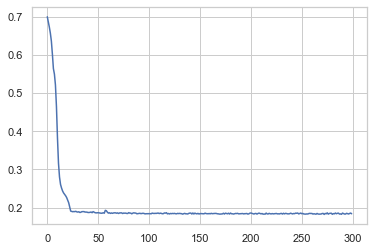

  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

group_viol_FP
####################################################################################
Using device cpu
Epoch: 1/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.670:
Epoch: 2/300


 85%|████████████████████████████████████████████████████████████████████▌            | 11/13 [00:00<00:00, 109.74it/s]

Train BCEwL 0.652:
Epoch: 3/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.631:
Epoch: 4/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.600:
Epoch: 5/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.546:
Epoch: 6/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.409:
Epoch: 7/300
Train BCEwL 0.282:
Epoch: 8/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.276:
Epoch: 9/300


100%|█████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 129.02it/s]

Train BCEwL 0.270:
Epoch: 10/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.270:
Epoch: 11/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.269:
Epoch: 12/300


100%|█████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 141.68it/s]

Train BCEwL 0.266:
Epoch: 13/300



  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.265:
Epoch: 14/300
Train BCEwL 0.265:
Epoch: 15/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.266:
Epoch: 16/300


 77%|███████████████████████████████████████████████████████████████                   | 10/13 [00:00<00:00, 98.56it/s]

Train BCEwL 0.265:
Epoch: 17/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.263:
Epoch: 18/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.261:
Epoch: 19/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.262:
Epoch: 20/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.260:
Epoch: 21/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.260:
Epoch: 22/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.257:
Epoch: 23/300


 85%|████████████████████████████████████████████████████████████████████▌            | 11/13 [00:00<00:00, 109.74it/s]

Train BCEwL 0.255:
Epoch: 24/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.251:
Epoch: 25/300


100%|█████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 153.63it/s]

Train BCEwL 0.250:
Epoch: 26/300



  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.248:
Epoch: 27/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.247:
Epoch: 28/300


 85%|████████████████████████████████████████████████████████████████████▌            | 11/13 [00:00<00:00, 109.70it/s]

Train BCEwL 0.245:
Epoch: 29/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.243:
Epoch: 30/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.243:
Epoch: 31/300


100%|█████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 129.64it/s]

Train BCEwL 0.240:
Epoch: 32/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.238:
Epoch: 33/300
Train BCEwL 0.239:
Epoch: 34/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.238:
Epoch: 35/300
Train BCEwL 0.239:
Epoch: 36/300


 77%|███████████████████████████████████████████████████████████████                   | 10/13 [00:00<00:00, 99.72it/s]

Train BCEwL 0.236:
Epoch: 37/300
Train BCEwL 0.237:
Epoch: 38/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.237:
Epoch: 39/300
Train BCEwL 0.238:
Epoch: 40/300


 77%|███████████████████████████████████████████████████████████████                   | 10/13 [00:00<00:00, 99.69it/s]

Train BCEwL 0.236:
Epoch: 41/300
Train BCEwL 0.236:
Epoch: 42/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.236:
Epoch: 43/300
Train BCEwL 0.236:
Epoch: 44/300
Train BCEwL 0.236:
Epoch: 45/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.236:
Epoch: 46/300
Train BCEwL 0.234:
Epoch: 47/300


100%|█████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 129.69it/s]

Train BCEwL 0.234:
Epoch: 48/300
Train BCEwL 0.234:
Epoch: 49/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.236:
Epoch: 50/300
Train BCEwL 0.234:
Epoch: 51/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.236:
Epoch: 52/300
Train BCEwL 0.236:
Epoch: 53/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.235:
Epoch: 54/300
Train BCEwL 0.234:
Epoch: 55/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.236:
Epoch: 56/300
Train BCEwL 0.236:
Epoch: 57/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.234:
Epoch: 58/300
Train BCEwL 0.233:
Epoch: 59/300


 77%|███████████████████████████████████████████████████████████████                   | 10/13 [00:00<00:00, 99.73it/s]

Train BCEwL 0.234:
Epoch: 60/300
Train BCEwL 0.235:
Epoch: 61/300


 85%|████████████████████████████████████████████████████████████████████▌            | 11/13 [00:00<00:00, 109.65it/s]

Train BCEwL 0.234:
Epoch: 62/300
Train BCEwL 0.236:
Epoch: 63/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.233:
Epoch: 64/300
Train BCEwL 0.234:
Epoch: 65/300


100%|█████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 129.60it/s]

Train BCEwL 0.234:
Epoch: 66/300
Train BCEwL 0.235:
Epoch: 67/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.233:
Epoch: 68/300
Train BCEwL 0.233:
Epoch: 69/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.234:
Epoch: 70/300
Train BCEwL 0.234:
Epoch: 71/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.232:
Epoch: 72/300
Train BCEwL 0.235:
Epoch: 73/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.235:
Epoch: 74/300
Train BCEwL 0.237:
Epoch: 75/300


100%|█████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 166.36it/s]

Train BCEwL 0.234:
Epoch: 76/300
Train BCEwL 0.233:
Epoch: 77/300



  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.233:
Epoch: 78/300
Train BCEwL 0.232:
Epoch: 79/300
Train BCEwL 0.233:
Epoch: 80/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.234:
Epoch: 81/300
Train BCEwL 0.233:
Epoch: 82/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.232:
Epoch: 83/300
Train BCEwL 0.233:
Epoch: 84/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.233:
Epoch: 85/300
Train BCEwL 0.232:
Epoch: 86/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.235:
Epoch: 87/300
Train BCEwL 0.232:
Epoch: 88/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.232:
Epoch: 89/300
Train BCEwL 0.232:
Epoch: 90/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.233:
Epoch: 91/300
Train BCEwL 0.233:
Epoch: 92/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.232:
Epoch: 93/300
Train BCEwL 0.232:
Epoch: 94/300


 69%|█████████████████████████████████████████████████████████▍                         | 9/13 [00:00<00:00, 89.70it/s]

Train BCEwL 0.234:
Epoch: 95/300
Train BCEwL 0.235:
Epoch: 96/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.235:
Epoch: 97/300
Train BCEwL 0.231:
Epoch: 98/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.236:
Epoch: 99/300
Train BCEwL 0.234:
Epoch: 100/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.233:
Epoch: 101/300
Train BCEwL 0.232:
Epoch: 102/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.234:
Epoch: 103/300
Train BCEwL 0.236:
Epoch: 104/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.234:
Epoch: 105/300
Train BCEwL 0.233:
Epoch: 106/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.233:
Epoch: 107/300
Train BCEwL 0.232:
Epoch: 108/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.231:
Epoch: 109/300
Train BCEwL 0.234:
Epoch: 110/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.233:
Epoch: 111/300
Train BCEwL 0.231:
Epoch: 112/300


 85%|████████████████████████████████████████████████████████████████████▌            | 11/13 [00:00<00:00, 109.70it/s]

Train BCEwL 0.234:
Epoch: 113/300
Train BCEwL 0.233:
Epoch: 114/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.233:
Epoch: 115/300
Train BCEwL 0.234:
Epoch: 116/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.230:
Epoch: 117/300
Train BCEwL 0.235:
Epoch: 118/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.234:
Epoch: 119/300
Train BCEwL 0.234:
Epoch: 120/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.232:
Epoch: 121/300
Train BCEwL 0.233:
Epoch: 122/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.232:
Epoch: 123/300
Train BCEwL 0.234:
Epoch: 124/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.233:
Epoch: 125/300
Train BCEwL 0.232:
Epoch: 126/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.235:
Epoch: 127/300
Train BCEwL 0.233:
Epoch: 128/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.232:
Epoch: 129/300
Train BCEwL 0.233:
Epoch: 130/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.233:
Epoch: 131/300
Train BCEwL 0.232:
Epoch: 132/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.234:
Epoch: 133/300
Train BCEwL 0.233:
Epoch: 134/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.232:
Epoch: 135/300
Train BCEwL 0.233:
Epoch: 136/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.232:
Epoch: 137/300
Train BCEwL 0.234:
Epoch: 138/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.234:
Epoch: 139/300
Train BCEwL 0.233:
Epoch: 140/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.233:
Epoch: 141/300
Train BCEwL 0.233:
Epoch: 142/300
Train BCEwL 0.234:
Epoch: 143/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.233:
Epoch: 144/300
Train BCEwL 0.232:
Epoch: 145/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.233:
Epoch: 146/300
Train BCEwL 0.233:
Epoch: 147/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.233:
Epoch: 148/300
Train BCEwL 0.233:
Epoch: 149/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.232:
Epoch: 150/300
Train BCEwL 0.234:
Epoch: 151/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.234:
Epoch: 152/300
Train BCEwL 0.232:
Epoch: 153/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.233:
Epoch: 154/300
Train BCEwL 0.234:
Epoch: 155/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.233:
Epoch: 156/300
Train BCEwL 0.232:
Epoch: 157/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.233:
Epoch: 158/300
Train BCEwL 0.232:
Epoch: 159/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.230:
Epoch: 160/300
Train BCEwL 0.233:
Epoch: 161/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.234:
Epoch: 162/300
Train BCEwL 0.231:
Epoch: 163/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.233:
Epoch: 164/300
Train BCEwL 0.232:
Epoch: 165/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.232:
Epoch: 166/300
Train BCEwL 0.231:
Epoch: 167/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.233:
Epoch: 168/300
Train BCEwL 0.234:
Epoch: 169/300
Train BCEwL 0.233:
Epoch: 170/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.233:
Epoch: 171/300
Train BCEwL 0.233:
Epoch: 172/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.233:
Epoch: 173/300
Train BCEwL 0.233:
Epoch: 174/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.231:
Epoch: 175/300
Train BCEwL 0.231:
Epoch: 176/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.234:
Epoch: 177/300
Train BCEwL 0.234:
Epoch: 178/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.231:
Epoch: 179/300
Train BCEwL 0.233:
Epoch: 180/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.231:
Epoch: 181/300
Train BCEwL 0.233:
Epoch: 182/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.232:
Epoch: 183/300
Train BCEwL 0.234:
Epoch: 184/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.231:
Epoch: 185/300
Train BCEwL 0.233:
Epoch: 186/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.234:
Epoch: 187/300
Train BCEwL 0.233:
Epoch: 188/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.231:
Epoch: 189/300
Train BCEwL 0.233:
Epoch: 190/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.233:
Epoch: 191/300
Train BCEwL 0.232:
Epoch: 192/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.233:
Epoch: 193/300
Train BCEwL 0.233:
Epoch: 194/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.232:
Epoch: 195/300
Train BCEwL 0.236:
Epoch: 196/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.235:
Epoch: 197/300
Train BCEwL 0.232:
Epoch: 198/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.232:
Epoch: 199/300
Train BCEwL 0.234:
Epoch: 200/300


 92%|██████████████████████████████████████████████████████████████████████████▊      | 12/13 [00:00<00:00, 119.68it/s]

Train BCEwL 0.232:
Epoch: 201/300
Train BCEwL 0.232:
Epoch: 202/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.232:
Epoch: 203/300
Train BCEwL 0.234:
Epoch: 204/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.232:
Epoch: 205/300
Train BCEwL 0.232:
Epoch: 206/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.233:
Epoch: 207/300
Train BCEwL 0.233:
Epoch: 208/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.233:
Epoch: 209/300
Train BCEwL 0.233:
Epoch: 210/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.234:
Epoch: 211/300
Train BCEwL 0.232:
Epoch: 212/300


100%|█████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 130.04it/s]

Train BCEwL 0.231:
Epoch: 213/300
Train BCEwL 0.232:
Epoch: 214/300



  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.235:
Epoch: 215/300
Train BCEwL 0.234:
Epoch: 216/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.231:
Epoch: 217/300
Train BCEwL 0.236:
Epoch: 218/300
Train BCEwL 0.232:
Epoch: 219/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.232:
Epoch: 220/300
Train BCEwL 0.231:
Epoch: 221/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.235:
Epoch: 222/300
Train BCEwL 0.233:
Epoch: 223/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.232:
Epoch: 224/300
Train BCEwL 0.233:
Epoch: 225/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.233:
Epoch: 226/300
Train BCEwL 0.232:
Epoch: 227/300


 85%|████████████████████████████████████████████████████████████████████▌            | 11/13 [00:00<00:00, 109.67it/s]

Train BCEwL 0.234:
Epoch: 228/300
Train BCEwL 0.232:
Epoch: 229/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.232:
Epoch: 230/300
Train BCEwL 0.232:
Epoch: 231/300
Train BCEwL 0.232:
Epoch: 232/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.233:
Epoch: 233/300
Train BCEwL 0.234:
Epoch: 234/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.232:
Epoch: 235/300
Train BCEwL 0.233:
Epoch: 236/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.232:
Epoch: 237/300
Train BCEwL 0.232:
Epoch: 238/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.232:
Epoch: 239/300
Train BCEwL 0.232:
Epoch: 240/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.234:
Epoch: 241/300
Train BCEwL 0.233:
Epoch: 242/300
Train BCEwL 0.232:
Epoch: 243/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.233:
Epoch: 244/300
Train BCEwL 0.232:
Epoch: 245/300


 92%|██████████████████████████████████████████████████████████████████████████▊      | 12/13 [00:00<00:00, 114.94it/s]

Train BCEwL 0.229:
Epoch: 246/300
Train BCEwL 0.231:
Epoch: 247/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.233:
Epoch: 248/300
Train BCEwL 0.234:
Epoch: 249/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.233:
Epoch: 250/300
Train BCEwL 0.231:
Epoch: 251/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.233:
Epoch: 252/300
Train BCEwL 0.235:
Epoch: 253/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.232:
Epoch: 254/300
Train BCEwL 0.230:
Epoch: 255/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.231:
Epoch: 256/300
Train BCEwL 0.232:
Epoch: 257/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.232:
Epoch: 258/300
Train BCEwL 0.232:
Epoch: 259/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.231:
Epoch: 260/300
Train BCEwL 0.230:
Epoch: 261/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.232:
Epoch: 262/300
Train BCEwL 0.232:
Epoch: 263/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.234:
Epoch: 264/300
Train BCEwL 0.233:
Epoch: 265/300


 92%|██████████████████████████████████████████████████████████████████████████▊      | 12/13 [00:00<00:00, 118.81it/s]

Train BCEwL 0.233:
Epoch: 266/300
Train BCEwL 0.232:
Epoch: 267/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.231:
Epoch: 268/300
Train BCEwL 0.232:
Epoch: 269/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.230:
Epoch: 270/300
Train BCEwL 0.235:
Epoch: 271/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.232:
Epoch: 272/300
Train BCEwL 0.232:
Epoch: 273/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.231:
Epoch: 274/300
Train BCEwL 0.235:
Epoch: 275/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.231:
Epoch: 276/300
Train BCEwL 0.234:
Epoch: 277/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.232:
Epoch: 278/300
Train BCEwL 0.231:
Epoch: 279/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.233:
Epoch: 280/300
Train BCEwL 0.231:
Epoch: 281/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.232:
Epoch: 282/300
Train BCEwL 0.232:
Epoch: 283/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.233:
Epoch: 284/300
Train BCEwL 0.231:
Epoch: 285/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.232:
Epoch: 286/300
Train BCEwL 0.232:
Epoch: 287/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.231:
Epoch: 288/300
Train BCEwL 0.232:
Epoch: 289/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.232:
Epoch: 290/300
Train BCEwL 0.231:
Epoch: 291/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.232:
Epoch: 292/300
Train BCEwL 0.233:
Epoch: 293/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.232:
Epoch: 294/300
Train BCEwL 0.232:
Epoch: 295/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.234:
Epoch: 296/300
Train BCEwL 0.234:
Epoch: 297/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.233:
Epoch: 298/300
Train BCEwL 0.235:
Epoch: 299/300


100%|█████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 121.32it/s]


Train BCEwL 0.231:
Epoch: 300/300
Train BCEwL 0.232:
AUC: 0.7855696097883598
Validation RMSE 12.057:
Validation BCEwL 0.206:


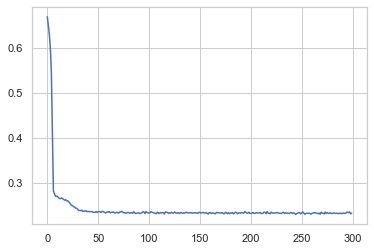

group_viol_FN
####################################################################################


In [23]:
keys = ['group_viol']#, 'group_recid']
subkeys = ['FP', 'FN']#, 'T']
y_val_predicted = {}
scores = ['Risk of Recidivism_decile_score/10', 'Risk of Recidivism_raw_score',
       'Risk of Violence_decile_score/10', 'Risk of Violence_raw_score']
models = {}
for key in keys:
    for subkey in subkeys:
        target = key + '_' + subkey
        original_target_name = target
        
        # Fit model
        device = "cpu"  # "cuda" if torch.cuda.is_available() else "cpu"
        model_pos, X_train_pos, X_val_pos, y_val_predicted_pos, losses_pos = fit_NN(X_train.loc[:, scores], 
                                                                                        X_val.loc[:,scores],
                                                                                        y_train,
                                                                                        y_val,
                                                                                        target, 
                                                                                        scales=False, regex_keys=None,
                                                                                        n_layers=10, n_hidden=20, n_epochs=300, weighting=True,
                                                                                        batch_size=256,
                                                                                        device=device, return_loss=True)
        models[target] = model_pos
        plt.plot(losses_pos)
        plt.show()
            

            
        y_val_predicted[target] = y_val_predicted_pos
        
        print(target)
        print("####################################################################################")

group_viol_FP
--Correct: 983
--Wrong:   97


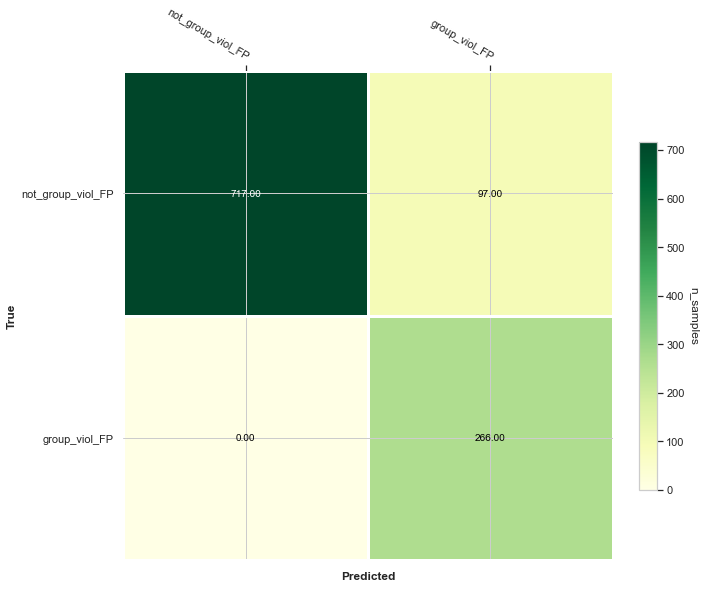

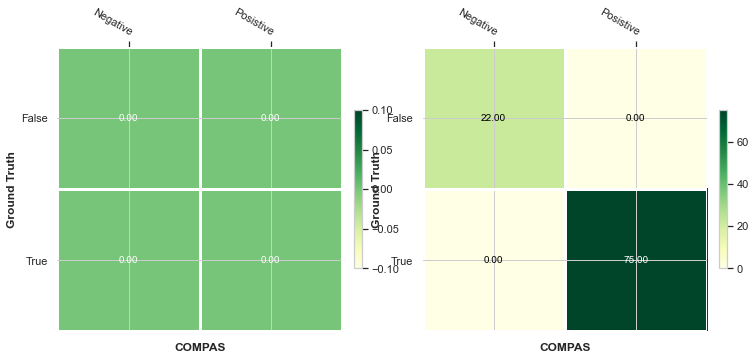

Risk of Recidivism_decile_score/10


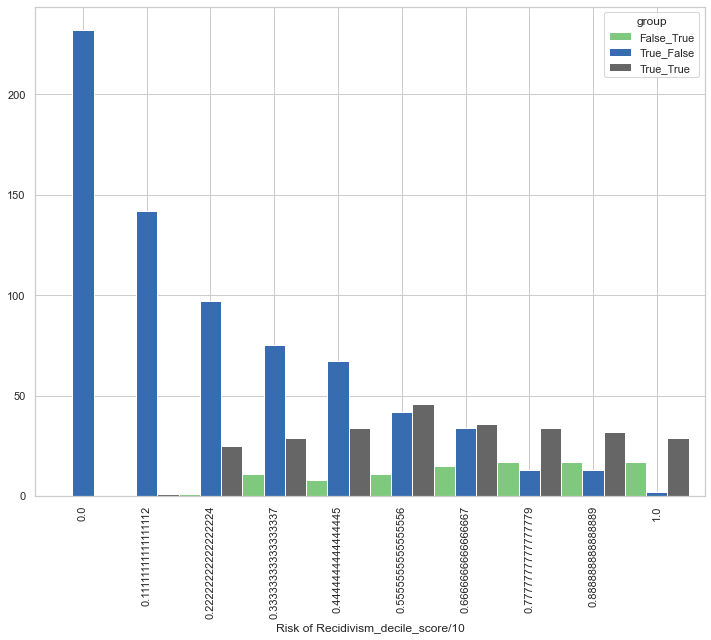

Risk of Recidivism_raw_score


In [ ]:
for key in keys:
    for subkey in subkeys:
        target = key + '_' + subkey
        print(target)
        

        y_val_predicted_t = [1 if x >=.5 else 0 for x in list(torch.sigmoid(torch.tensor(y_val_predicted[target])))]
        
        groups = []
        for i, el in enumerate(y_val_predicted_t):
            if y_val_predicted_t[i] == y_val[target][i] and y_val_predicted_t[i] >0:
                groups.append('True_True')
            elif y_val_predicted_t[i] == y_val[target][i] and y_val_predicted_t[i] <0:
                groups.append('False_False')
            elif y_val_predicted_t[i] != y_val[target][i] and y_val_predicted_t[i] >0:
                groups.append('False_True')
            else:
                groups.append('True_False')

        
        y_val_predicted["correct"] = [int(y_val[target][i] == y_val_predicted_t[i]) for i in range(len(y_val_predicted_t))]

        print("--Correct:", sum(y_val_predicted["correct"]))
        print("--Wrong:  ", len(y_val[target]) - sum(y_val_predicted["correct"]))
        
        fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(12,9))
        mat = confusion_matrix(y_val[target], y_val_predicted_t)
        im, cbar = plot_helpers.heatmap(mat, ["not_" + target, target], ["not_" + target, target], ax=axs,
                                       cmap="YlGn", cbarlabel="n_samples")
        texts = plot_helpers.annotate_heatmap(im, valfmt="{x:.2f}")
        axs.set_xlabel('Predicted', fontweight='bold')
        axs.set_ylabel('True', fontweight='bold')
        #axs.set_title('Prediction Results on ' + target + ' for ' + text, fontsize=20, fontweight='bold',
        #                  loc='left')
        plt.show()
        
        
        # Show confusion matrices (true VS compas) for the off-diagonal cells
        subcategories = [[0,1], [1,0]]  # off-diagonals
        fig, axs = plt.subplots(nrows=1, ncols=len(subcategories), figsize=(12,9))
        for s, sub in enumerate(subcategories):   
            if "viol" in key:
                gt = 'recid_violent'
                compas = 'Risk of Violence_decile_score'
            else:
                gt = 'recid'
                compas = 'Risk of Recidivism_decile_score'

            gt_data = y_val[gt] # true value
            compas_data = y_val[compas]>4 # compas predicted
            # selector selects where our prediction disagrees with compas
            selector = [y_val_predicted_t[i] == sub[0] and y_val[target][i] == sub[1] for i in range(len(y_val))] 
            mat = numpy.zeros([2,2])
            for i in range(len(selector)):
                if selector[i]:
                    g = int(int(gt_data[i]) == int(compas_data[i]))
                    c = int(compas_data[i])
                    mat[c,g] += 1

            im, cbar = plot_helpers.heatmap(mat, ["False","True"], ["Negative","Posistive"], ax=axs[s],
                                           cmap="YlGn")
            texts = plot_helpers.annotate_heatmap(im, valfmt="{x:.2f}")
            axs[s].set_xlabel('COMPAS', fontweight='bold')
            axs[s].set_ylabel('Ground Truth', fontweight='bold')
        plt.show()        

        
        labs = ['True_True', 'False_False', 'False_True', 'True_False']
        for feature in list(X_val.loc[:,scores].columns):
            print(feature)
            fig, axs = plt.subplots(nrows = 1, ncols = 1, figsize=(12,9))
            
            df = X_val.loc[:,[feature]].copy(deep=True)
            df['dummy'] = 1
            df['group'] = groups
            ag = df.groupby([feature,'group']).sum().unstack()
            ag.columns = ag.columns.droplevel()

            axs = ag.plot(kind = 'bar', colormap = cm.Accent, width = 1, ax=axs)
            plt.show()
        
        
        print("########################################################################################")

### Everything except scores as input

  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Using device cpu
Epoch: 1/300
Train BCEwL 0.667:
Epoch: 2/300
Train BCEwL 0.644:
Epoch: 3/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.623:
Epoch: 4/300
Train BCEwL 0.600:
Epoch: 5/300
Train BCEwL 0.577:
Epoch: 6/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.564:
Epoch: 7/300
Train BCEwL 0.554:
Epoch: 8/300
Train BCEwL 0.545:
Epoch: 9/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.531:
Epoch: 10/300
Train BCEwL 0.519:
Epoch: 11/300
Train BCEwL 0.505:
Epoch: 12/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.493:
Epoch: 13/300
Train BCEwL 0.483:
Epoch: 14/300
Train BCEwL 0.468:
Epoch: 15/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.457:
Epoch: 16/300
Train BCEwL 0.446:
Epoch: 17/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.436:
Epoch: 18/300
Train BCEwL 0.426:
Epoch: 19/300
Train BCEwL 0.421:
Epoch: 20/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.414:
Epoch: 21/300
Train BCEwL 0.411:
Epoch: 22/300
Train BCEwL 0.404:
Epoch: 23/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.401:
Epoch: 24/300
Train BCEwL 0.399:
Epoch: 25/300
Train BCEwL 0.395:
Epoch: 26/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.397:
Epoch: 27/300
Train BCEwL 0.397:
Epoch: 28/300
Train BCEwL 0.389:
Epoch: 29/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.389:
Epoch: 30/300
Train BCEwL 0.388:
Epoch: 31/300
Train BCEwL 0.387:
Epoch: 32/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.387:
Epoch: 33/300
Train BCEwL 0.385:
Epoch: 34/300
Train BCEwL 0.383:
Epoch: 35/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.382:
Epoch: 36/300
Train BCEwL 0.381:
Epoch: 37/300
Train BCEwL 0.378:
Epoch: 38/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.378:
Epoch: 39/300
Train BCEwL 0.375:
Epoch: 40/300
Train BCEwL 0.377:
Epoch: 41/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.375:
Epoch: 42/300
Train BCEwL 0.374:
Epoch: 43/300
Train BCEwL 0.373:
Epoch: 44/300


100%|█████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 129.78it/s]

Train BCEwL 0.372:
Epoch: 45/300
Train BCEwL 0.370:
Epoch: 46/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.372:
Epoch: 47/300
Train BCEwL 0.370:
Epoch: 48/300
Train BCEwL 0.369:
Epoch: 49/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.368:
Epoch: 50/300
Train BCEwL 0.366:
Epoch: 51/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.364:
Epoch: 52/300
Train BCEwL 0.367:
Epoch: 53/300
Train BCEwL 0.362:
Epoch: 54/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.364:
Epoch: 55/300
Train BCEwL 0.365:
Epoch: 56/300
Train BCEwL 0.364:
Epoch: 57/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.361:
Epoch: 58/300
Train BCEwL 0.362:
Epoch: 59/300
Train BCEwL 0.362:
Epoch: 60/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.359:
Epoch: 61/300
Train BCEwL 0.359:
Epoch: 62/300
Train BCEwL 0.359:
Epoch: 63/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.360:
Epoch: 64/300
Train BCEwL 0.359:
Epoch: 65/300
Train BCEwL 0.362:
Epoch: 66/300


100%|█████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 123.98it/s]

Train BCEwL 0.358:
Epoch: 67/300
Train BCEwL 0.355:
Epoch: 68/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.354:
Epoch: 69/300
Train BCEwL 0.353:
Epoch: 70/300
Train BCEwL 0.358:
Epoch: 71/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.355:
Epoch: 72/300
Train BCEwL 0.353:
Epoch: 73/300
Train BCEwL 0.354:
Epoch: 74/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.351:
Epoch: 75/300
Train BCEwL 0.351:
Epoch: 76/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.356:
Epoch: 77/300
Train BCEwL 0.356:
Epoch: 78/300
Train BCEwL 0.351:
Epoch: 79/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.351:
Epoch: 80/300
Train BCEwL 0.348:
Epoch: 81/300
Train BCEwL 0.348:
Epoch: 82/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.350:
Epoch: 83/300
Train BCEwL 0.348:
Epoch: 84/300
Train BCEwL 0.348:
Epoch: 85/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.351:
Epoch: 86/300
Train BCEwL 0.347:
Epoch: 87/300
Train BCEwL 0.346:
Epoch: 88/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.349:
Epoch: 89/300
Train BCEwL 0.346:
Epoch: 90/300
Train BCEwL 0.343:
Epoch: 91/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.345:
Epoch: 92/300
Train BCEwL 0.345:
Epoch: 93/300
Train BCEwL 0.346:
Epoch: 94/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.346:
Epoch: 95/300
Train BCEwL 0.347:
Epoch: 96/300
Train BCEwL 0.344:
Epoch: 97/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.344:
Epoch: 98/300
Train BCEwL 0.343:
Epoch: 99/300
Train BCEwL 0.341:
Epoch: 100/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.341:
Epoch: 101/300
Train BCEwL 0.341:
Epoch: 102/300
Train BCEwL 0.342:
Epoch: 103/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.339:
Epoch: 104/300
Train BCEwL 0.343:
Epoch: 105/300
Train BCEwL 0.340:
Epoch: 106/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.338:
Epoch: 107/300
Train BCEwL 0.342:
Epoch: 108/300
Train BCEwL 0.339:
Epoch: 109/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.340:
Epoch: 110/300
Train BCEwL 0.336:
Epoch: 111/300
Train BCEwL 0.337:
Epoch: 112/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.338:
Epoch: 113/300
Train BCEwL 0.335:
Epoch: 114/300
Train BCEwL 0.338:
Epoch: 115/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.338:
Epoch: 116/300
Train BCEwL 0.336:
Epoch: 117/300
Train BCEwL 0.339:
Epoch: 118/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.335:
Epoch: 119/300
Train BCEwL 0.338:
Epoch: 120/300
Train BCEwL 0.336:
Epoch: 121/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.336:
Epoch: 122/300
Train BCEwL 0.335:
Epoch: 123/300
Train BCEwL 0.333:
Epoch: 124/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.334:
Epoch: 125/300
Train BCEwL 0.333:
Epoch: 126/300
Train BCEwL 0.333:
Epoch: 127/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.333:
Epoch: 128/300
Train BCEwL 0.332:
Epoch: 129/300
Train BCEwL 0.332:
Epoch: 130/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.333:
Epoch: 131/300
Train BCEwL 0.333:
Epoch: 132/300
Train BCEwL 0.334:
Epoch: 133/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.331:
Epoch: 134/300
Train BCEwL 0.329:
Epoch: 135/300
Train BCEwL 0.328:
Epoch: 136/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.331:
Epoch: 137/300
Train BCEwL 0.329:
Epoch: 138/300
Train BCEwL 0.331:
Epoch: 139/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.328:
Epoch: 140/300
Train BCEwL 0.328:
Epoch: 141/300
Train BCEwL 0.328:
Epoch: 142/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.331:
Epoch: 143/300
Train BCEwL 0.331:
Epoch: 144/300
Train BCEwL 0.330:
Epoch: 145/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.325:
Epoch: 146/300
Train BCEwL 0.326:
Epoch: 147/300
Train BCEwL 0.328:
Epoch: 148/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.326:
Epoch: 149/300
Train BCEwL 0.328:
Epoch: 150/300
Train BCEwL 0.325:
Epoch: 151/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.326:
Epoch: 152/300
Train BCEwL 0.327:
Epoch: 153/300
Train BCEwL 0.324:
Epoch: 154/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.326:
Epoch: 155/300
Train BCEwL 0.324:
Epoch: 156/300
Train BCEwL 0.321:
Epoch: 157/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.324:
Epoch: 158/300
Train BCEwL 0.325:
Epoch: 159/300
Train BCEwL 0.323:
Epoch: 160/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.323:
Epoch: 161/300
Train BCEwL 0.321:
Epoch: 162/300
Train BCEwL 0.322:
Epoch: 163/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.320:
Epoch: 164/300
Train BCEwL 0.319:
Epoch: 165/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.323:
Epoch: 166/300
Train BCEwL 0.319:
Epoch: 167/300
Train BCEwL 0.325:
Epoch: 168/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.320:
Epoch: 169/300
Train BCEwL 0.318:
Epoch: 170/300
Train BCEwL 0.319:
Epoch: 171/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.318:
Epoch: 172/300
Train BCEwL 0.319:
Epoch: 173/300
Train BCEwL 0.319:
Epoch: 174/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.318:
Epoch: 175/300
Train BCEwL 0.323:
Epoch: 176/300
Train BCEwL 0.319:
Epoch: 177/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.316:
Epoch: 178/300
Train BCEwL 0.315:
Epoch: 179/300
Train BCEwL 0.312:
Epoch: 180/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.314:
Epoch: 181/300
Train BCEwL 0.312:
Epoch: 182/300
Train BCEwL 0.312:
Epoch: 183/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.313:
Epoch: 184/300
Train BCEwL 0.313:
Epoch: 185/300
Train BCEwL 0.316:
Epoch: 186/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.316:
Epoch: 187/300
Train BCEwL 0.311:
Epoch: 188/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.312:
Epoch: 189/300
Train BCEwL 0.312:
Epoch: 190/300
Train BCEwL 0.312:
Epoch: 191/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.311:
Epoch: 192/300
Train BCEwL 0.312:
Epoch: 193/300
Train BCEwL 0.310:
Epoch: 194/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.310:
Epoch: 195/300
Train BCEwL 0.307:
Epoch: 196/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.308:
Epoch: 197/300
Train BCEwL 0.306:
Epoch: 198/300
Train BCEwL 0.307:
Epoch: 199/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.306:
Epoch: 200/300
Train BCEwL 0.305:
Epoch: 201/300
Train BCEwL 0.309:
Epoch: 202/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.309:
Epoch: 203/300
Train BCEwL 0.307:
Epoch: 204/300
Train BCEwL 0.304:
Epoch: 205/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.307:
Epoch: 206/300
Train BCEwL 0.303:
Epoch: 207/300
Train BCEwL 0.301:
Epoch: 208/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.305:
Epoch: 209/300
Train BCEwL 0.304:
Epoch: 210/300
Train BCEwL 0.304:
Epoch: 211/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.305:
Epoch: 212/300
Train BCEwL 0.299:
Epoch: 213/300
Train BCEwL 0.301:
Epoch: 214/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.306:
Epoch: 215/300
Train BCEwL 0.314:
Epoch: 216/300
Train BCEwL 0.303:
Epoch: 217/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.299:
Epoch: 218/300
Train BCEwL 0.301:
Epoch: 219/300
Train BCEwL 0.299:
Epoch: 220/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.305:
Epoch: 221/300
Train BCEwL 0.301:
Epoch: 222/300
Train BCEwL 0.307:
Epoch: 223/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.307:
Epoch: 224/300
Train BCEwL 0.300:
Epoch: 225/300
Train BCEwL 0.300:
Epoch: 226/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.297:
Epoch: 227/300
Train BCEwL 0.298:
Epoch: 228/300
Train BCEwL 0.297:
Epoch: 229/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.295:
Epoch: 230/300
Train BCEwL 0.294:
Epoch: 231/300
Train BCEwL 0.297:
Epoch: 232/300


100%|█████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 153.62it/s]


Train BCEwL 0.293:
Epoch: 233/300
Train BCEwL 0.295:
Epoch: 234/300
Train BCEwL 0.296:
Epoch: 235/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.302:
Epoch: 236/300
Train BCEwL 0.294:
Epoch: 237/300
Train BCEwL 0.293:
Epoch: 238/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.294:
Epoch: 239/300
Train BCEwL 0.295:
Epoch: 240/300
Train BCEwL 0.296:
Epoch: 241/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.297:
Epoch: 242/300
Train BCEwL 0.293:
Epoch: 243/300
Train BCEwL 0.295:
Epoch: 244/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.292:
Epoch: 245/300
Train BCEwL 0.294:
Epoch: 246/300
Train BCEwL 0.296:
Epoch: 247/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.295:
Epoch: 248/300
Train BCEwL 0.297:
Epoch: 249/300
Train BCEwL 0.292:
Epoch: 250/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.296:
Epoch: 251/300
Train BCEwL 0.291:
Epoch: 252/300
Train BCEwL 0.291:
Epoch: 253/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.294:
Epoch: 254/300
Train BCEwL 0.291:
Epoch: 255/300
Train BCEwL 0.289:
Epoch: 256/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.289:
Epoch: 257/300
Train BCEwL 0.291:
Epoch: 258/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.289:
Epoch: 259/300
Train BCEwL 0.292:
Epoch: 260/300
Train BCEwL 0.287:
Epoch: 261/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.291:
Epoch: 262/300
Train BCEwL 0.291:
Epoch: 263/300
Train BCEwL 0.292:
Epoch: 264/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.294:
Epoch: 265/300
Train BCEwL 0.295:
Epoch: 266/300
Train BCEwL 0.286:
Epoch: 267/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.286:
Epoch: 268/300
Train BCEwL 0.284:
Epoch: 269/300
Train BCEwL 0.289:
Epoch: 270/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.289:
Epoch: 271/300
Train BCEwL 0.286:
Epoch: 272/300
Train BCEwL 0.289:
Epoch: 273/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.284:
Epoch: 274/300
Train BCEwL 0.286:
Epoch: 275/300
Train BCEwL 0.282:
Epoch: 276/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.284:
Epoch: 277/300
Train BCEwL 0.282:
Epoch: 278/300
Train BCEwL 0.283:
Epoch: 279/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.281:
Epoch: 280/300
Train BCEwL 0.282:
Epoch: 281/300
Train BCEwL 0.282:
Epoch: 282/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.285:
Epoch: 283/300
Train BCEwL 0.285:
Epoch: 284/300
Train BCEwL 0.283:
Epoch: 285/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.284:
Epoch: 286/300
Train BCEwL 0.280:
Epoch: 287/300
Train BCEwL 0.281:
Epoch: 288/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.281:
Epoch: 289/300
Train BCEwL 0.278:
Epoch: 290/300
Train BCEwL 0.281:
Epoch: 291/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.282:
Epoch: 292/300
Train BCEwL 0.281:
Epoch: 293/300
Train BCEwL 0.283:
Epoch: 294/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.279:
Epoch: 295/300
Train BCEwL 0.279:
Epoch: 296/300
Train BCEwL 0.282:
Epoch: 297/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.279:
Epoch: 298/300
Train BCEwL 0.281:
Epoch: 299/300
Train BCEwL 0.279:
Epoch: 300/300


100%|█████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 154.01it/s]


Train BCEwL 0.279:
AUC: 0.8263010105115368
Validation RMSE 3.256:
Validation BCEwL 0.489:


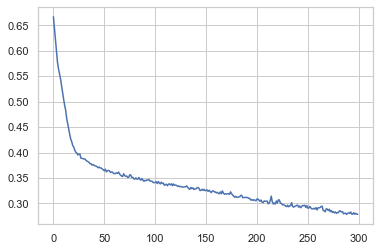

group_viol_FP
####################################################################################
Using device cpu
Epoch: 1/300

  0%|                                                                                           | 0/13 [00:00<?, ?it/s]


Train BCEwL 0.586:
Epoch: 2/300
Train BCEwL 0.540:
Epoch: 3/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.489:
Epoch: 4/300
Train BCEwL 0.422:
Epoch: 5/300
Train BCEwL 0.342:
Epoch: 6/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.290:
Epoch: 7/300
Train BCEwL 0.284:
Epoch: 8/300
Train BCEwL 0.284:
Epoch: 9/300


100%|█████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 129.56it/s]

Train BCEwL 0.279:
Epoch: 10/300
Train BCEwL 0.278:
Epoch: 11/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.275:
Epoch: 12/300
Train BCEwL 0.275:
Epoch: 13/300
Train BCEwL 0.274:
Epoch: 14/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.273:
Epoch: 15/300
Train BCEwL 0.274:
Epoch: 16/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.272:
Epoch: 17/300
Train BCEwL 0.274:
Epoch: 18/300
Train BCEwL 0.269:
Epoch: 19/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.269:
Epoch: 20/300
Train BCEwL 0.268:
Epoch: 21/300
Train BCEwL 0.265:
Epoch: 22/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.266:
Epoch: 23/300
Train BCEwL 0.266:
Epoch: 24/300
Train BCEwL 0.269:
Epoch: 25/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.264:
Epoch: 26/300
Train BCEwL 0.264:
Epoch: 27/300
Train BCEwL 0.262:
Epoch: 28/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.263:
Epoch: 29/300
Train BCEwL 0.262:
Epoch: 30/300
Train BCEwL 0.264:
Epoch: 31/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.263:
Epoch: 32/300
Train BCEwL 0.260:
Epoch: 33/300
Train BCEwL 0.261:
Epoch: 34/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.261:
Epoch: 35/300
Train BCEwL 0.258:
Epoch: 36/300
Train BCEwL 0.259:
Epoch: 37/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.259:
Epoch: 38/300
Train BCEwL 0.259:
Epoch: 39/300
Train BCEwL 0.258:
Epoch: 40/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.260:
Epoch: 41/300
Train BCEwL 0.257:
Epoch: 42/300
Train BCEwL 0.255:
Epoch: 43/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.256:
Epoch: 44/300
Train BCEwL 0.253:
Epoch: 45/300
Train BCEwL 0.254:
Epoch: 46/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.254:
Epoch: 47/300
Train BCEwL 0.253:
Epoch: 48/300
Train BCEwL 0.252:
Epoch: 49/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.250:
Epoch: 50/300
Train BCEwL 0.251:
Epoch: 51/300
Train BCEwL 0.251:
Epoch: 52/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.252:
Epoch: 53/300
Train BCEwL 0.250:
Epoch: 54/300
Train BCEwL 0.248:
Epoch: 55/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.248:
Epoch: 56/300
Train BCEwL 0.250:
Epoch: 57/300
Train BCEwL 0.246:
Epoch: 58/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.252:
Epoch: 59/300
Train BCEwL 0.249:
Epoch: 60/300
Train BCEwL 0.246:
Epoch: 61/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.246:
Epoch: 62/300
Train BCEwL 0.245:
Epoch: 63/300
Train BCEwL 0.243:
Epoch: 64/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.245:
Epoch: 65/300
Train BCEwL 0.242:
Epoch: 66/300
Train BCEwL 0.243:
Epoch: 67/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.240:
Epoch: 68/300
Train BCEwL 0.239:
Epoch: 69/300
Train BCEwL 0.239:
Epoch: 70/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.239:
Epoch: 71/300
Train BCEwL 0.243:
Epoch: 72/300
Train BCEwL 0.236:
Epoch: 73/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.240:
Epoch: 74/300
Train BCEwL 0.239:
Epoch: 75/300
Train BCEwL 0.238:
Epoch: 76/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.236:
Epoch: 77/300
Train BCEwL 0.236:
Epoch: 78/300
Train BCEwL 0.234:
Epoch: 79/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.233:
Epoch: 80/300
Train BCEwL 0.232:
Epoch: 81/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.231:
Epoch: 82/300
Train BCEwL 0.236:
Epoch: 83/300
Train BCEwL 0.231:
Epoch: 84/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.232:
Epoch: 85/300
Train BCEwL 0.229:
Epoch: 86/300
Train BCEwL 0.227:
Epoch: 87/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.228:
Epoch: 88/300
Train BCEwL 0.227:
Epoch: 89/300
Train BCEwL 0.226:
Epoch: 90/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.225:
Epoch: 91/300
Train BCEwL 0.229:
Epoch: 92/300
Train BCEwL 0.226:
Epoch: 93/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.225:
Epoch: 94/300
Train BCEwL 0.224:
Epoch: 95/300
Train BCEwL 0.224:
Epoch: 96/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.221:
Epoch: 97/300
Train BCEwL 0.224:
Epoch: 98/300
Train BCEwL 0.220:
Epoch: 99/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.222:
Epoch: 100/300
Train BCEwL 0.221:
Epoch: 101/300
Train BCEwL 0.221:
Epoch: 102/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.220:
Epoch: 103/300
Train BCEwL 0.219:
Epoch: 104/300
Train BCEwL 0.220:
Epoch: 105/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.217:
Epoch: 106/300
Train BCEwL 0.219:
Epoch: 107/300
Train BCEwL 0.219:
Epoch: 108/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.216:
Epoch: 109/300
Train BCEwL 0.216:
Epoch: 110/300
Train BCEwL 0.214:
Epoch: 111/300
Train BCEwL 0.214:
Epoch: 112/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.217:
Epoch: 113/300
Train BCEwL 0.215:
Epoch: 114/300
Train BCEwL 0.211:
Epoch: 115/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.213:
Epoch: 116/300
Train BCEwL 0.211:
Epoch: 117/300
Train BCEwL 0.209:
Epoch: 118/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.208:
Epoch: 119/300
Train BCEwL 0.209:
Epoch: 120/300
Train BCEwL 0.208:
Epoch: 121/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.207:
Epoch: 122/300
Train BCEwL 0.209:
Epoch: 123/300
Train BCEwL 0.206:
Epoch: 124/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.209:
Epoch: 125/300
Train BCEwL 0.210:
Epoch: 126/300
Train BCEwL 0.205:
Epoch: 127/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.208:
Epoch: 128/300
Train BCEwL 0.207:
Epoch: 129/300
Train BCEwL 0.205:
Epoch: 130/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.205:
Epoch: 131/300
Train BCEwL 0.204:
Epoch: 132/300
Train BCEwL 0.202:
Epoch: 133/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.204:
Epoch: 134/300
Train BCEwL 0.202:
Epoch: 135/300
Train BCEwL 0.201:
Epoch: 136/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.203:
Epoch: 137/300
Train BCEwL 0.200:
Epoch: 138/300
Train BCEwL 0.199:
Epoch: 139/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.198:
Epoch: 140/300
Train BCEwL 0.199:
Epoch: 141/300
Train BCEwL 0.202:
Epoch: 142/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.196:
Epoch: 143/300
Train BCEwL 0.201:
Epoch: 144/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.197:
Epoch: 145/300
Train BCEwL 0.199:
Epoch: 146/300
Train BCEwL 0.195:
Epoch: 147/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.196:
Epoch: 148/300
Train BCEwL 0.198:
Epoch: 149/300
Train BCEwL 0.195:
Epoch: 150/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.194:
Epoch: 151/300
Train BCEwL 0.198:
Epoch: 152/300
Train BCEwL 0.198:
Epoch: 153/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.195:
Epoch: 154/300
Train BCEwL 0.197:
Epoch: 155/300
Train BCEwL 0.192:
Epoch: 156/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.194:
Epoch: 157/300
Train BCEwL 0.195:
Epoch: 158/300
Train BCEwL 0.194:
Epoch: 159/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.192:
Epoch: 160/300
Train BCEwL 0.194:
Epoch: 161/300
Train BCEwL 0.194:
Epoch: 162/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.196:
Epoch: 163/300
Train BCEwL 0.194:
Epoch: 164/300
Train BCEwL 0.192:
Epoch: 165/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.191:
Epoch: 166/300
Train BCEwL 0.193:
Epoch: 167/300
Train BCEwL 0.192:
Epoch: 168/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.190:
Epoch: 169/300
Train BCEwL 0.193:
Epoch: 170/300
Train BCEwL 0.190:
Epoch: 171/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.187:
Epoch: 172/300
Train BCEwL 0.187:
Epoch: 173/300
Train BCEwL 0.187:
Epoch: 174/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.185:
Epoch: 175/300
Train BCEwL 0.188:
Epoch: 176/300
Train BCEwL 0.187:
Epoch: 177/300


100%|█████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 188.33it/s]


Train BCEwL 0.187:
Epoch: 178/300
Train BCEwL 0.186:
Epoch: 179/300
Train BCEwL 0.184:

  0%|                                                                                           | 0/13 [00:00<?, ?it/s]


Epoch: 180/300
Train BCEwL 0.184:
Epoch: 181/300
Train BCEwL 0.185:
Epoch: 182/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.184:
Epoch: 183/300
Train BCEwL 0.189:
Epoch: 184/300
Train BCEwL 0.188:
Epoch: 185/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.186:
Epoch: 186/300
Train BCEwL 0.186:
Epoch: 187/300
Train BCEwL 0.183:
Epoch: 188/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.184:
Epoch: 189/300
Train BCEwL 0.184:
Epoch: 190/300
Train BCEwL 0.183:
Epoch: 191/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.182:
Epoch: 192/300
Train BCEwL 0.182:
Epoch: 193/300
Train BCEwL 0.182:
Epoch: 194/300


 85%|████████████████████████████████████████████████████████████████████▌            | 11/13 [00:00<00:00, 108.44it/s]

Train BCEwL 0.185:
Epoch: 195/300
Train BCEwL 0.186:
Epoch: 196/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.188:
Epoch: 197/300
Train BCEwL 0.182:
Epoch: 198/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.182:
Epoch: 199/300
Train BCEwL 0.183:
Epoch: 200/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.184:
Epoch: 201/300
Train BCEwL 0.187:
Epoch: 202/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.182:
Epoch: 203/300
Train BCEwL 0.178:
Epoch: 204/300
Train BCEwL 0.179:
Epoch: 205/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.187:
Epoch: 206/300
Train BCEwL 0.182:
Epoch: 207/300


100%|█████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 164.78it/s]

Train BCEwL 0.179:
Epoch: 208/300
Train BCEwL 0.180:
Epoch: 209/300
Train BCEwL 0.180:
Epoch: 210/300



  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.180:
Epoch: 211/300
Train BCEwL 0.180:
Epoch: 212/300
Train BCEwL 0.179:
Epoch: 213/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.180:
Epoch: 214/300
Train BCEwL 0.181:
Epoch: 215/300
Train BCEwL 0.178:
Epoch: 216/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.176:
Epoch: 217/300
Train BCEwL 0.177:
Epoch: 218/300
Train BCEwL 0.177:
Epoch: 219/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.175:
Epoch: 220/300
Train BCEwL 0.176:
Epoch: 221/300
Train BCEwL 0.180:
Epoch: 222/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.178:
Epoch: 223/300
Train BCEwL 0.175:
Epoch: 224/300
Train BCEwL 0.174:
Epoch: 225/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.176:
Epoch: 226/300
Train BCEwL 0.178:
Epoch: 227/300
Train BCEwL 0.175:
Epoch: 228/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.175:
Epoch: 229/300
Train BCEwL 0.174:
Epoch: 230/300
Train BCEwL 0.174:
Epoch: 231/300


100%|█████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 143.64it/s]

Train BCEwL 0.175:
Epoch: 232/300
Train BCEwL 0.173:
Epoch: 233/300
Train BCEwL 0.173:
Epoch: 234/300



  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.172:
Epoch: 235/300
Train BCEwL 0.172:
Epoch: 236/300
Train BCEwL 0.173:
Epoch: 237/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.171:
Epoch: 238/300
Train BCEwL 0.173:
Epoch: 239/300
Train BCEwL 0.176:
Epoch: 240/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.171:
Epoch: 241/300
Train BCEwL 0.174:
Epoch: 242/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.176:
Epoch: 243/300
Train BCEwL 0.176:
Epoch: 244/300
Train BCEwL 0.175:
Epoch: 245/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.176:
Epoch: 246/300
Train BCEwL 0.173:
Epoch: 247/300
Train BCEwL 0.171:
Epoch: 248/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.174:
Epoch: 249/300
Train BCEwL 0.172:
Epoch: 250/300
Train BCEwL 0.175:
Epoch: 251/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.176:
Epoch: 252/300
Train BCEwL 0.178:
Epoch: 253/300
Train BCEwL 0.178:
Epoch: 254/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.177:
Epoch: 255/300
Train BCEwL 0.175:
Epoch: 256/300
Train BCEwL 0.172:
Epoch: 257/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.170:
Epoch: 258/300
Train BCEwL 0.170:
Epoch: 259/300
Train BCEwL 0.168:
Epoch: 260/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.169:
Epoch: 261/300
Train BCEwL 0.169:
Epoch: 262/300
Train BCEwL 0.166:
Epoch: 263/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.168:
Epoch: 264/300
Train BCEwL 0.167:
Epoch: 265/300
Train BCEwL 0.168:
Epoch: 266/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.167:
Epoch: 267/300
Train BCEwL 0.168:
Epoch: 268/300
Train BCEwL 0.170:
Epoch: 269/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.171:
Epoch: 270/300
Train BCEwL 0.170:
Epoch: 271/300
Train BCEwL 0.167:
Epoch: 272/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.166:
Epoch: 273/300
Train BCEwL 0.167:
Epoch: 274/300
Train BCEwL 0.165:
Epoch: 275/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.164:
Epoch: 276/300
Train BCEwL 0.167:
Epoch: 277/300
Train BCEwL 0.167:
Epoch: 278/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.165:
Epoch: 279/300
Train BCEwL 0.166:
Epoch: 280/300
Train BCEwL 0.165:
Epoch: 281/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.163:
Epoch: 282/300
Train BCEwL 0.166:
Epoch: 283/300
Train BCEwL 0.164:
Epoch: 284/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.167:
Epoch: 285/300
Train BCEwL 0.167:
Epoch: 286/300
Train BCEwL 0.169:
Epoch: 287/300


100%|█████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 188.23it/s]

Train BCEwL 0.165:
Epoch: 288/300
Train BCEwL 0.164:
Epoch: 289/300



  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.164:
Epoch: 290/300
Train BCEwL 0.167:
Epoch: 291/300
Train BCEwL 0.165:
Epoch: 292/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.163:
Epoch: 293/300
Train BCEwL 0.165:
Epoch: 294/300
Train BCEwL 0.164:
Epoch: 295/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.163:
Epoch: 296/300
Train BCEwL 0.165:
Epoch: 297/300
Train BCEwL 0.164:
Epoch: 298/300


100%|█████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 146.46it/s]


Train BCEwL 0.164:
Epoch: 299/300
Train BCEwL 0.162:
Epoch: 300/300
Train BCEwL 0.162:
AUC: 0.5576705798059964
Validation RMSE 5.158:
Validation BCEwL 0.434:


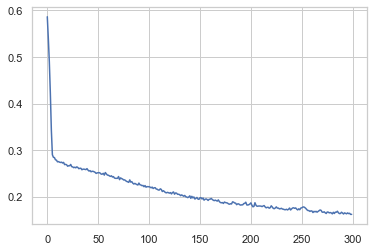

group_viol_FN
####################################################################################


In [19]:
keys = ['group_viol']#, 'group_recid']
subkeys = ['FP', 'FN']#, 'T']
y_val_predicted = {}
scores = ['Risk of Recidivism_decile_score/10', 'Risk of Recidivism_raw_score',
       'Risk of Violence_decile_score/10', 'Risk of Violence_raw_score']
models = {}
for key in keys:
    for subkey in subkeys:
        target = key + '_' + subkey
        original_target_name = target
        
        # Fit model
        device = "cpu"  # "cuda" if torch.cuda.is_available() else "cpu"
        model_pos, X_train_pos, X_val_pos, y_val_predicted_pos, losses_pos = fit_NN(X_train.loc[:, ~X_train.columns.isin(scores)], 
                                                                                        X_val.loc[:,~X_val.columns.isin(scores)],
                                                                                        y_train,
                                                                                        y_val,
                                                                                        target, 
                                                                                        scales=False, regex_keys=None,
                                                                                        n_layers=3, n_hidden=20, n_epochs=300, weighting=True,
                                                                                        batch_size=256,
                                                                                        device=device, return_loss=True)
        models[target] = model_pos
        plt.plot(losses_pos)
        plt.show()
            

            
        y_val_predicted[target] = y_val_predicted_pos
        
        print(target)
        print("####################################################################################")

group_viol_FP
--Correct: 868
--Wrong:   212


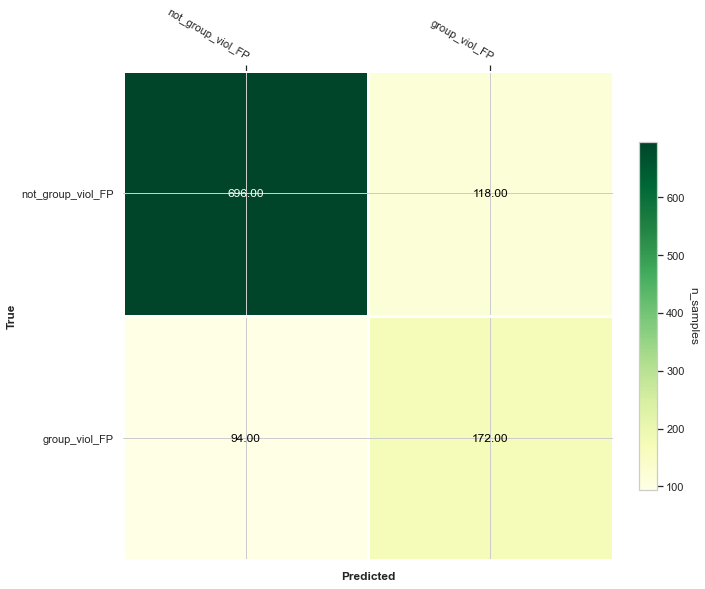

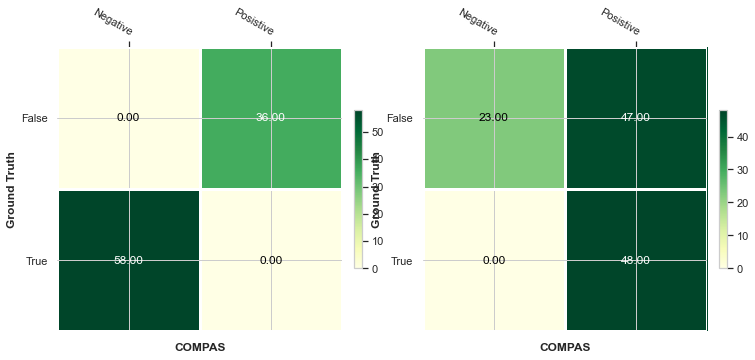

########################################################################################
group_viol_FN
--Correct: 986
--Wrong:   94


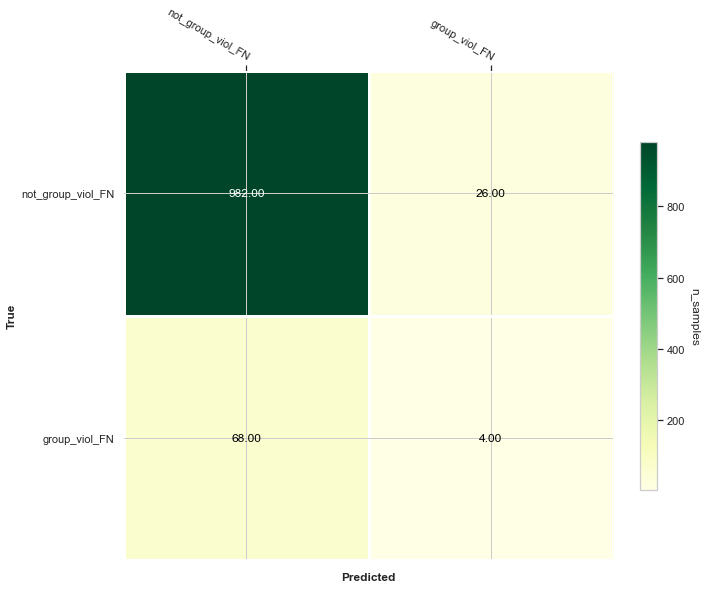

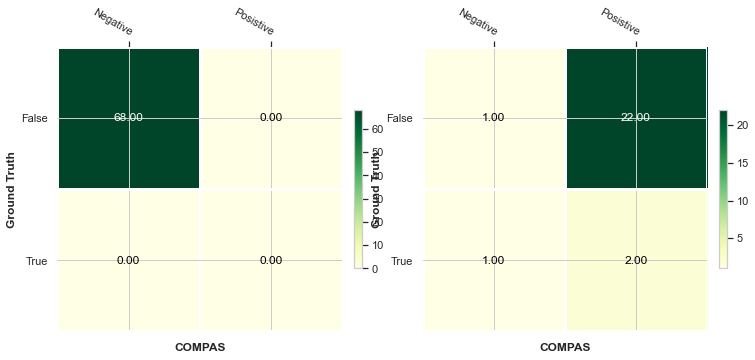

########################################################################################


In [21]:
for key in keys:
    for subkey in subkeys:
        target = key + '_' + subkey
        print(target)
        

        y_val_predicted_t = [1 if x >=.5 else 0 for x in list(torch.sigmoid(torch.tensor(y_val_predicted[target])))]


        
        y_val_predicted["correct"] = [int(y_val[target][i] == y_val_predicted_t[i]) for i in range(len(y_val_predicted_t))]

        print("--Correct:", sum(y_val_predicted["correct"]))
        print("--Wrong:  ", len(y_val[target]) - sum(y_val_predicted["correct"]))
        
        
        fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(12,9))
        mat = confusion_matrix(y_val[target], y_val_predicted_t)
        im, cbar = plot_helpers.heatmap(mat, ["not_" + target, target], ["not_" + target, target], ax=axs,
                                       cmap="YlGn", cbarlabel="n_samples")
        texts = plot_helpers.annotate_heatmap(im, valfmt="{x:.2f}")
        axs.set_xlabel('Predicted', fontweight='bold')
        axs.set_ylabel('True', fontweight='bold')
        #axs.set_title('Prediction Results on ' + target + ' for ' + text, fontsize=20, fontweight='bold',
        #                  loc='left')
        plt.show()
        
        
        # Show confusion matrices (true VS compas) for the off-diagonal cells
        subcategories = [[0,1], [1,0]]  # off-diagonals
        fig, axs = plt.subplots(nrows=1, ncols=len(subcategories), figsize=(12,9))
        for s, sub in enumerate(subcategories):   
            if "viol" in key:
                gt = 'recid_violent'
                compas = 'Risk of Violence_decile_score'
            else:
                gt = 'recid'
                compas = 'Risk of Recidivism_decile_score'

            gt_data = y_val[gt] # true value
            compas_data = y_val[compas]>4 # compas predicted
            # selector selects where our prediction disagrees with compas
            selector = [y_val_predicted_t[i] == sub[0] and y_val[target][i] == sub[1] for i in range(len(y_val))] 
            mat = numpy.zeros([2,2])
            for i in range(len(selector)):
                if selector[i]:
                    g = int(int(gt_data[i]) == int(compas_data[i]))
                    c = int(compas_data[i])
                    mat[c,g] += 1

            im, cbar = plot_helpers.heatmap(mat, ["False","True"], ["Negative","Posistive"], ax=axs[s],
                                           cmap="YlGn")
            texts = plot_helpers.annotate_heatmap(im, valfmt="{x:.2f}")
            axs[s].set_xlabel('COMPAS', fontweight='bold')
            axs[s].set_ylabel('Ground Truth', fontweight='bold')
        plt.show()
        
        
        print("########################################################################################")

### Pick best model

We are very good with scores only. So we retrain taht model and pick it for the further evaluation

  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Using device cpu
Epoch: 1/300
Train BCEwL 0.670:
Epoch: 2/300
Train BCEwL 0.653:
Epoch: 3/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.634:
Epoch: 4/300
Train BCEwL 0.605:
Epoch: 5/300


 85%|████████████████████████████████████████████████████████████████████▌            | 11/13 [00:00<00:00, 109.74it/s]

Train BCEwL 0.572:
Epoch: 6/300
Train BCEwL 0.560:
Epoch: 7/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.539:
Epoch: 8/300
Train BCEwL 0.488:
Epoch: 9/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.401:
Epoch: 10/300
Train BCEwL 0.342:
Epoch: 11/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.306:
Epoch: 12/300
Train BCEwL 0.281:
Epoch: 13/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.259:
Epoch: 14/300
Train BCEwL 0.243:
Epoch: 15/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.233:
Epoch: 16/300
Train BCEwL 0.220:
Epoch: 17/300


 77%|███████████████████████████████████████████████████████████████                   | 10/13 [00:00<00:00, 99.76it/s]

Train BCEwL 0.204:
Epoch: 18/300
Train BCEwL 0.194:
Epoch: 19/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.193:
Epoch: 20/300
Train BCEwL 0.191:
Epoch: 21/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.191:
Epoch: 22/300
Train BCEwL 0.190:
Epoch: 23/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.190:
Epoch: 24/300
Train BCEwL 0.192:
Epoch: 25/300
Train BCEwL 0.189:
Epoch: 26/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.191:
Epoch: 27/300
Train BCEwL 0.190:
Epoch: 28/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.190:
Epoch: 29/300
Train BCEwL 0.190:
Epoch: 30/300


 85%|████████████████████████████████████████████████████████████████████▌            | 11/13 [00:00<00:00, 109.74it/s]

Train BCEwL 0.187:
Epoch: 31/300
Train BCEwL 0.189:
Epoch: 32/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.189:
Epoch: 33/300
Train BCEwL 0.188:
Epoch: 34/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.188:
Epoch: 35/300
Train BCEwL 0.187:
Epoch: 36/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.186:
Epoch: 37/300
Train BCEwL 0.186:
Epoch: 38/300
Train BCEwL 0.187:
Epoch: 39/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.187:
Epoch: 40/300
Train BCEwL 0.187:
Epoch: 41/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.187:
Epoch: 42/300
Train BCEwL 0.186:
Epoch: 43/300
Train BCEwL 0.188:
Epoch: 44/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.188:
Epoch: 45/300
Train BCEwL 0.188:
Epoch: 46/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.188:
Epoch: 47/300
Train BCEwL 0.186:
Epoch: 48/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.186:
Epoch: 49/300
Train BCEwL 0.187:
Epoch: 50/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.186:
Epoch: 51/300
Train BCEwL 0.187:
Epoch: 52/300
Train BCEwL 0.186:
Epoch: 53/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.185:
Epoch: 54/300
Train BCEwL 0.185:
Epoch: 55/300


100%|█████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 166.43it/s]


Train BCEwL 0.187:
Epoch: 56/300
Train BCEwL 0.185:
Epoch: 57/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.184:
Epoch: 58/300
Train BCEwL 0.185:
Epoch: 59/300


100%|█████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 166.36it/s]


Train BCEwL 0.186:
Epoch: 60/300
Train BCEwL 0.186:
Epoch: 61/300


 85%|████████████████████████████████████████████████████████████████████▌            | 11/13 [00:00<00:00, 108.12it/s]

Train BCEwL 0.184:
Epoch: 62/300
Train BCEwL 0.186:
Epoch: 63/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.186:
Epoch: 64/300
Train BCEwL 0.185:
Epoch: 65/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.188:
Epoch: 66/300
Train BCEwL 0.186:
Epoch: 67/300
Train BCEwL 0.185:
Epoch: 68/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.185:
Epoch: 69/300
Train BCEwL 0.187:
Epoch: 70/300
Train BCEwL 0.186:
Epoch: 71/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.186:
Epoch: 72/300
Train BCEwL 0.205:
Epoch: 73/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.209:
Epoch: 74/300
Train BCEwL 0.189:
Epoch: 75/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.187:
Epoch: 76/300
Train BCEwL 0.185:
Epoch: 77/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.187:
Epoch: 78/300
Train BCEwL 0.185:
Epoch: 79/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.186:
Epoch: 80/300
Train BCEwL 0.185:
Epoch: 81/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.186:
Epoch: 82/300
Train BCEwL 0.186:
Epoch: 83/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.184:
Epoch: 84/300
Train BCEwL 0.186:
Epoch: 85/300


 85%|████████████████████████████████████████████████████████████████████▌            | 11/13 [00:00<00:00, 109.70it/s]

Train BCEwL 0.185:
Epoch: 86/300
Train BCEwL 0.186:
Epoch: 87/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.185:
Epoch: 88/300
Train BCEwL 0.185:
Epoch: 89/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.185:
Epoch: 90/300
Train BCEwL 0.187:
Epoch: 91/300
Train BCEwL 0.184:
Epoch: 92/300


100%|█████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 129.60it/s]

Train BCEwL 0.186:
Epoch: 93/300
Train BCEwL 0.185:
Epoch: 94/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.185:
Epoch: 95/300
Train BCEwL 0.186:
Epoch: 96/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.185:
Epoch: 97/300
Train BCEwL 0.185:
Epoch: 98/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.185:
Epoch: 99/300
Train BCEwL 0.184:
Epoch: 100/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.186:
Epoch: 101/300
Train BCEwL 0.185:
Epoch: 102/300


 85%|████████████████████████████████████████████████████████████████████▌            | 11/13 [00:00<00:00, 109.74it/s]

Train BCEwL 0.184:
Epoch: 103/300
Train BCEwL 0.186:
Epoch: 104/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.185:
Epoch: 105/300
Train BCEwL 0.186:
Epoch: 106/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.185:
Epoch: 107/300
Train BCEwL 0.185:
Epoch: 108/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.185:
Epoch: 109/300
Train BCEwL 0.186:
Epoch: 110/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.185:
Epoch: 111/300
Train BCEwL 0.186:
Epoch: 112/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.185:
Epoch: 113/300
Train BCEwL 0.185:
Epoch: 114/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.185:
Epoch: 115/300
Train BCEwL 0.185:
Epoch: 116/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.184:
Epoch: 117/300
Train BCEwL 0.185:
Epoch: 118/300
Train BCEwL 0.186:
Epoch: 119/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.186:
Epoch: 120/300
Train BCEwL 0.186:
Epoch: 121/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.186:
Epoch: 122/300
Train BCEwL 0.186:
Epoch: 123/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.185:
Epoch: 124/300
Train BCEwL 0.187:
Epoch: 125/300


100%|█████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 129.65it/s]

Train BCEwL 0.186:
Epoch: 126/300
Train BCEwL 0.186:
Epoch: 127/300


 92%|██████████████████████████████████████████████████████████████████████████▊      | 12/13 [00:00<00:00, 119.69it/s]

Train BCEwL 0.186:
Epoch: 128/300
Train BCEwL 0.185:
Epoch: 129/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.186:
Epoch: 130/300
Train BCEwL 0.185:
Epoch: 131/300


 15%|████████████▊                                                                      | 2/13 [00:00<00:00, 19.94it/s]

Train BCEwL 0.184:
Epoch: 132/300
Train BCEwL 0.184:
Epoch: 133/300


100%|█████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 129.70it/s]

Train BCEwL 0.186:
Epoch: 134/300
Train BCEwL 0.186:
Epoch: 135/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.185:
Epoch: 136/300
Train BCEwL 0.185:
Epoch: 137/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.184:
Epoch: 138/300
Train BCEwL 0.184:
Epoch: 139/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.185:
Epoch: 140/300
Train BCEwL 0.185:
Epoch: 141/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.185:
Epoch: 142/300
Train BCEwL 0.186:
Epoch: 143/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.184:
Epoch: 144/300
Train BCEwL 0.185:
Epoch: 145/300


 85%|████████████████████████████████████████████████████████████████████▌            | 11/13 [00:00<00:00, 109.67it/s]

Train BCEwL 0.184:
Epoch: 146/300
Train BCEwL 0.185:
Epoch: 147/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.184:
Epoch: 148/300
Train BCEwL 0.185:
Epoch: 149/300


 85%|████████████████████████████████████████████████████████████████████▌            | 11/13 [00:00<00:00, 109.70it/s]

Train BCEwL 0.185:
Epoch: 150/300
Train BCEwL 0.186:
Epoch: 151/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.186:
Epoch: 152/300
Train BCEwL 0.185:
Epoch: 153/300
Train BCEwL 0.185:
Epoch: 154/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.185:
Epoch: 155/300
Train BCEwL 0.186:
Epoch: 156/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.185:
Epoch: 157/300
Train BCEwL 0.185:
Epoch: 158/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.185:
Epoch: 159/300
Train BCEwL 0.184:
Epoch: 160/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.185:
Epoch: 161/300
Train BCEwL 0.186:
Epoch: 162/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.186:
Epoch: 163/300
Train BCEwL 0.185:
Epoch: 164/300
Train BCEwL 0.186:
Epoch: 165/300


 92%|██████████████████████████████████████████████████████████████████████████▊      | 12/13 [00:00<00:00, 119.71it/s]

Train BCEwL 0.185:
Epoch: 166/300
Train BCEwL 0.184:
Epoch: 167/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.184:
Epoch: 168/300
Train BCEwL 0.186:
Epoch: 169/300


100%|█████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 126.99it/s]

Train BCEwL 0.184:
Epoch: 170/300
Train BCEwL 0.187:
Epoch: 171/300


100%|█████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 128.78it/s]

Train BCEwL 0.184:
Epoch: 172/300
Train BCEwL 0.185:
Epoch: 173/300


100%|█████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 128.78it/s]

Train BCEwL 0.184:
Epoch: 174/300
Train BCEwL 0.184:
Epoch: 175/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.186:
Epoch: 176/300
Train BCEwL 0.186:
Epoch: 177/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.185:
Epoch: 178/300
Train BCEwL 0.186:
Epoch: 179/300
Train BCEwL 0.184:
Epoch: 180/300


100%|█████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 128.73it/s]

Train BCEwL 0.186:
Epoch: 181/300
Train BCEwL 0.185:
Epoch: 182/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.185:
Epoch: 183/300
Train BCEwL 0.185:
Epoch: 184/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.184:
Epoch: 185/300
Train BCEwL 0.184:
Epoch: 186/300


 92%|██████████████████████████████████████████████████████████████████████████▊      | 12/13 [00:00<00:00, 118.99it/s]

Train BCEwL 0.185:
Epoch: 187/300
Train BCEwL 0.185:
Epoch: 188/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.186:
Epoch: 189/300
Train BCEwL 0.186:
Epoch: 190/300


100%|█████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 128.85it/s]

Train BCEwL 0.184:
Epoch: 191/300
Train BCEwL 0.184:
Epoch: 192/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.186:
Epoch: 193/300
Train BCEwL 0.185:
Epoch: 194/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.184:
Epoch: 195/300
Train BCEwL 0.184:
Epoch: 196/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.186:
Epoch: 197/300
Train BCEwL 0.185:
Epoch: 198/300
Train BCEwL 0.185:
Epoch: 199/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.185:
Epoch: 200/300
Train BCEwL 0.185:
Epoch: 201/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.185:
Epoch: 202/300
Train BCEwL 0.183:
Epoch: 203/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.186:
Epoch: 204/300
Train BCEwL 0.186:
Epoch: 205/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.184:
Epoch: 206/300
Train BCEwL 0.184:
Epoch: 207/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.184:
Epoch: 208/300
Train BCEwL 0.184:
Epoch: 209/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.183:
Epoch: 210/300
Train BCEwL 0.186:
Epoch: 211/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.184:
Epoch: 212/300
Train BCEwL 0.186:
Epoch: 213/300


 85%|████████████████████████████████████████████████████████████████████▌            | 11/13 [00:00<00:00, 109.73it/s]

Train BCEwL 0.185:
Epoch: 214/300
Train BCEwL 0.184:
Epoch: 215/300


 92%|██████████████████████████████████████████████████████████████████████████▊      | 12/13 [00:00<00:00, 119.72it/s]

Train BCEwL 0.185:
Epoch: 216/300
Train BCEwL 0.185:
Epoch: 217/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.184:
Epoch: 218/300
Train BCEwL 0.185:
Epoch: 219/300


 92%|██████████████████████████████████████████████████████████████████████████▊      | 12/13 [00:00<00:00, 119.75it/s]

Train BCEwL 0.184:
Epoch: 220/300
Train BCEwL 0.186:
Epoch: 221/300


 92%|██████████████████████████████████████████████████████████████████████████▊      | 12/13 [00:00<00:00, 117.98it/s]

Train BCEwL 0.184:
Epoch: 222/300
Train BCEwL 0.185:
Epoch: 223/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.185:
Epoch: 224/300
Train BCEwL 0.185:
Epoch: 225/300


 85%|████████████████████████████████████████████████████████████████████▌            | 11/13 [00:00<00:00, 109.67it/s]

Train BCEwL 0.184:
Epoch: 226/300
Train BCEwL 0.185:
Epoch: 227/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.187:
Epoch: 228/300
Train BCEwL 0.183:
Epoch: 229/300


 85%|████████████████████████████████████████████████████████████████████▌            | 11/13 [00:00<00:00, 109.70it/s]

Train BCEwL 0.185:
Epoch: 230/300
Train BCEwL 0.185:
Epoch: 231/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.184:
Epoch: 232/300
Train BCEwL 0.186:
Epoch: 233/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.185:
Epoch: 234/300
Train BCEwL 0.186:
Epoch: 235/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.184:
Epoch: 236/300
Train BCEwL 0.185:
Epoch: 237/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.186:
Epoch: 238/300
Train BCEwL 0.184:
Epoch: 239/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.187:
Epoch: 240/300
Train BCEwL 0.185:
Epoch: 241/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.186:
Epoch: 242/300
Train BCEwL 0.187:
Epoch: 243/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.184:
Epoch: 244/300
Train BCEwL 0.184:
Epoch: 245/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.184:
Epoch: 246/300
Train BCEwL 0.185:
Epoch: 247/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.185:
Epoch: 248/300
Train BCEwL 0.184:
Epoch: 249/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.184:
Epoch: 250/300
Train BCEwL 0.186:
Epoch: 251/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.185:
Epoch: 252/300
Train BCEwL 0.185:
Epoch: 253/300


 85%|████████████████████████████████████████████████████████████████████▌            | 11/13 [00:00<00:00, 109.48it/s]

Train BCEwL 0.184:
Epoch: 254/300
Train BCEwL 0.185:
Epoch: 255/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.186:
Epoch: 256/300
Train BCEwL 0.184:
Epoch: 257/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.185:
Epoch: 258/300
Train BCEwL 0.184:
Epoch: 259/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.184:
Epoch: 260/300
Train BCEwL 0.185:
Epoch: 261/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.185:
Epoch: 262/300
Train BCEwL 0.185:
Epoch: 263/300


100%|█████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 128.68it/s]

Train BCEwL 0.187:
Epoch: 264/300
Train BCEwL 0.184:
Epoch: 265/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.187:
Epoch: 266/300
Train BCEwL 0.184:
Epoch: 267/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.183:
Epoch: 268/300
Train BCEwL 0.184:
Epoch: 269/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.184:
Epoch: 270/300
Train BCEwL 0.184:
Epoch: 271/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.184:
Epoch: 272/300
Train BCEwL 0.184:
Epoch: 273/300


 23%|███████████████████▏                                                               | 3/13 [00:00<00:00, 27.06it/s]

Train BCEwL 0.185:
Epoch: 274/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.185:
Epoch: 275/300
Train BCEwL 0.185:
Epoch: 276/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.185:
Epoch: 277/300
Train BCEwL 0.185:
Epoch: 278/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.183:
Epoch: 279/300
Train BCEwL 0.185:
Epoch: 280/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.184:
Epoch: 281/300
Train BCEwL 0.186:
Epoch: 282/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.185:
Epoch: 283/300
Train BCEwL 0.184:
Epoch: 284/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.186:
Epoch: 285/300
Train BCEwL 0.185:
Epoch: 286/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.185:
Epoch: 287/300
Train BCEwL 0.185:
Epoch: 288/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.184:
Epoch: 289/300
Train BCEwL 0.185:
Epoch: 290/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.184:
Epoch: 291/300
Train BCEwL 0.185:
Epoch: 292/300


 92%|██████████████████████████████████████████████████████████████████████████▊      | 12/13 [00:00<00:00, 119.70it/s]

Train BCEwL 0.184:
Epoch: 293/300
Train BCEwL 0.185:
Epoch: 294/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.184:
Epoch: 295/300
Train BCEwL 0.185:
Epoch: 296/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.185:
Epoch: 297/300
Train BCEwL 0.184:
Epoch: 298/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.184:
Epoch: 299/300
Train BCEwL 0.186:
Epoch: 300/300


100%|█████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 112.56it/s]


Train BCEwL 0.185:
AUC: 0.9525526038683932
Validation RMSE 38.262:
Validation BCEwL 0.191:


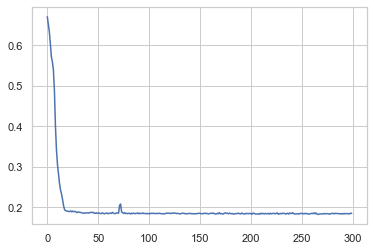

  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

group_viol_FP
####################################################################################
Using device cpu
Epoch: 1/300


100%|█████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 129.64it/s]

Train BCEwL 0.635:
Epoch: 2/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.607:
Epoch: 3/300


 92%|██████████████████████████████████████████████████████████████████████████▊      | 12/13 [00:00<00:00, 119.71it/s]

Train BCEwL 0.577:
Epoch: 4/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.545:
Epoch: 5/300


100%|█████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 127.61it/s]

Train BCEwL 0.504:
Epoch: 6/300



  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.417:
Epoch: 7/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.294:
Epoch: 8/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.275:
Epoch: 9/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.273:
Epoch: 10/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.270:
Epoch: 11/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.269:
Epoch: 12/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.269:
Epoch: 13/300


 92%|██████████████████████████████████████████████████████████████████████████▊      | 12/13 [00:00<00:00, 110.57it/s]

Train BCEwL 0.269:
Epoch: 14/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.266:
Epoch: 15/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.265:
Epoch: 16/300
Train BCEwL 0.265:
Epoch: 17/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.264:
Epoch: 18/300
Train BCEwL 0.263:
Epoch: 19/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.263:
Epoch: 20/300
Train BCEwL 0.260:
Epoch: 21/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.260:
Epoch: 22/300
Train BCEwL 0.255:
Epoch: 23/300
Train BCEwL 0.250:
Epoch: 24/300


100%|█████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 129.59it/s]

Train BCEwL 0.253:
Epoch: 25/300
Train BCEwL 0.250:
Epoch: 26/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.247:
Epoch: 27/300
Train BCEwL 0.244:
Epoch: 28/300


100%|█████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 129.65it/s]

Train BCEwL 0.243:
Epoch: 29/300
Train BCEwL 0.244:
Epoch: 30/300



100%|█████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 129.65it/s]

Train BCEwL 0.240:
Epoch: 31/300
Train BCEwL 0.237:
Epoch: 32/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.237:
Epoch: 33/300
Train BCEwL 0.237:
Epoch: 34/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.237:
Epoch: 35/300
Train BCEwL 0.239:
Epoch: 36/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.235:
Epoch: 37/300
Train BCEwL 0.236:
Epoch: 38/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.237:
Epoch: 39/300
Train BCEwL 0.236:
Epoch: 40/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.239:
Epoch: 41/300
Train BCEwL 0.235:
Epoch: 42/300


 92%|██████████████████████████████████████████████████████████████████████████▊      | 12/13 [00:00<00:00, 119.60it/s]

Train BCEwL 0.238:
Epoch: 43/300
Train BCEwL 0.236:
Epoch: 44/300


 92%|██████████████████████████████████████████████████████████████████████████▊      | 12/13 [00:00<00:00, 119.72it/s]

Train BCEwL 0.236:
Epoch: 45/300
Train BCEwL 0.236:
Epoch: 46/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.236:
Epoch: 47/300
Train BCEwL 0.235:
Epoch: 48/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.235:
Epoch: 49/300
Train BCEwL 0.234:
Epoch: 50/300


 92%|██████████████████████████████████████████████████████████████████████████▊      | 12/13 [00:00<00:00, 119.88it/s]

Train BCEwL 0.233:
Epoch: 51/300
Train BCEwL 0.235:
Epoch: 52/300


100%|█████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 112.53it/s]

Train BCEwL 0.238:
Epoch: 53/300
Train BCEwL 0.236:
Epoch: 54/300


100%|█████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 129.56it/s]

Train BCEwL 0.235:
Epoch: 55/300
Train BCEwL 0.234:
Epoch: 56/300


 92%|██████████████████████████████████████████████████████████████████████████▊      | 12/13 [00:00<00:00, 119.68it/s]

Train BCEwL 0.235:
Epoch: 57/300
Train BCEwL 0.234:
Epoch: 58/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.236:
Epoch: 59/300
Train BCEwL 0.234:
Epoch: 60/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.234:
Epoch: 61/300
Train BCEwL 0.236:
Epoch: 62/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.236:
Epoch: 63/300
Train BCEwL 0.235:
Epoch: 64/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.236:
Epoch: 65/300
Train BCEwL 0.235:
Epoch: 66/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.234:
Epoch: 67/300
Train BCEwL 0.233:
Epoch: 68/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.235:
Epoch: 69/300
Train BCEwL 0.233:
Epoch: 70/300


100%|█████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 129.69it/s]

Train BCEwL 0.234:
Epoch: 71/300
Train BCEwL 0.235:
Epoch: 72/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.236:
Epoch: 73/300
Train BCEwL 0.233:
Epoch: 74/300
Train BCEwL 0.234:
Epoch: 75/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.234:
Epoch: 76/300
Train BCEwL 0.234:
Epoch: 77/300


 92%|██████████████████████████████████████████████████████████████████████████▊      | 12/13 [00:00<00:00, 119.75it/s]

Train BCEwL 0.235:
Epoch: 78/300
Train BCEwL 0.233:
Epoch: 79/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.236:
Epoch: 80/300
Train BCEwL 0.235:
Epoch: 81/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.239:
Epoch: 82/300
Train BCEwL 0.235:
Epoch: 83/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.235:
Epoch: 84/300
Train BCEwL 0.236:
Epoch: 85/300


 92%|██████████████████████████████████████████████████████████████████████████▊      | 12/13 [00:00<00:00, 119.67it/s]

Train BCEwL 0.234:
Epoch: 86/300
Train BCEwL 0.236:
Epoch: 87/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.236:
Epoch: 88/300
Train BCEwL 0.232:
Epoch: 89/300


 85%|████████████████████████████████████████████████████████████████████▌            | 11/13 [00:00<00:00, 109.46it/s]

Train BCEwL 0.234:
Epoch: 90/300
Train BCEwL 0.235:
Epoch: 91/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.232:
Epoch: 92/300
Train BCEwL 0.235:
Epoch: 93/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.236:
Epoch: 94/300
Train BCEwL 0.234:
Epoch: 95/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.233:
Epoch: 96/300
Train BCEwL 0.235:
Epoch: 97/300


 92%|██████████████████████████████████████████████████████████████████████████▊      | 12/13 [00:00<00:00, 119.64it/s]

Train BCEwL 0.234:
Epoch: 98/300
Train BCEwL 0.234:
Epoch: 99/300


100%|█████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 129.61it/s]

Train BCEwL 0.234:
Epoch: 100/300
Train BCEwL 0.235:
Epoch: 101/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.232:
Epoch: 102/300
Train BCEwL 0.236:
Epoch: 103/300
Train BCEwL 0.234:
Epoch: 104/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.234:
Epoch: 105/300
Train BCEwL 0.234:
Epoch: 106/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.234:
Epoch: 107/300
Train BCEwL 0.233:
Epoch: 108/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.235:
Epoch: 109/300
Train BCEwL 0.233:
Epoch: 110/300


100%|█████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 138.69it/s]

Train BCEwL 0.235:
Epoch: 111/300
Train BCEwL 0.234:
Epoch: 112/300



100%|█████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 153.62it/s]

Train BCEwL 0.234:
Epoch: 113/300
Train BCEwL 0.233:
Epoch: 114/300
Train BCEwL 0.235:
Epoch: 115/300



  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.234:
Epoch: 116/300
Train BCEwL 0.234:
Epoch: 117/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.233:
Epoch: 118/300
Train BCEwL 0.235:
Epoch: 119/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.233:
Epoch: 120/300
Train BCEwL 0.234:
Epoch: 121/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.233:
Epoch: 122/300
Train BCEwL 0.234:
Epoch: 123/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.234:
Epoch: 124/300
Train BCEwL 0.233:
Epoch: 125/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.236:
Epoch: 126/300
Train BCEwL 0.233:
Epoch: 127/300
Train BCEwL 0.233:
Epoch: 128/300


100%|█████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 128.91it/s]

Train BCEwL 0.233:
Epoch: 129/300
Train BCEwL 0.233:
Epoch: 130/300


100%|█████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 126.78it/s]

Train BCEwL 0.233:
Epoch: 131/300
Train BCEwL 0.234:
Epoch: 132/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.235:
Epoch: 133/300
Train BCEwL 0.232:
Epoch: 134/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.231:
Epoch: 135/300
Train BCEwL 0.234:
Epoch: 136/300


100%|█████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 128.69it/s]

Train BCEwL 0.233:
Epoch: 137/300
Train BCEwL 0.233:
Epoch: 138/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.233:
Epoch: 139/300
Train BCEwL 0.234:
Epoch: 140/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.235:
Epoch: 141/300
Train BCEwL 0.233:
Epoch: 142/300
Train BCEwL 0.233:
Epoch: 143/300


 92%|██████████████████████████████████████████████████████████████████████████▊      | 12/13 [00:00<00:00, 119.71it/s]

Train BCEwL 0.235:
Epoch: 144/300
Train BCEwL 0.235:
Epoch: 145/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.234:
Epoch: 146/300
Train BCEwL 0.233:
Epoch: 147/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.235:
Epoch: 148/300
Train BCEwL 0.235:
Epoch: 149/300


 85%|████████████████████████████████████████████████████████████████████▌            | 11/13 [00:00<00:00, 109.70it/s]

Train BCEwL 0.232:
Epoch: 150/300
Train BCEwL 0.235:
Epoch: 151/300


 85%|████████████████████████████████████████████████████████████████████▌            | 11/13 [00:00<00:00, 109.74it/s]

Train BCEwL 0.232:
Epoch: 152/300
Train BCEwL 0.235:
Epoch: 153/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.232:
Epoch: 154/300
Train BCEwL 0.234:
Epoch: 155/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.234:
Epoch: 156/300
Train BCEwL 0.234:
Epoch: 157/300


 77%|███████████████████████████████████████████████████████████████                   | 10/13 [00:00<00:00, 99.29it/s]

Train BCEwL 0.232:
Epoch: 158/300
Train BCEwL 0.233:
Epoch: 159/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.233:
Epoch: 160/300
Train BCEwL 0.233:
Epoch: 161/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.233:
Epoch: 162/300
Train BCEwL 0.234:
Epoch: 163/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.233:
Epoch: 164/300
Train BCEwL 0.234:
Epoch: 165/300
Train BCEwL 0.232:
Epoch: 166/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.234:
Epoch: 167/300
Train BCEwL 0.236:
Epoch: 168/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.232:
Epoch: 169/300
Train BCEwL 0.234:
Epoch: 170/300


100%|█████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 129.00it/s]

Train BCEwL 0.235:
Epoch: 171/300
Train BCEwL 0.234:
Epoch: 172/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.233:
Epoch: 173/300
Train BCEwL 0.232:
Epoch: 174/300
Train BCEwL 0.233:
Epoch: 175/300


100%|█████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 129.03it/s]

Train BCEwL 0.234:
Epoch: 176/300
Train BCEwL 0.234:
Epoch: 177/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.233:
Epoch: 178/300
Train BCEwL 0.232:
Epoch: 179/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.233:
Epoch: 180/300
Train BCEwL 0.232:
Epoch: 181/300


 92%|██████████████████████████████████████████████████████████████████████████▊      | 12/13 [00:00<00:00, 118.82it/s]

Train BCEwL 0.232:
Epoch: 182/300
Train BCEwL 0.232:
Epoch: 183/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.232:
Epoch: 184/300
Train BCEwL 0.234:
Epoch: 185/300
Train BCEwL 0.233:
Epoch: 186/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.234:
Epoch: 187/300
Train BCEwL 0.233:
Epoch: 188/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.232:
Epoch: 189/300
Train BCEwL 0.232:
Epoch: 190/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.232:
Epoch: 191/300
Train BCEwL 0.233:
Epoch: 192/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.233:
Epoch: 193/300
Train BCEwL 0.235:
Epoch: 194/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.232:
Epoch: 195/300
Train BCEwL 0.234:
Epoch: 196/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.234:
Epoch: 197/300
Train BCEwL 0.234:
Epoch: 198/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.232:
Epoch: 199/300
Train BCEwL 0.232:
Epoch: 200/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.233:
Epoch: 201/300
Train BCEwL 0.233:
Epoch: 202/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.234:
Epoch: 203/300
Train BCEwL 0.233:
Epoch: 204/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.236:
Epoch: 205/300
Train BCEwL 0.232:
Epoch: 206/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.232:
Epoch: 207/300
Train BCEwL 0.231:
Epoch: 208/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.232:
Epoch: 209/300
Train BCEwL 0.233:
Epoch: 210/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.234:
Epoch: 211/300
Train BCEwL 0.234:
Epoch: 212/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.234:
Epoch: 213/300
Train BCEwL 0.233:
Epoch: 214/300
Train BCEwL 0.233:
Epoch: 215/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.231:
Epoch: 216/300
Train BCEwL 0.234:
Epoch: 217/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.233:
Epoch: 218/300
Train BCEwL 0.234:
Epoch: 219/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.233:
Epoch: 220/300
Train BCEwL 0.233:
Epoch: 221/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.232:
Epoch: 222/300
Train BCEwL 0.234:
Epoch: 223/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.232:
Epoch: 224/300
Train BCEwL 0.232:
Epoch: 225/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.233:
Epoch: 226/300
Train BCEwL 0.233:
Epoch: 227/300


 92%|██████████████████████████████████████████████████████████████████████████▊      | 12/13 [00:00<00:00, 117.00it/s]

Train BCEwL 0.233:
Epoch: 228/300
Train BCEwL 0.231:
Epoch: 229/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.234:
Epoch: 230/300
Train BCEwL 0.233:
Epoch: 231/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.233:
Epoch: 232/300
Train BCEwL 0.232:
Epoch: 233/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.234:
Epoch: 234/300
Train BCEwL 0.236:
Epoch: 235/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.233:
Epoch: 236/300
Train BCEwL 0.232:
Epoch: 237/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.233:
Epoch: 238/300
Train BCEwL 0.233:
Epoch: 239/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.234:
Epoch: 240/300
Train BCEwL 0.232:
Epoch: 241/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.232:
Epoch: 242/300
Train BCEwL 0.232:
Epoch: 243/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.231:
Epoch: 244/300
Train BCEwL 0.233:
Epoch: 245/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.232:
Epoch: 246/300
Train BCEwL 0.234:
Epoch: 247/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.232:
Epoch: 248/300
Train BCEwL 0.234:
Epoch: 249/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.232:
Epoch: 250/300
Train BCEwL 0.234:
Epoch: 251/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.234:
Epoch: 252/300
Train BCEwL 0.234:
Epoch: 253/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.234:
Epoch: 254/300
Train BCEwL 0.235:
Epoch: 255/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.233:
Epoch: 256/300
Train BCEwL 0.232:
Epoch: 257/300
Train BCEwL 0.232:
Epoch: 258/300


 85%|████████████████████████████████████████████████████████████████████▌            | 11/13 [00:00<00:00, 109.66it/s]

Train BCEwL 0.232:
Epoch: 259/300
Train BCEwL 0.232:
Epoch: 260/300


 92%|██████████████████████████████████████████████████████████████████████████▊      | 12/13 [00:00<00:00, 119.76it/s]

Train BCEwL 0.231:
Epoch: 261/300
Train BCEwL 0.234:
Epoch: 262/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.233:
Epoch: 263/300
Train BCEwL 0.232:
Epoch: 264/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.233:
Epoch: 265/300
Train BCEwL 0.233:
Epoch: 266/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.233:
Epoch: 267/300
Train BCEwL 0.232:
Epoch: 268/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.233:
Epoch: 269/300
Train BCEwL 0.234:
Epoch: 270/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.232:
Epoch: 271/300
Train BCEwL 0.232:
Epoch: 272/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.234:
Epoch: 273/300
Train BCEwL 0.234:
Epoch: 274/300
Train BCEwL 0.232:
Epoch: 275/300


 92%|██████████████████████████████████████████████████████████████████████████▊      | 12/13 [00:00<00:00, 119.16it/s]

Train BCEwL 0.234:
Epoch: 276/300
Train BCEwL 0.234:
Epoch: 277/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.234:
Epoch: 278/300
Train BCEwL 0.233:
Epoch: 279/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.234:
Epoch: 280/300
Train BCEwL 0.232:
Epoch: 281/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.233:
Epoch: 282/300
Train BCEwL 0.232:
Epoch: 283/300


100%|██████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 81.56it/s]

Train BCEwL 0.235:
Epoch: 284/300



  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.232:
Epoch: 285/300
Train BCEwL 0.233:
Epoch: 286/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.234:
Epoch: 287/300
Train BCEwL 0.234:
Epoch: 288/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.234:
Epoch: 289/300
Train BCEwL 0.231:
Epoch: 290/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.235:
Epoch: 291/300
Train BCEwL 0.236:
Epoch: 292/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.235:
Epoch: 293/300
Train BCEwL 0.233:
Epoch: 294/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.235:
Epoch: 295/300
Train BCEwL 0.234:
Epoch: 296/300


 85%|████████████████████████████████████████████████████████████████████▌            | 11/13 [00:00<00:00, 109.07it/s]

Train BCEwL 0.234:
Epoch: 297/300
Train BCEwL 0.233:
Epoch: 298/300


  0%|                                                                                           | 0/13 [00:00<?, ?it/s]

Train BCEwL 0.235:
Epoch: 299/300
Train BCEwL 0.232:
Epoch: 300/300


100%|█████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 129.23it/s]


Train BCEwL 0.232:
AUC: 0.7953455687830688
Validation RMSE 11.502:
Validation BCEwL 0.207:


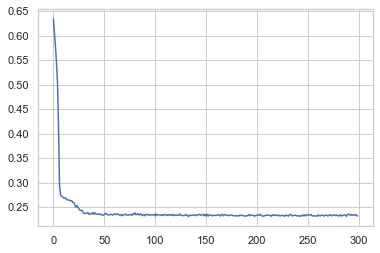

group_viol_FN
####################################################################################


In [25]:
keys = ['group_viol']#, 'group_recid']
subkeys = ['FP', 'FN']#, 'T']
y_val_predicted = {}
scores = ['Risk of Recidivism_decile_score/10', 'Risk of Recidivism_raw_score',
       'Risk of Violence_decile_score/10', 'Risk of Violence_raw_score']
models = {}
for key in keys:
    for subkey in subkeys:
        target = key + '_' + subkey
        original_target_name = target
        
        # Fit model
        device = "cpu"  # "cuda" if torch.cuda.is_available() else "cpu"
        model_pos, X_train_pos, X_val_pos, y_val_predicted_pos, losses_pos = fit_NN(X_train.loc[:, scores], 
                                                                                        X_val.loc[:,scores],
                                                                                        y_train,
                                                                                        y_val,
                                                                                        target, 
                                                                                        scales=False, regex_keys=None,
                                                                                        n_layers=10, n_hidden=20, n_epochs=300, weighting=True,
                                                                                        batch_size=256,
                                                                                        device=device, return_loss=True)
        models[target] = model_pos
        plt.plot(losses_pos)
        plt.show()
            

            
        y_val_predicted[target] = y_val_predicted_pos
        
        print(target)
        print("####################################################################################")

group_viol_FP
Example: Subject 0
group_viol_FP = 0.0 	 prediction = tensor(1.4290e-33)


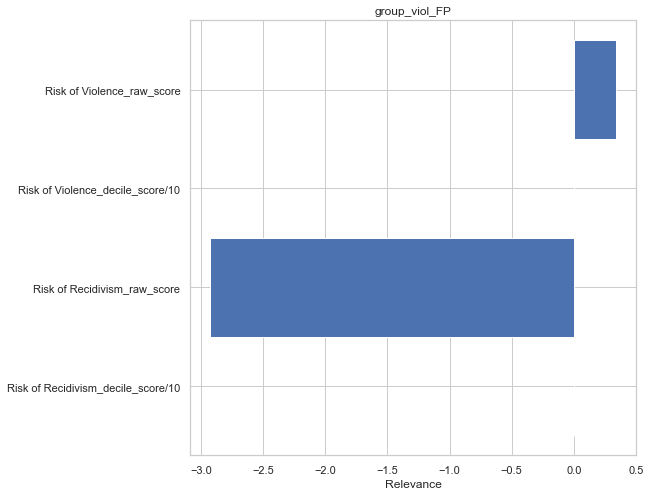

Example: Subject 1
group_viol_FP = 0.0 	 prediction = tensor(9.1568e-28)


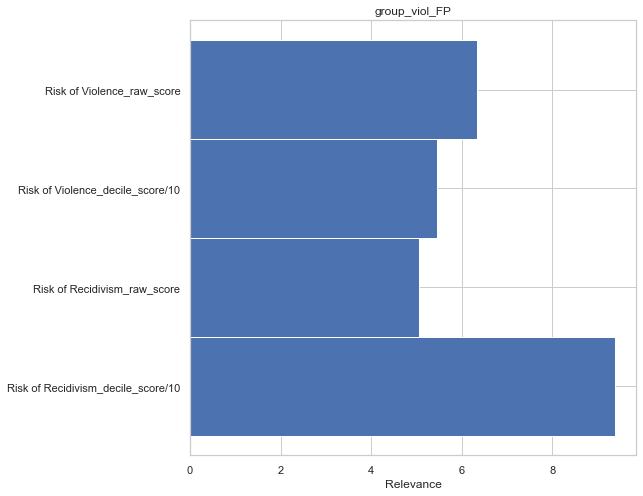

Example: Subject 2
group_viol_FP = 0.0 	 prediction = tensor(5.4134e-19)


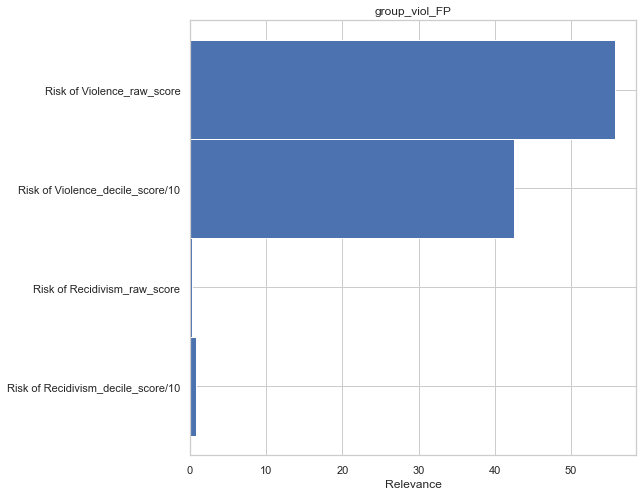

Example: Subject 3
group_viol_FP = 0.0 	 prediction = tensor(2.5904e-08)


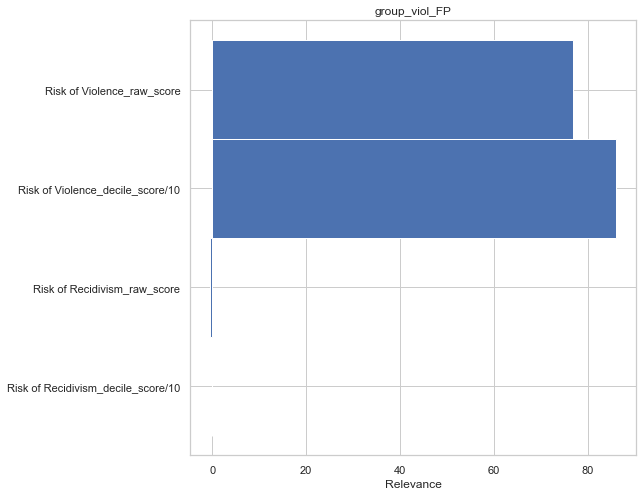

Example: Subject 4
group_viol_FP = 0.0 	 prediction = tensor(0.7393)


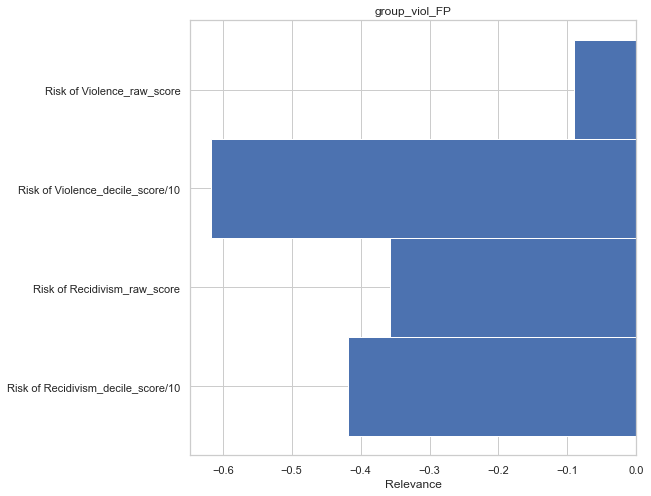

group_viol_FN
Example: Subject 0
group_viol_FN = 0.0 	 prediction = tensor(0.0920)


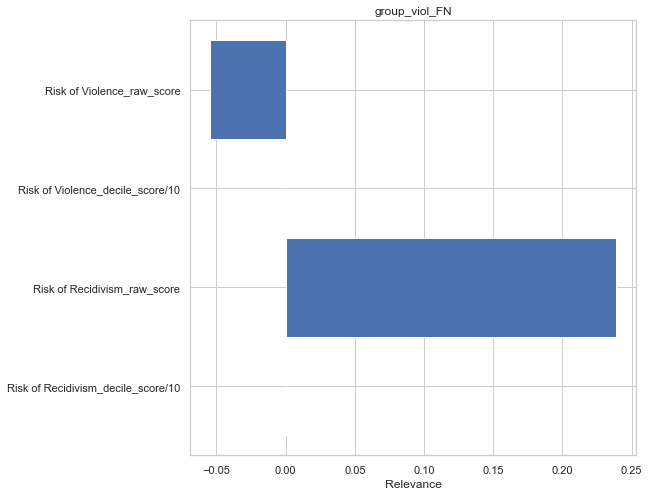

Example: Subject 1
group_viol_FN = 0.0 	 prediction = tensor(0.1776)


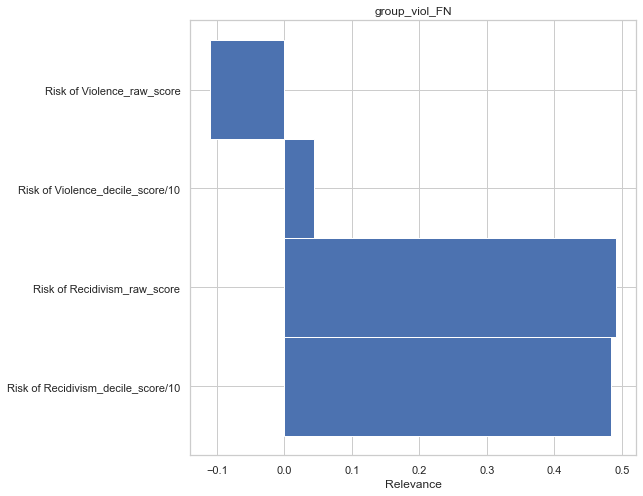

Example: Subject 2
group_viol_FN = 0.0 	 prediction = tensor(0.1525)


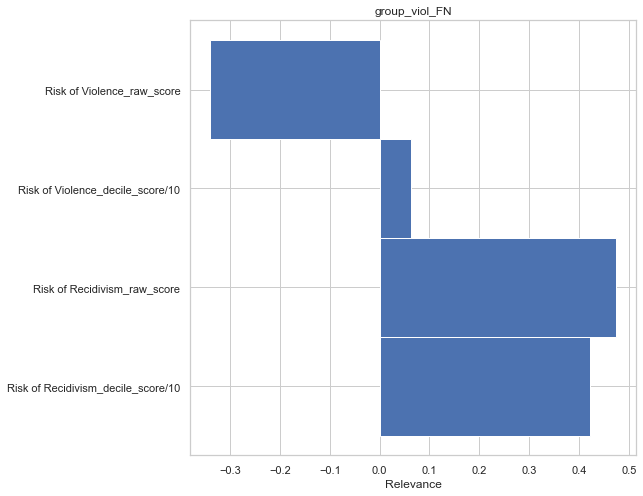

Example: Subject 3
group_viol_FN = 0.0 	 prediction = tensor(0.1463)


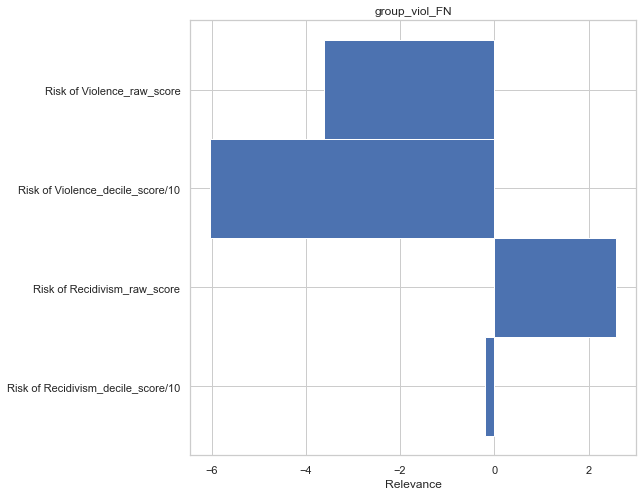

Example: Subject 4
group_viol_FN = 0.0 	 prediction = tensor(6.8762e-16)


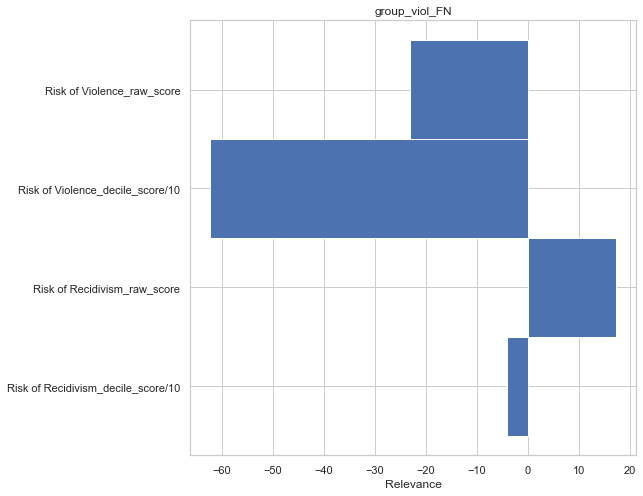

In [27]:
for c in y_train.columns:
    if "text" in c or "proPub" in c or 'Unnamed: 0' in c:
        y_train.drop(labels=c, axis = 1, inplace=True)
        y_val.drop(labels=c, axis = 1, inplace=True)
        

y_tmp = pd.concat([y_train, y_val])
X_tmp = pd.concat([X_train, X_val]).loc[:, scores]

Rs_dic = {}       
for key in keys:
    Rs_dic[key] = {}
    for subkey in subkeys:
        Rs_dic[key][subkey] = {'Rs':[], 'ys': [], 'y_hats':[], 'target': key + '_' + subkey}
        target = key + '_' + subkey
        print(target)
        model = models[target]
        expl_model = explain.make_explainable(copy.deepcopy(model)).to(device)

        
        loader = torch.utils.data.DataLoader(PandasDataset(X_tmp, y_tmp), batch_size=1, shuffle=False)

        target_idx = list(y_tmp.columns).index(target)


        n_examples = 5
        for x_i, (x, y) in enumerate(loader):
            y_hat = model(x).to(device)
            Rs_dic[key][subkey]['y_hats'].append(y_hat)
            R = explain.grad(expl_model, x)[0,0].cpu().detach()
            Rs_dic[key][subkey]['Rs'].append(R)
            Rs_dic[key][subkey]['ys'].append(float(y[0,0, target_idx]))

            if x_i < n_examples:
                #Display an example explanation
                print("Example: Subject", x_i)
                print(target, "=", float(y[0,0,target_idx]), "\t prediction =",
                     torch.sigmoid(torch.tensor(float(y_hat))))
                ml_utils.visualize_relevance(X_tmp.columns, R, target)

In [28]:
##make list with predicted values and a frame with orignal values for plotting
X_plot = df_X.join(df_y, on='uid').loc[list(X_tmp.index),list(X_tmp.columns)]
y_predicted = [round(float(torch.sigmoid(torch.tensor(float(y))))) for y in Rs_dic['group_viol']['FP']['y_hats']]

In [29]:
FP_rec_only = False
if FP_rec_only:
    mask_FP = numpy.array([bool(torch.sigmoid(torch.tensor(float(x))) >=.5) for x in Rs_dic['group_viol']['FP']['y_hats']])
else:
    mask_FP = numpy.array([True for _ in Rs_dic['group_viol']['FP']['y_hats']])

In [30]:
##Exclude the indices for the COMPAS score
exclude = False
idx = []
idx = range(len(list(X_tmp.columns)))

In [31]:
relevance_array  = numpy.array([numpy.array(x) for x in Rs_dic['group_viol']['FP']['Rs']])[:,idx]

In [32]:
relevance_array[mask_FP].shape

(4319, 4)

 ## Clustering of Relevance Matrix

In [33]:
X = StandardScaler().fit_transform(relevance_array[mask_FP])
sil = {}

In [35]:
n_clusters = 2  # number of regions
tmp_max = -100
sil.update({'hierarchical_ward':{'n_clusters':[], 'sil':[], 'labels':[]}})
for n_clusters in range(2, 22, 2):
    ward = AgglomerativeClustering(n_clusters=n_clusters, linkage='ward')
    ward.fit(X)
    sil['hierarchical_ward']['n_clusters'].append(n_clusters)
    sil['hierarchical_ward']['sil'].append(metrics.silhouette_score(X, ward.labels_))
    sil['hierarchical_ward']['labels'].append(ward.labels_)
    if sil['hierarchical_ward']['sil'][-1] > tmp_max:
        n_clusters_star = n_clusters
        tmp_max =sil['hierarchical_ward']['sil'][-1]

For n_clusters = 2 The average silhouette_score is : 0.5697391
For n_clusters = 4 The average silhouette_score is : 0.60360754
For n_clusters = 6 The average silhouette_score is : 0.6348555
For n_clusters = 8 The average silhouette_score is : 0.65087926
For n_clusters = 10 The average silhouette_score is : 0.6748506
For n_clusters = 12 The average silhouette_score is : 0.661833
For n_clusters = 14 The average silhouette_score is : 0.66143507
For n_clusters = 16 The average silhouette_score is : 0.67899865
For n_clusters = 18 The average silhouette_score is : 0.6907952
For n_clusters = 20 The average silhouette_score is : 0.69484264


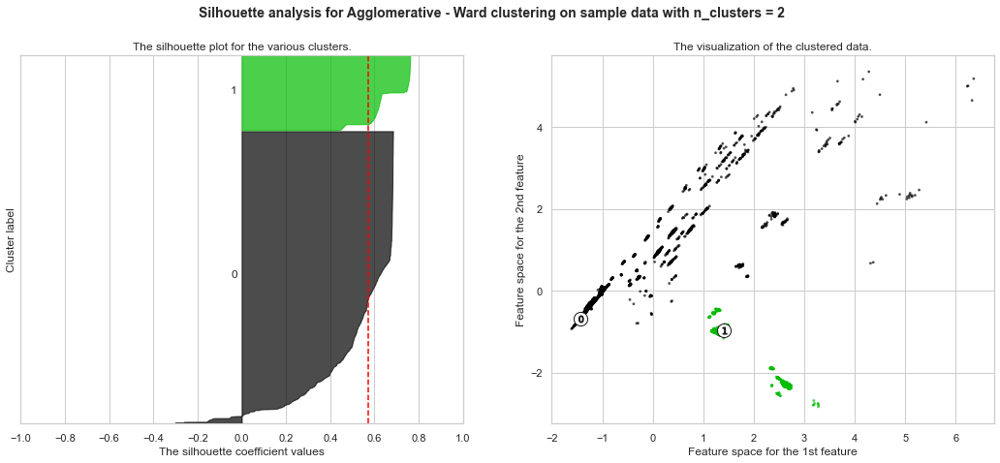

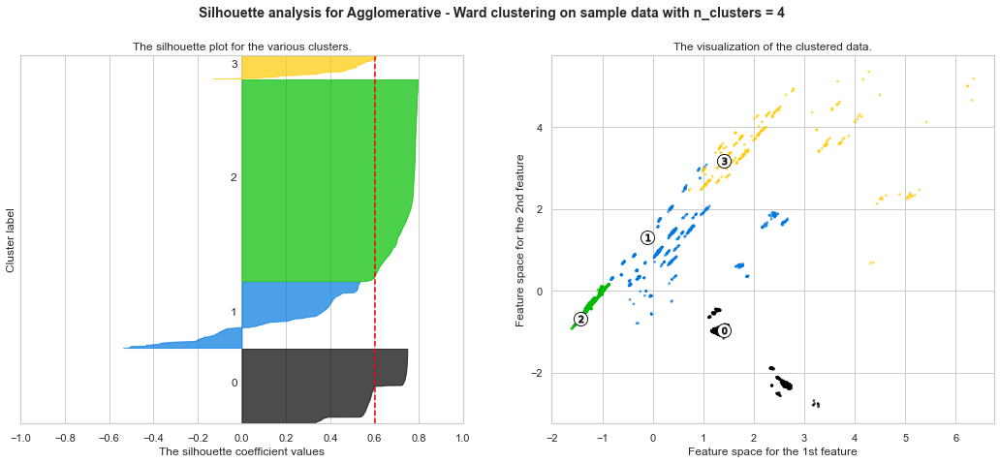

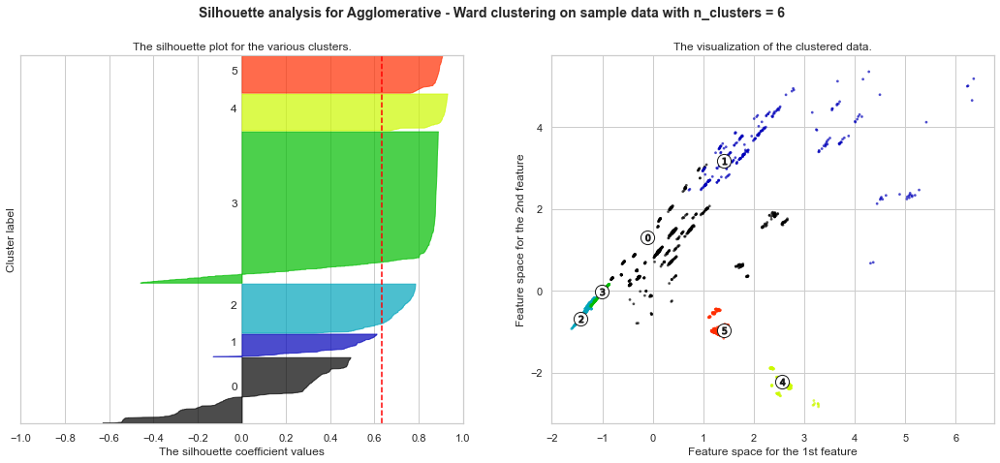

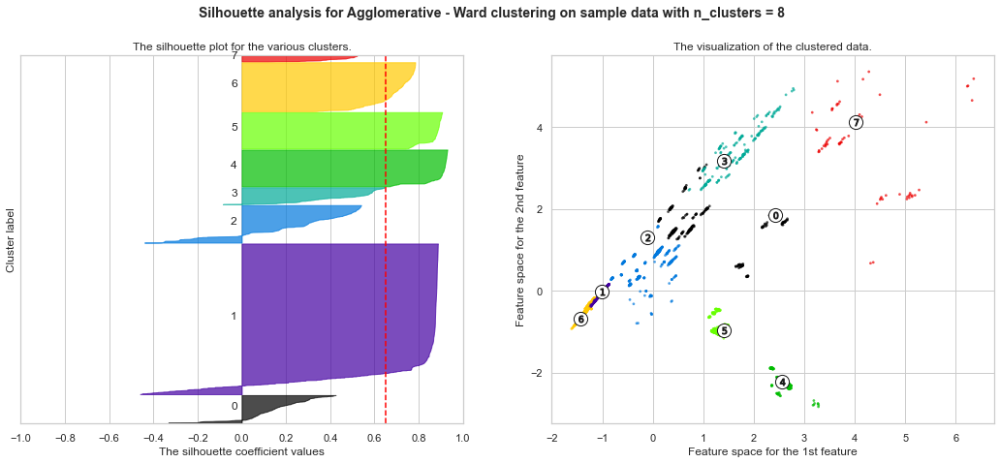

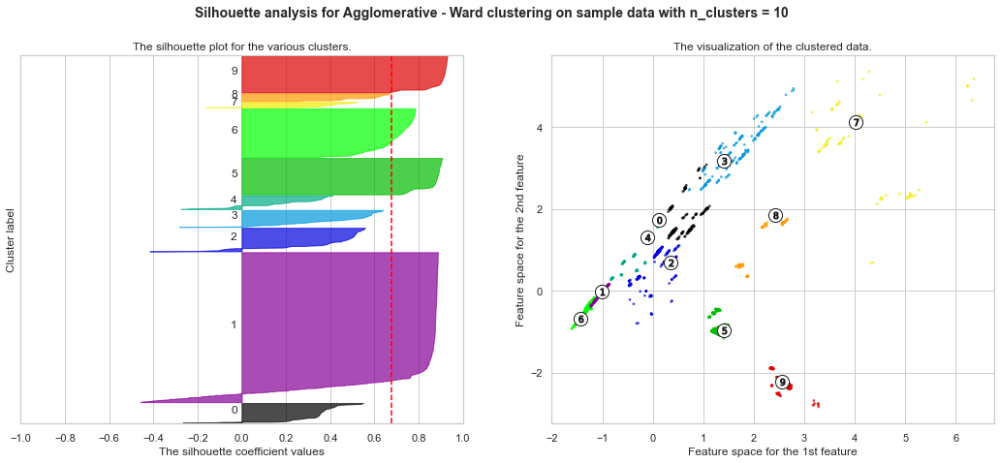

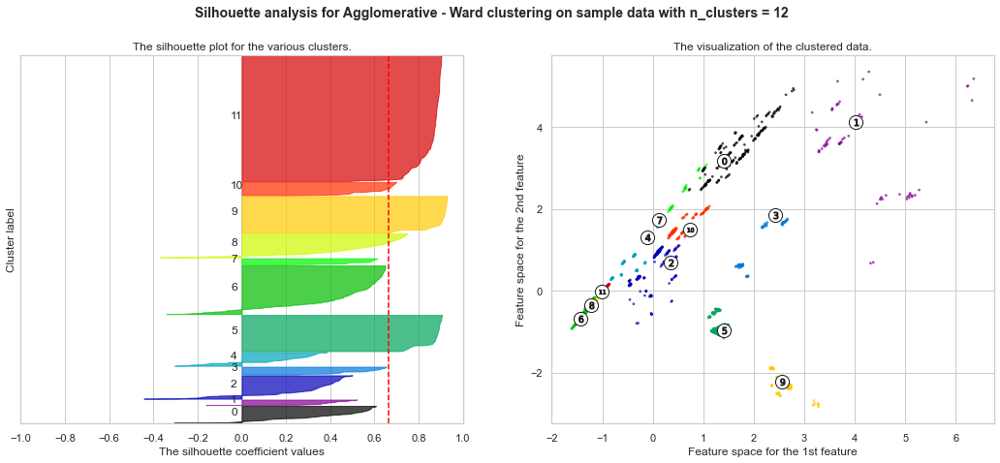

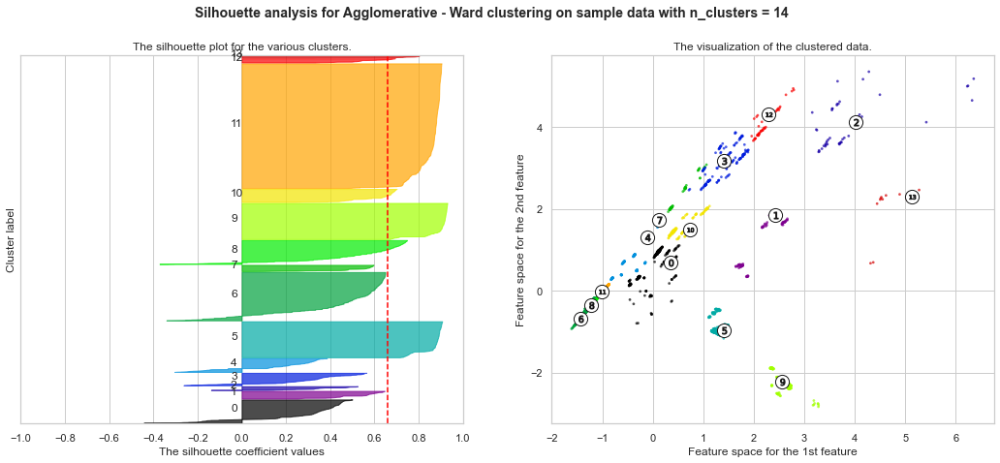

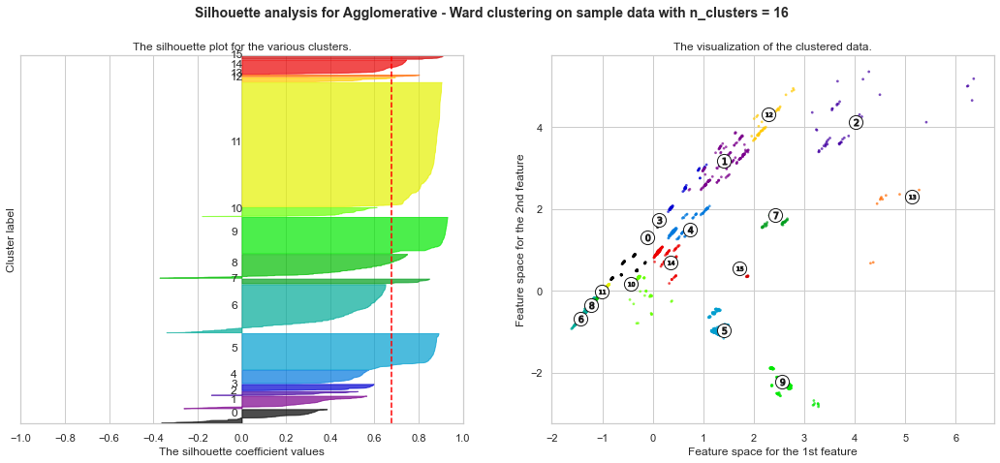

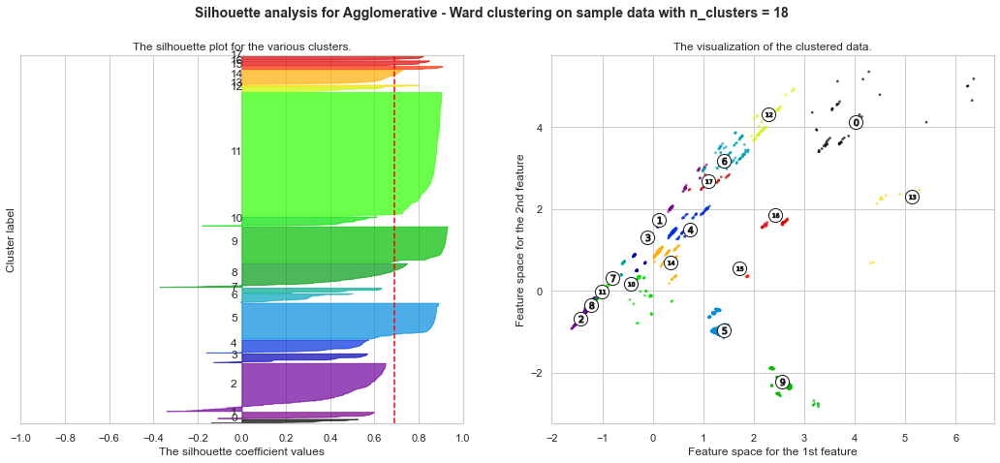

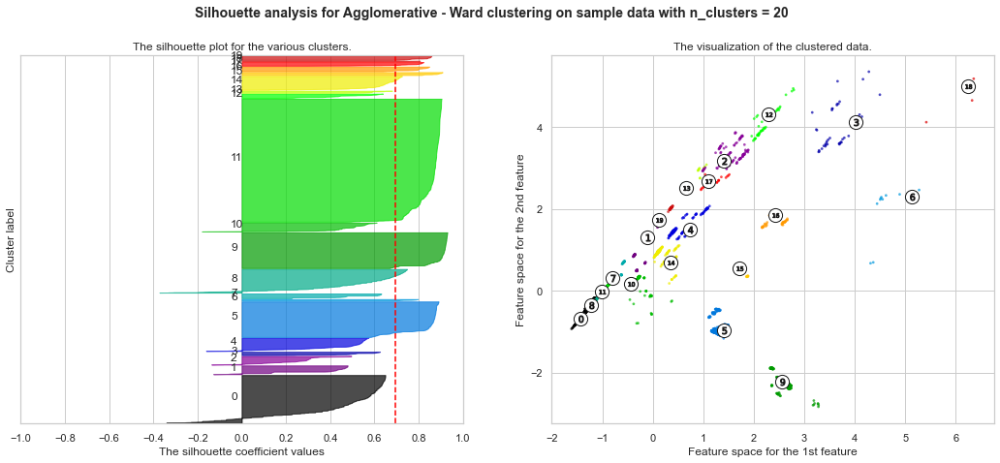

In [36]:
for clust_labels in sil['hierarchical_ward']['labels']:
    fig = silouette_plot(X, clust_labels, name= 'Agglomerative - Ward')

Text(0, 0.5, 'sil')

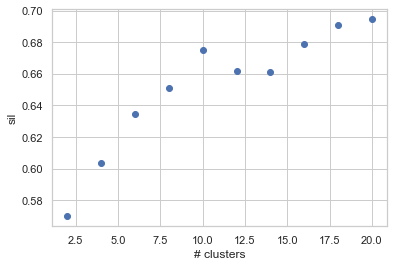

In [37]:
fig = plt.figure()
ax = plt.axes()
ax.scatter(sil['hierarchical_ward']['n_clusters'], sil['hierarchical_ward']['sil'])
ax.set_xlabel('# clusters')
ax.set_ylabel('sil')

In [60]:
ward = AgglomerativeClustering(n_clusters=4, linkage='ward')
ward.fit(X)   
print('Estimated number of clusters: %d' % n_clusters_star)
print("Silhouette Coefficient: %0.3f"
      % metrics.silhouette_score(X, ward.labels_))
print(Counter(ward.labels_))
y_tmp.loc[list(mask_FP),'hierarchical_ward_labels'] = list(ward.labels_)

Estimated number of clusters: 20
Silhouette Coefficient: 0.604
Counter({2: 2390, 0: 878, 1: 781, 3: 270})


<class 'numpy.ndarray'>
--Correct: 878
--Wrong:   0
['Risk of Recidivism_decile_score/10', 'Risk of Recidivism_raw_score', 'Risk of Violence_decile_score/10', 'Risk of Violence_raw_score']
########################################################################################
<class 'numpy.ndarray'>
--Correct: 781
--Wrong:   0
['Risk of Recidivism_decile_score/10', 'Risk of Recidivism_raw_score', 'Risk of Violence_decile_score/10', 'Risk of Violence_raw_score']
########################################################################################
<class 'numpy.ndarray'>
--Correct: 2023
--Wrong:   367
['Risk of Recidivism_decile_score/10', 'Risk of Recidivism_raw_score', 'Risk of Violence_decile_score/10', 'Risk of Violence_raw_score']
########################################################################################
<class 'numpy.ndarray'>
--Correct: 270
--Wrong:   0
['Risk of Recidivism_decile_score/10', 'Risk of Recidivism_raw_score', 'Risk of Violence_decile_score/10', 'Ris

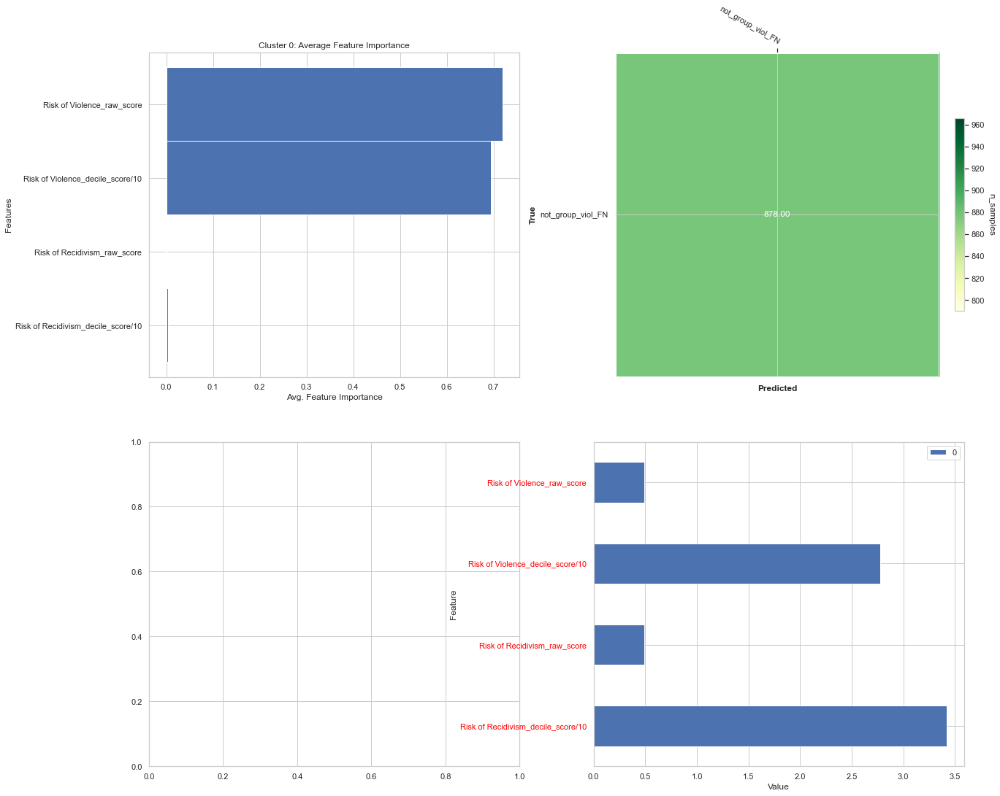

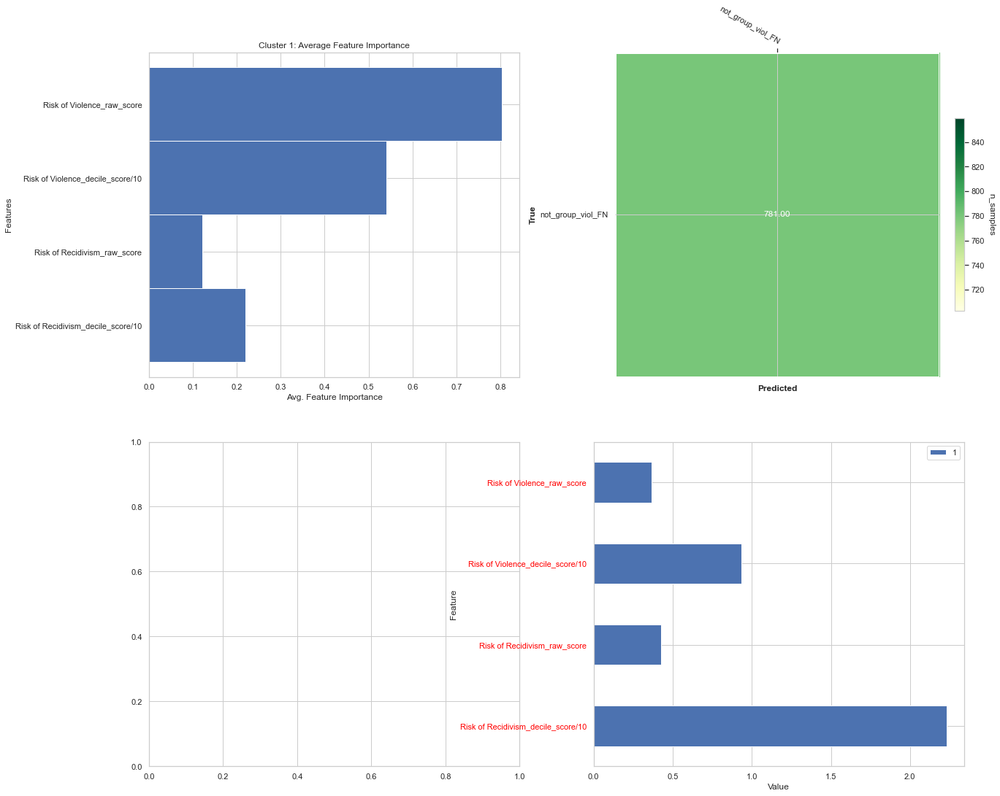

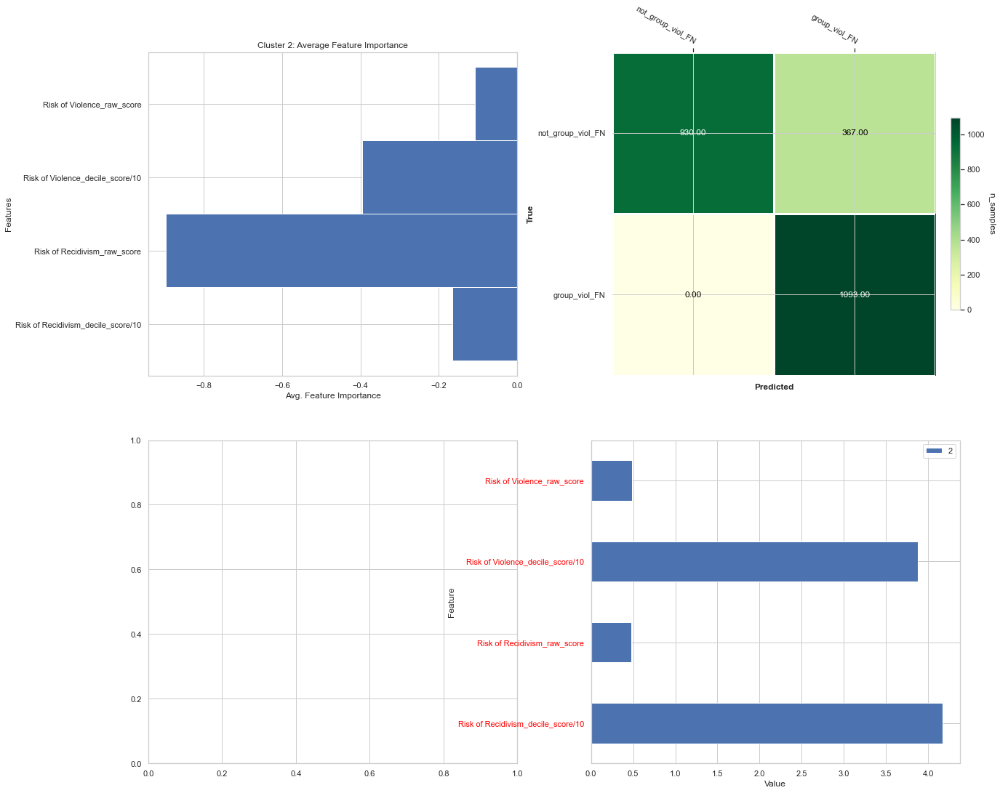

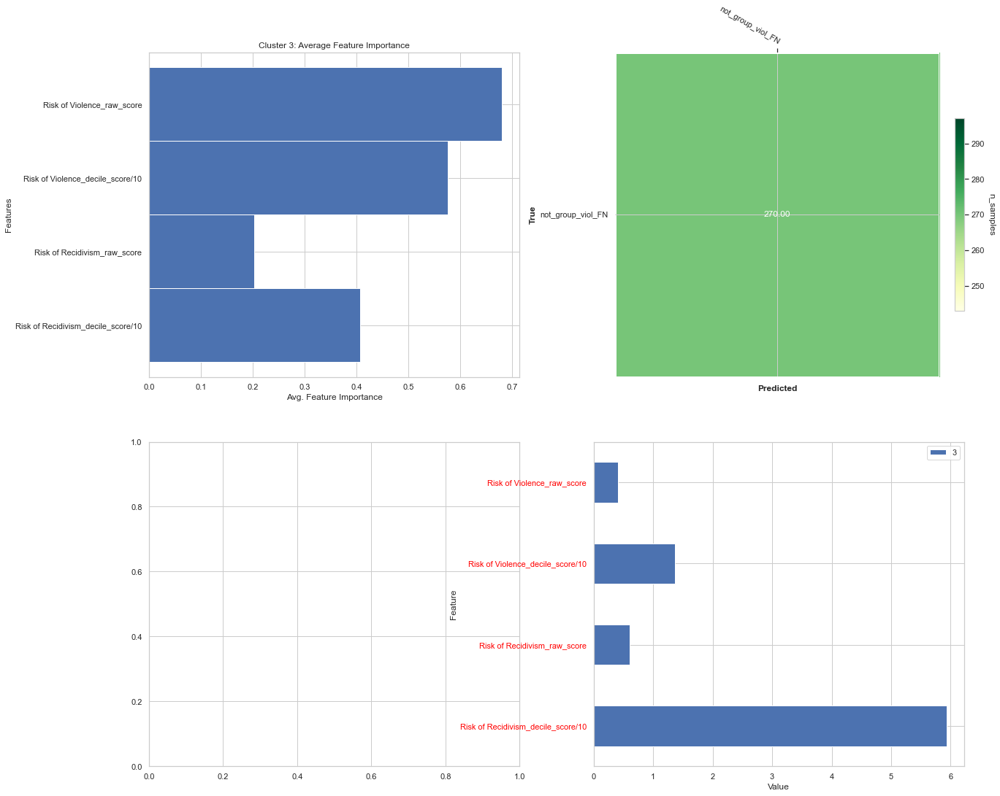

In [61]:
labels = ward.labels_
fig = plot_clustered_relevance(X_tmp, labels, relevance_array, y_predicted, target, Rs_dic, exclude, idx, mask_FP)


In [62]:
n_clusters_star = 2  # number of regions
neighbour_star = 2
tmp_max = -100
sil.update({'hierarchical_ward_neigh':{'neighbours':[],'n_clusters':[], 'sil':[], 'labels':[]}})
for neighbour in range(2, 20, 2):
    connectivity = kneighbors_graph(X, n_neighbors=neighbour, include_self=False)
    for n_clusters in range(2, 16, 2):
        ward = AgglomerativeClustering(n_clusters=n_clusters, connectivity=connectivity,
                                       linkage='ward')
        ward.fit(X)
        sil['hierarchical_ward_neigh']['neighbours'].append(neighbour)
        sil['hierarchical_ward_neigh']['n_clusters'].append(n_clusters)
        sil['hierarchical_ward_neigh']['sil'].append(metrics.silhouette_score(X, ward.labels_))
        sil['hierarchical_ward_neigh']['labels'].append(ward.labels_)
        if sil['hierarchical_ward_neigh']['sil'][-1] > tmp_max:
                n_clusters_star = n_clusters
                neighbour_star = neighbour
                tmp_max = sil['hierarchical_ward_neigh']['sil'][-1]



C:\Users\schubert\anaconda3\lib\site-packages\sklearn\cluster\_agglomerative.py:245: UserWarning: the number of connected components of the connectivity matrix is 566 > 1. Completing it to avoid stopping the tree early.
  connectivity, n_connected_components = _fix_connectivity(
C:\Users\schubert\anaconda3\lib\site-packages\sklearn\cluster\_agglomerative.py:245: UserWarning: the number of connected components of the connectivity matrix is 566 > 1. Completing it to avoid stopping the tree early.
  connectivity, n_connected_components = _fix_connectivity(
C:\Users\schubert\anaconda3\lib\site-packages\sklearn\cluster\_agglomerative.py:245: UserWarning: the number of connected components of the connectivity matrix is 566 > 1. Completing it to avoid stopping the tree early.
  connectivity, n_connected_components = _fix_connectivity(
C:\Users\schubert\anaconda3\lib\site-packages\sklearn\cluster\_agglomerative.py:245: UserWarning: the number of connected components of the connectivity matrix 

C:\Users\schubert\anaconda3\lib\site-packages\sklearn\cluster\_agglomerative.py:245: UserWarning: the number of connected components of the connectivity matrix is 42 > 1. Completing it to avoid stopping the tree early.
  connectivity, n_connected_components = _fix_connectivity(
C:\Users\schubert\anaconda3\lib\site-packages\sklearn\cluster\_agglomerative.py:245: UserWarning: the number of connected components of the connectivity matrix is 42 > 1. Completing it to avoid stopping the tree early.
  connectivity, n_connected_components = _fix_connectivity(
C:\Users\schubert\anaconda3\lib\site-packages\sklearn\cluster\_agglomerative.py:245: UserWarning: the number of connected components of the connectivity matrix is 42 > 1. Completing it to avoid stopping the tree early.
  connectivity, n_connected_components = _fix_connectivity(
C:\Users\schubert\anaconda3\lib\site-packages\sklearn\cluster\_agglomerative.py:245: UserWarning: the number of connected components of the connectivity matrix is 

C:\Users\schubert\anaconda3\lib\site-packages\sklearn\cluster\_agglomerative.py:245: UserWarning: the number of connected components of the connectivity matrix is 19 > 1. Completing it to avoid stopping the tree early.
  connectivity, n_connected_components = _fix_connectivity(
C:\Users\schubert\anaconda3\lib\site-packages\sklearn\cluster\_agglomerative.py:245: UserWarning: the number of connected components of the connectivity matrix is 19 > 1. Completing it to avoid stopping the tree early.
  connectivity, n_connected_components = _fix_connectivity(
C:\Users\schubert\anaconda3\lib\site-packages\sklearn\cluster\_agglomerative.py:245: UserWarning: the number of connected components of the connectivity matrix is 19 > 1. Completing it to avoid stopping the tree early.
  connectivity, n_connected_components = _fix_connectivity(


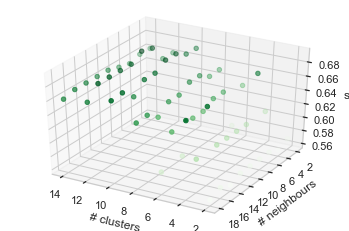

In [63]:
from mpl_toolkits import mplot3d

fig = plt.figure()
ax = plt.axes(projection='3d')
ax.scatter3D(sil['hierarchical_ward_neigh']['n_clusters'],
             sil['hierarchical_ward_neigh']['neighbours'],
             sil['hierarchical_ward_neigh']['sil'],
             c=sil['hierarchical_ward_neigh']['sil'], cmap='Greens')
ax.set_xlabel('# clusters')
ax.set_ylabel('# neighbours')
ax.set_zlabel('sil')
ax.view_init(35, 120)
plt.show()

For n_clusters = 2 The average silhouette_score is : 0.5697391
For n_clusters = 4 The average silhouette_score is : 0.60360754
For n_clusters = 6 The average silhouette_score is : 0.6348555
For n_clusters = 8 The average silhouette_score is : 0.65087926
For n_clusters = 10 The average silhouette_score is : 0.6748506
For n_clusters = 12 The average silhouette_score is : 0.661833
For n_clusters = 14 The average silhouette_score is : 0.66143507
For n_clusters = 2 The average silhouette_score is : 0.5626403
For n_clusters = 4 The average silhouette_score is : 0.6683088
For n_clusters = 6 The average silhouette_score is : 0.5846306
For n_clusters = 8 The average silhouette_score is : 0.65015686
For n_clusters = 10 The average silhouette_score is : 0.67533135
For n_clusters = 12 The average silhouette_score is : 0.6620731
For n_clusters = 14 The average silhouette_score is : 0.66167516
For n_clusters = 2 The average silhouette_score is : 0.5697391
For n_clusters = 4 The average silhouette_sc

C:\Users\schubert\Documents\COMPAS\compas-analysis\code\plot_helpers.py:205: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(1, 2)


For n_clusters = 14 The average silhouette_score is : 0.6568528


C:\Users\schubert\Documents\COMPAS\compas-analysis\code\plot_helpers.py:205: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(1, 2)


For n_clusters = 2 The average silhouette_score is : 0.5697391


C:\Users\schubert\Documents\COMPAS\compas-analysis\code\plot_helpers.py:205: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(1, 2)


For n_clusters = 4 The average silhouette_score is : 0.60360754


C:\Users\schubert\Documents\COMPAS\compas-analysis\code\plot_helpers.py:205: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(1, 2)


For n_clusters = 6 The average silhouette_score is : 0.6437109


C:\Users\schubert\Documents\COMPAS\compas-analysis\code\plot_helpers.py:205: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(1, 2)


For n_clusters = 8 The average silhouette_score is : 0.6600888


C:\Users\schubert\Documents\COMPAS\compas-analysis\code\plot_helpers.py:205: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(1, 2)


For n_clusters = 10 The average silhouette_score is : 0.6843175


C:\Users\schubert\Documents\COMPAS\compas-analysis\code\plot_helpers.py:205: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(1, 2)


For n_clusters = 12 The average silhouette_score is : 0.69002926


C:\Users\schubert\Documents\COMPAS\compas-analysis\code\plot_helpers.py:205: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(1, 2)


For n_clusters = 14 The average silhouette_score is : 0.66062933


C:\Users\schubert\Documents\COMPAS\compas-analysis\code\plot_helpers.py:205: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(1, 2)


For n_clusters = 2 The average silhouette_score is : 0.5697391


C:\Users\schubert\Documents\COMPAS\compas-analysis\code\plot_helpers.py:205: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(1, 2)


For n_clusters = 4 The average silhouette_score is : 0.60360754


C:\Users\schubert\Documents\COMPAS\compas-analysis\code\plot_helpers.py:205: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(1, 2)


For n_clusters = 6 The average silhouette_score is : 0.6348555


C:\Users\schubert\Documents\COMPAS\compas-analysis\code\plot_helpers.py:205: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(1, 2)


For n_clusters = 8 The average silhouette_score is : 0.65087926


C:\Users\schubert\Documents\COMPAS\compas-analysis\code\plot_helpers.py:205: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(1, 2)


For n_clusters = 10 The average silhouette_score is : 0.6748506


C:\Users\schubert\Documents\COMPAS\compas-analysis\code\plot_helpers.py:205: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(1, 2)


For n_clusters = 12 The average silhouette_score is : 0.6805614


C:\Users\schubert\Documents\COMPAS\compas-analysis\code\plot_helpers.py:205: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(1, 2)


For n_clusters = 14 The average silhouette_score is : 0.6652116


C:\Users\schubert\Documents\COMPAS\compas-analysis\code\plot_helpers.py:205: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(1, 2)


For n_clusters = 2 The average silhouette_score is : 0.5697391


C:\Users\schubert\Documents\COMPAS\compas-analysis\code\plot_helpers.py:205: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(1, 2)


For n_clusters = 4 The average silhouette_score is : 0.60360754


C:\Users\schubert\Documents\COMPAS\compas-analysis\code\plot_helpers.py:205: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(1, 2)


For n_clusters = 6 The average silhouette_score is : 0.6348555


C:\Users\schubert\Documents\COMPAS\compas-analysis\code\plot_helpers.py:205: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(1, 2)


For n_clusters = 8 The average silhouette_score is : 0.65087926


C:\Users\schubert\Documents\COMPAS\compas-analysis\code\plot_helpers.py:205: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(1, 2)


For n_clusters = 10 The average silhouette_score is : 0.6748506


C:\Users\schubert\Documents\COMPAS\compas-analysis\code\plot_helpers.py:205: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(1, 2)


For n_clusters = 12 The average silhouette_score is : 0.6805614


C:\Users\schubert\Documents\COMPAS\compas-analysis\code\plot_helpers.py:205: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(1, 2)


For n_clusters = 14 The average silhouette_score is : 0.6652116


C:\Users\schubert\Documents\COMPAS\compas-analysis\code\plot_helpers.py:205: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(1, 2)


For n_clusters = 2 The average silhouette_score is : 0.5626403


C:\Users\schubert\Documents\COMPAS\compas-analysis\code\plot_helpers.py:205: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(1, 2)


For n_clusters = 4 The average silhouette_score is : 0.6683088


C:\Users\schubert\Documents\COMPAS\compas-analysis\code\plot_helpers.py:205: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(1, 2)


For n_clusters = 6 The average silhouette_score is : 0.5897038


C:\Users\schubert\Documents\COMPAS\compas-analysis\code\plot_helpers.py:205: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(1, 2)


For n_clusters = 8 The average silhouette_score is : 0.6383907


C:\Users\schubert\Documents\COMPAS\compas-analysis\code\plot_helpers.py:205: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(1, 2)


For n_clusters = 10 The average silhouette_score is : 0.6600051


C:\Users\schubert\Documents\COMPAS\compas-analysis\code\plot_helpers.py:205: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(1, 2)


For n_clusters = 12 The average silhouette_score is : 0.6805614


C:\Users\schubert\Documents\COMPAS\compas-analysis\code\plot_helpers.py:205: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(1, 2)


For n_clusters = 14 The average silhouette_score is : 0.6652116


C:\Users\schubert\Documents\COMPAS\compas-analysis\code\plot_helpers.py:205: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(1, 2)


For n_clusters = 2 The average silhouette_score is : 0.5697391


C:\Users\schubert\Documents\COMPAS\compas-analysis\code\plot_helpers.py:205: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(1, 2)


For n_clusters = 4 The average silhouette_score is : 0.60360754


C:\Users\schubert\Documents\COMPAS\compas-analysis\code\plot_helpers.py:205: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(1, 2)


For n_clusters = 6 The average silhouette_score is : 0.6348555


C:\Users\schubert\Documents\COMPAS\compas-analysis\code\plot_helpers.py:205: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(1, 2)


For n_clusters = 8 The average silhouette_score is : 0.65087926


C:\Users\schubert\Documents\COMPAS\compas-analysis\code\plot_helpers.py:205: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(1, 2)


For n_clusters = 10 The average silhouette_score is : 0.6748506


C:\Users\schubert\Documents\COMPAS\compas-analysis\code\plot_helpers.py:205: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(1, 2)


For n_clusters = 12 The average silhouette_score is : 0.6805614


C:\Users\schubert\Documents\COMPAS\compas-analysis\code\plot_helpers.py:205: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(1, 2)


For n_clusters = 14 The average silhouette_score is : 0.6652116


C:\Users\schubert\Documents\COMPAS\compas-analysis\code\plot_helpers.py:205: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(1, 2)


For n_clusters = 2 The average silhouette_score is : 0.5626403


C:\Users\schubert\Documents\COMPAS\compas-analysis\code\plot_helpers.py:205: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(1, 2)


For n_clusters = 4 The average silhouette_score is : 0.6683088


C:\Users\schubert\Documents\COMPAS\compas-analysis\code\plot_helpers.py:205: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(1, 2)


For n_clusters = 6 The average silhouette_score is : 0.58708626


C:\Users\schubert\Documents\COMPAS\compas-analysis\code\plot_helpers.py:205: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(1, 2)


For n_clusters = 8 The average silhouette_score is : 0.64977705


C:\Users\schubert\Documents\COMPAS\compas-analysis\code\plot_helpers.py:205: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(1, 2)


For n_clusters = 10 The average silhouette_score is : 0.6732797


C:\Users\schubert\Documents\COMPAS\compas-analysis\code\plot_helpers.py:205: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(1, 2)


For n_clusters = 12 The average silhouette_score is : 0.6639505


C:\Users\schubert\Documents\COMPAS\compas-analysis\code\plot_helpers.py:205: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(1, 2)


For n_clusters = 14 The average silhouette_score is : 0.6610314


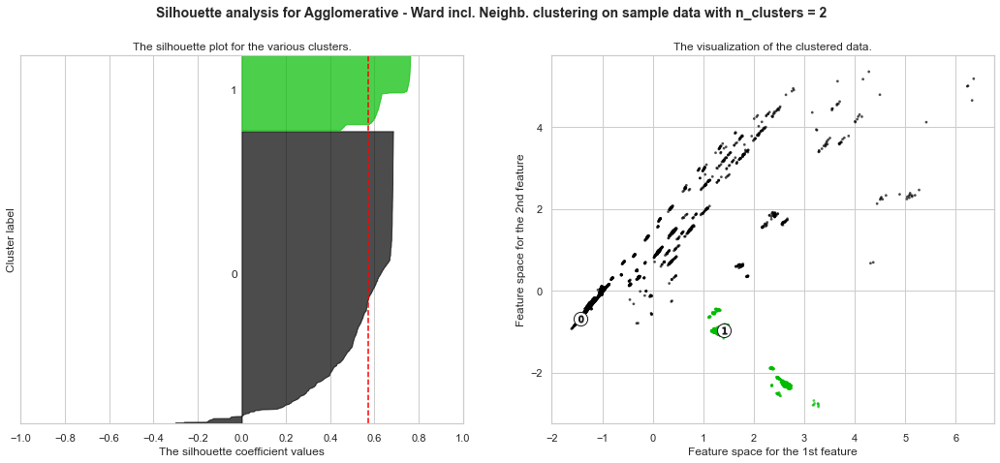

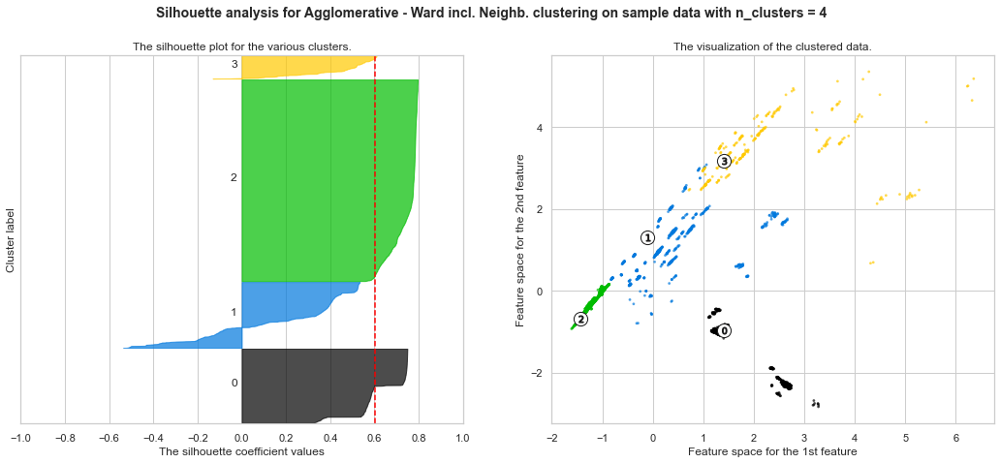

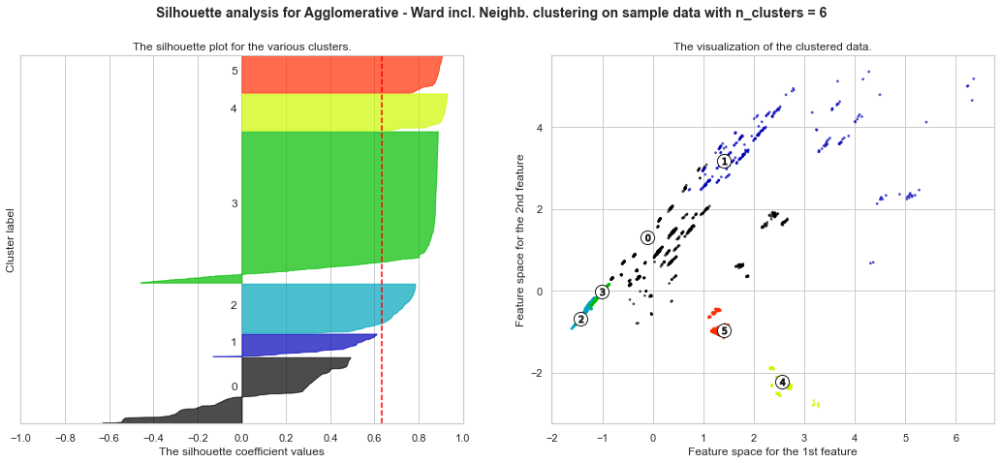

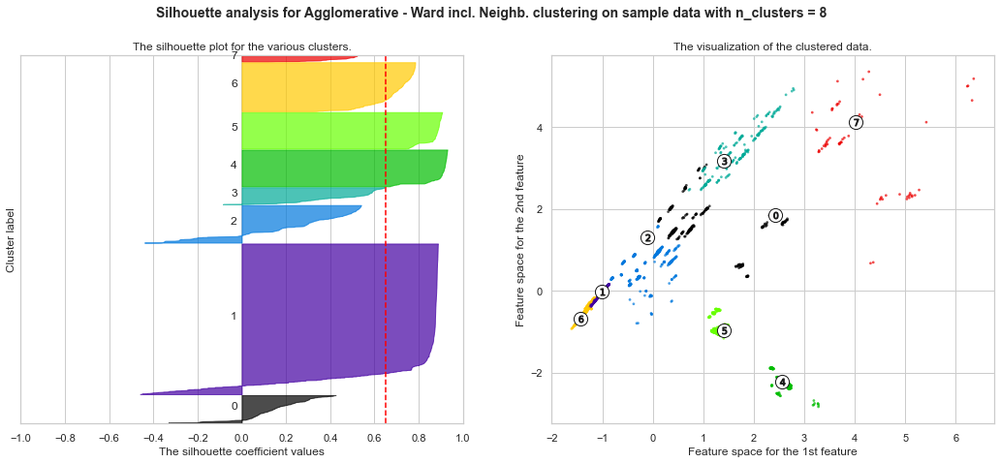

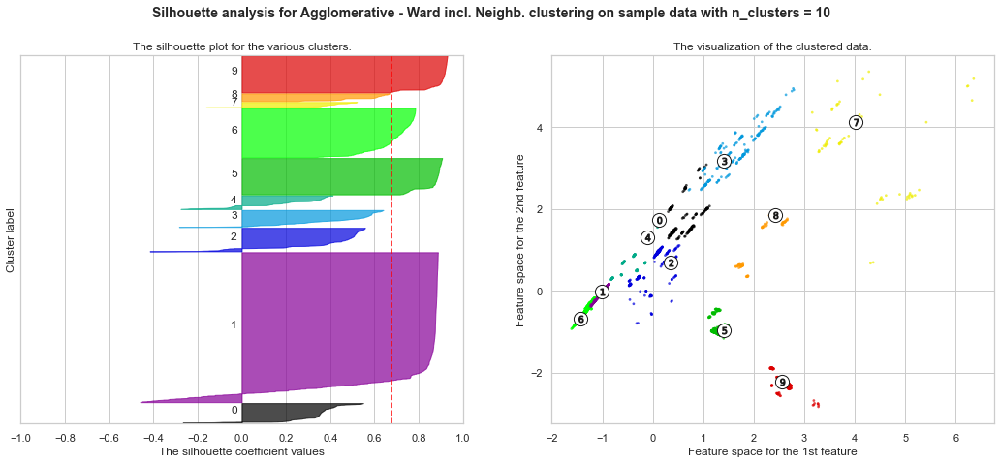

...

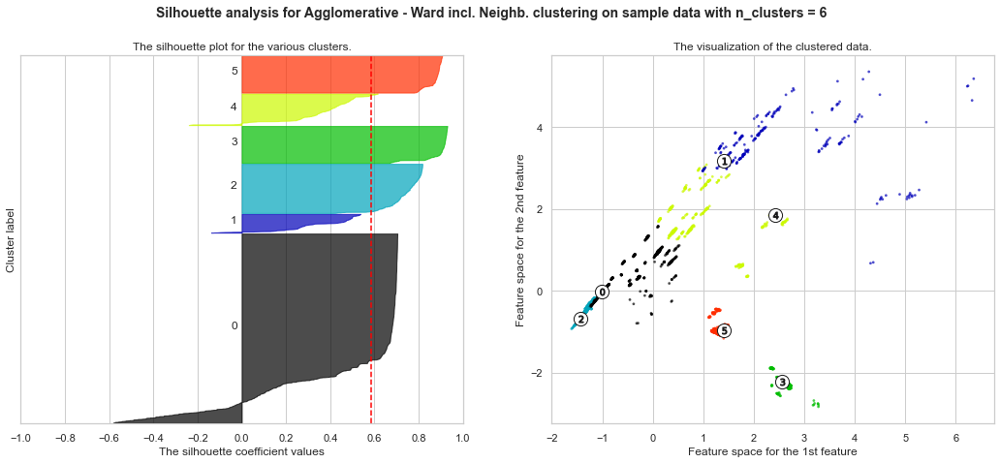

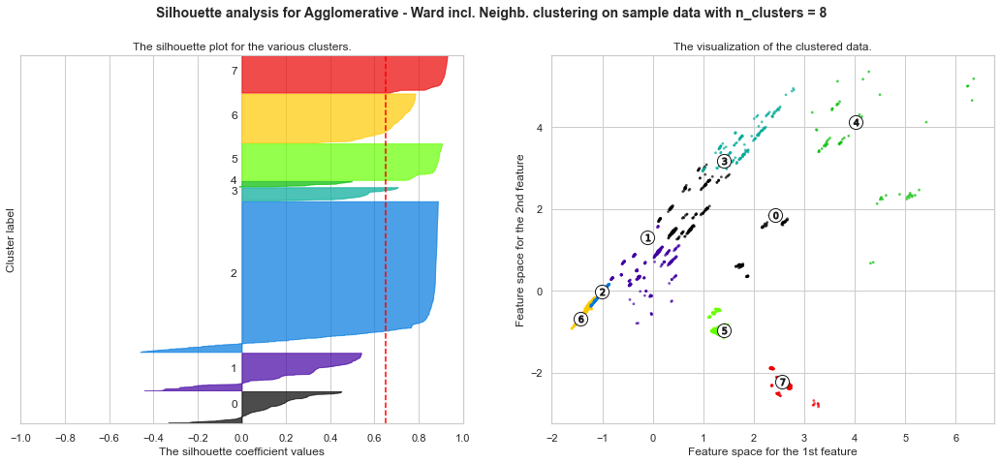

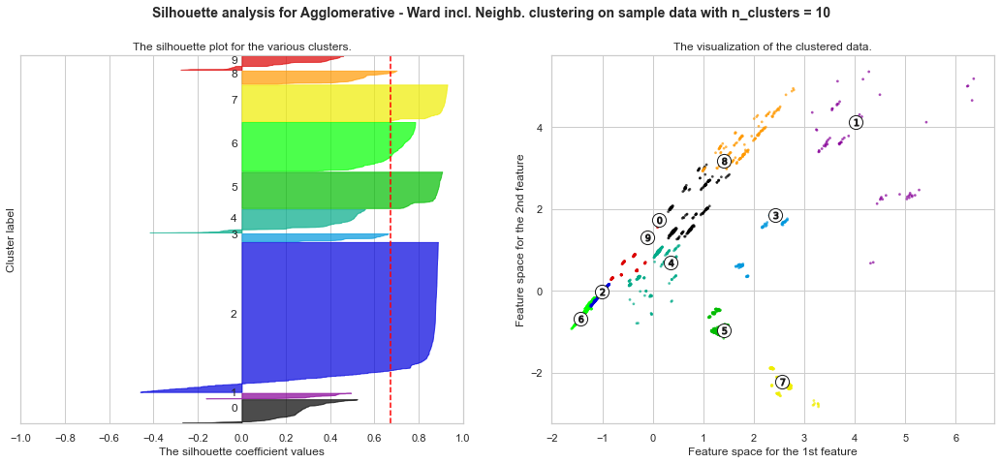

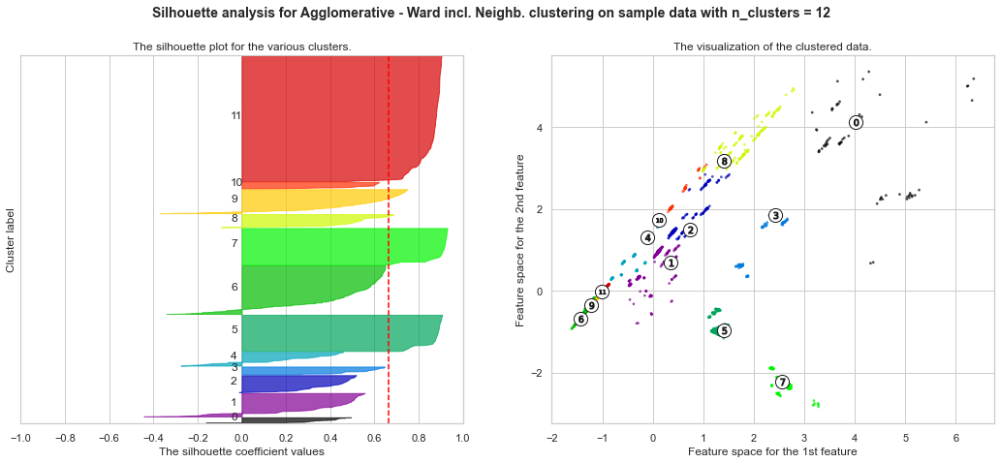

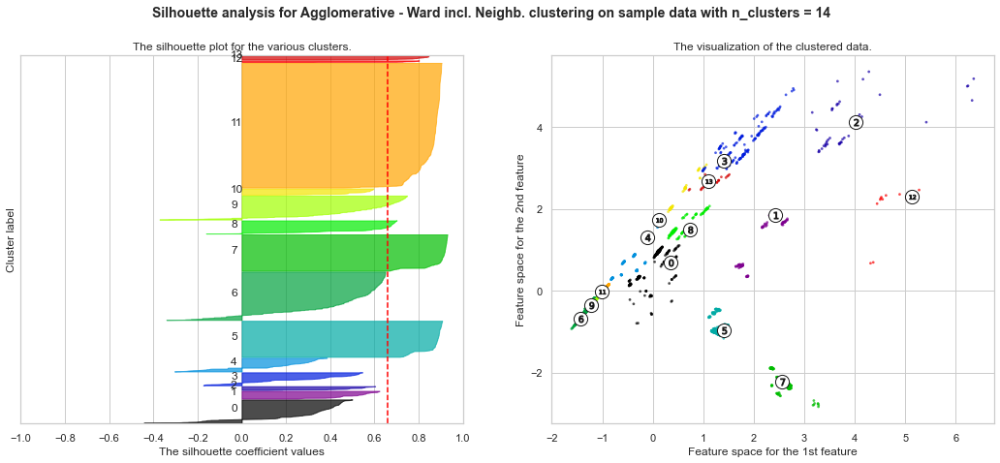

In [64]:
for clust_labels in sil['hierarchical_ward_neigh']['labels']:
    fig = silouette_plot(X, clust_labels, name= 'Agglomerative - Ward incl. Neighb.')

In [65]:
connectivity = kneighbors_graph(X, n_neighbors=neighbour_star, include_self=False)
ward = AgglomerativeClustering(n_clusters=n_clusters_star, connectivity=connectivity,
                               linkage='ward')
ward.fit(X)
print('Estimated number of neighbours: %d' % neighbour_star)
print('Estimated number of clusters: %d' % n_clusters_star)
print("Silhouette Coefficient: %0.3f"
      % metrics.silhouette_score(X, ward.labels_))
print(Counter(ward.labels_))
y_tmp.loc[list(mask_FP),'hierarchical_ward_connect_labels'] = list(ward.labels_)

C:\Users\schubert\anaconda3\lib\site-packages\sklearn\cluster\_agglomerative.py:245: UserWarning: the number of connected components of the connectivity matrix is 54 > 1. Completing it to avoid stopping the tree early.
  connectivity, n_connected_components = _fix_connectivity(


Estimated number of neighbours: 8
Estimated number of clusters: 12
Silhouette Coefficient: 0.690
Counter({1: 1761, 6: 629, 9: 440, 11: 438, 2: 283, 4: 167, 10: 160, 5: 111, 3: 94, 8: 93, 7: 77, 0: 66})


<class 'numpy.ndarray'>
--Correct: 66
--Wrong:   0
########################################################################################
<class 'numpy.ndarray'>
--Correct: 1394
--Wrong:   367
########################################################################################
<class 'numpy.ndarray'>
--Correct: 283
--Wrong:   0
########################################################################################
<class 'numpy.ndarray'>
--Correct: 94
--Wrong:   0
########################################################################################
<class 'numpy.ndarray'>
--Correct: 167
--Wrong:   0
########################################################################################
<class 'numpy.ndarray'>
--Correct: 111
--Wrong:   0
########################################################################################
<class 'numpy.ndarray'>
--Correct: 629
--Wrong:   0
########################################################################################
<class 'nump

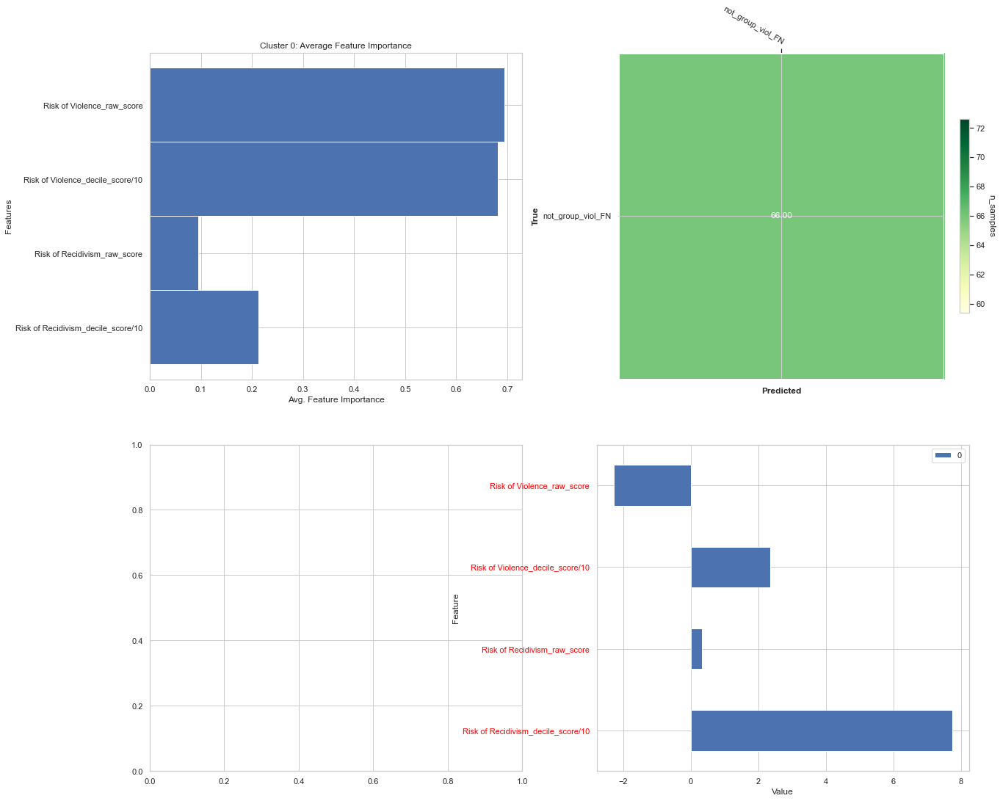

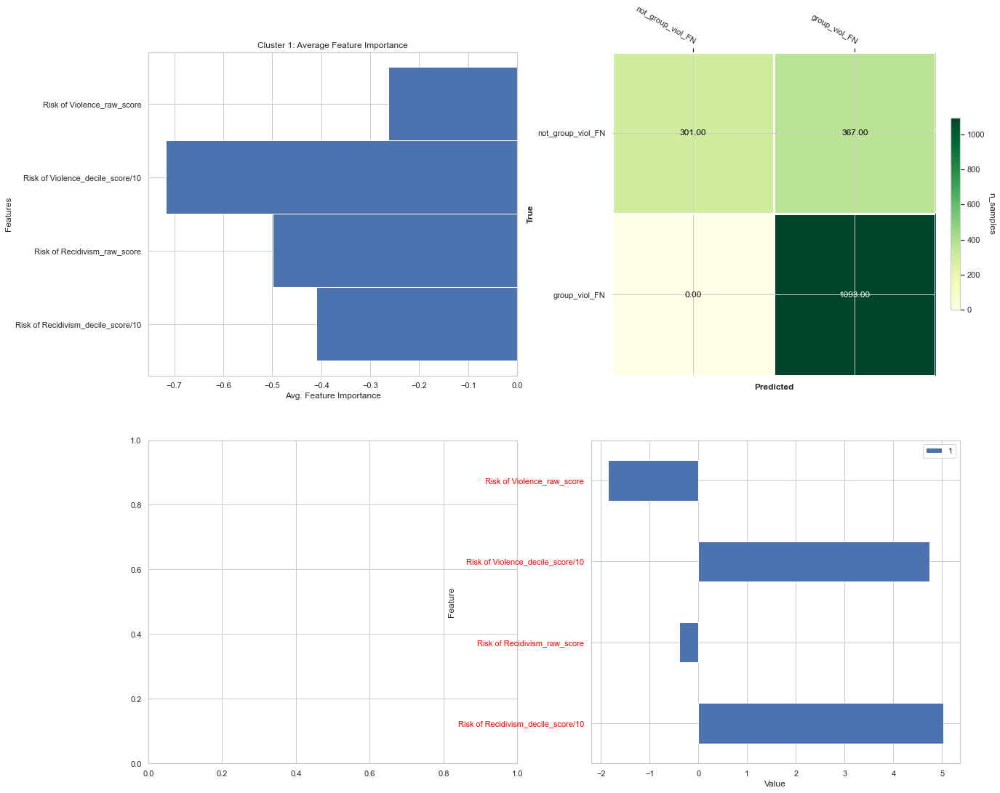

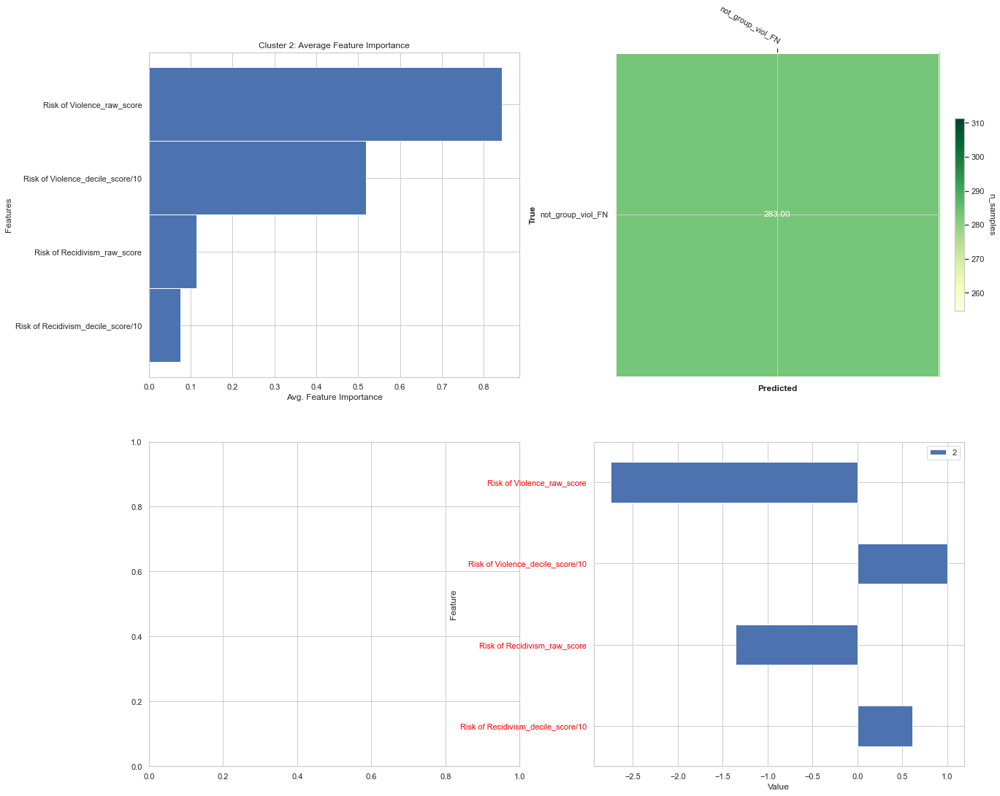

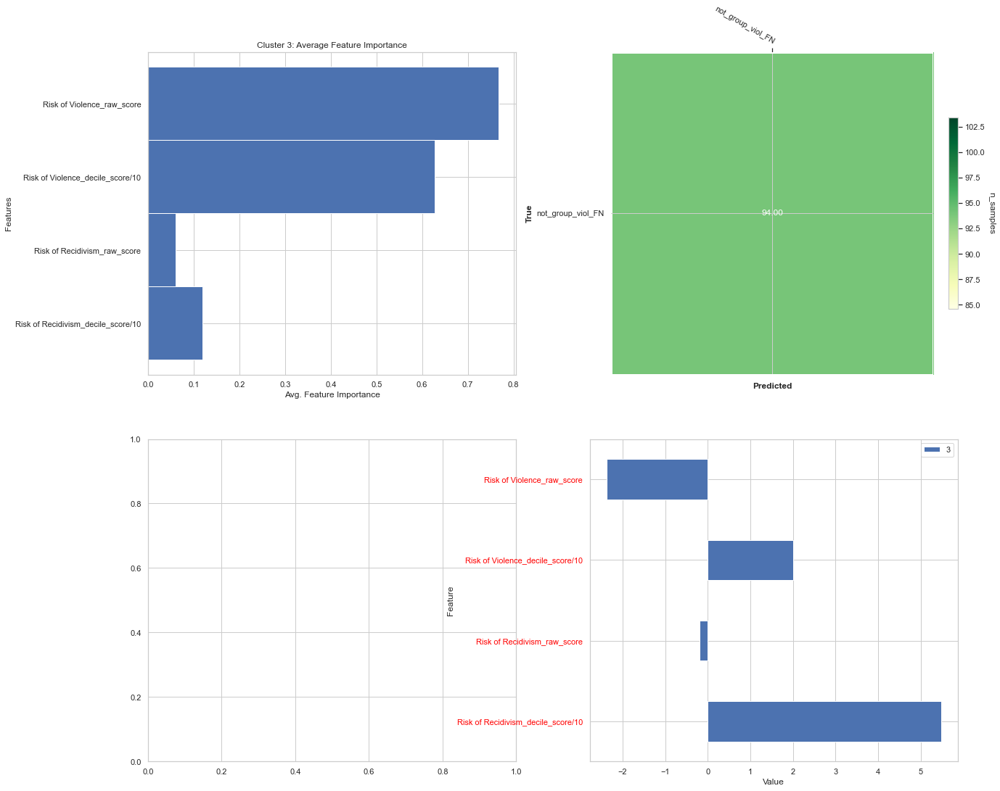

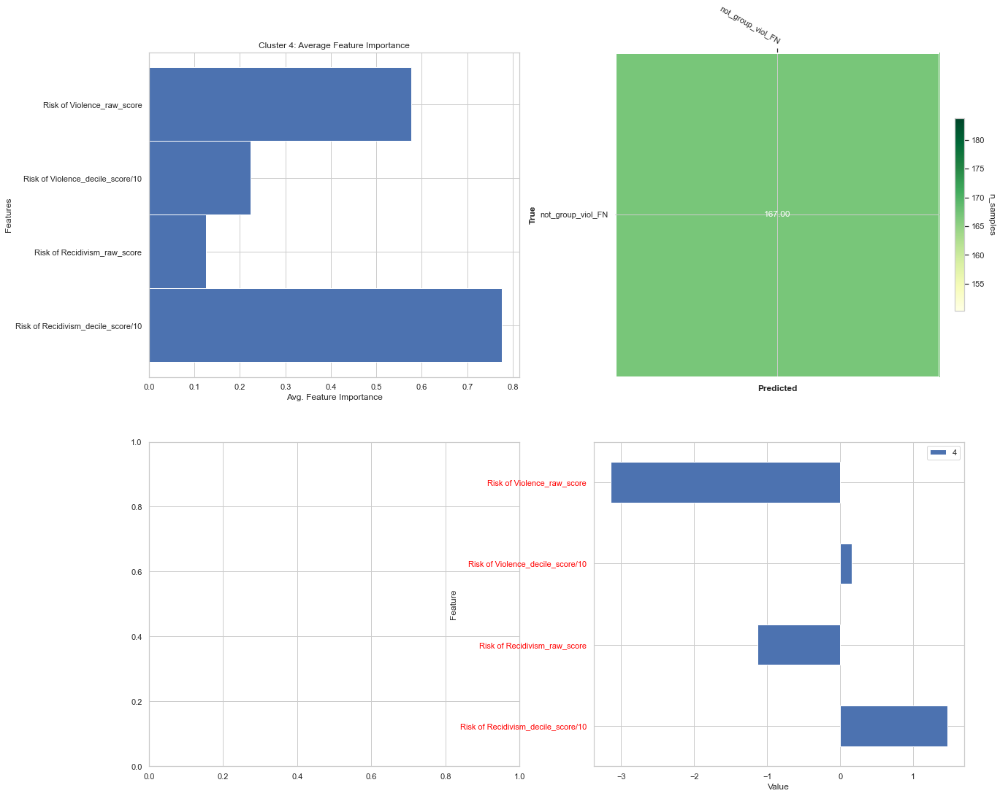

...

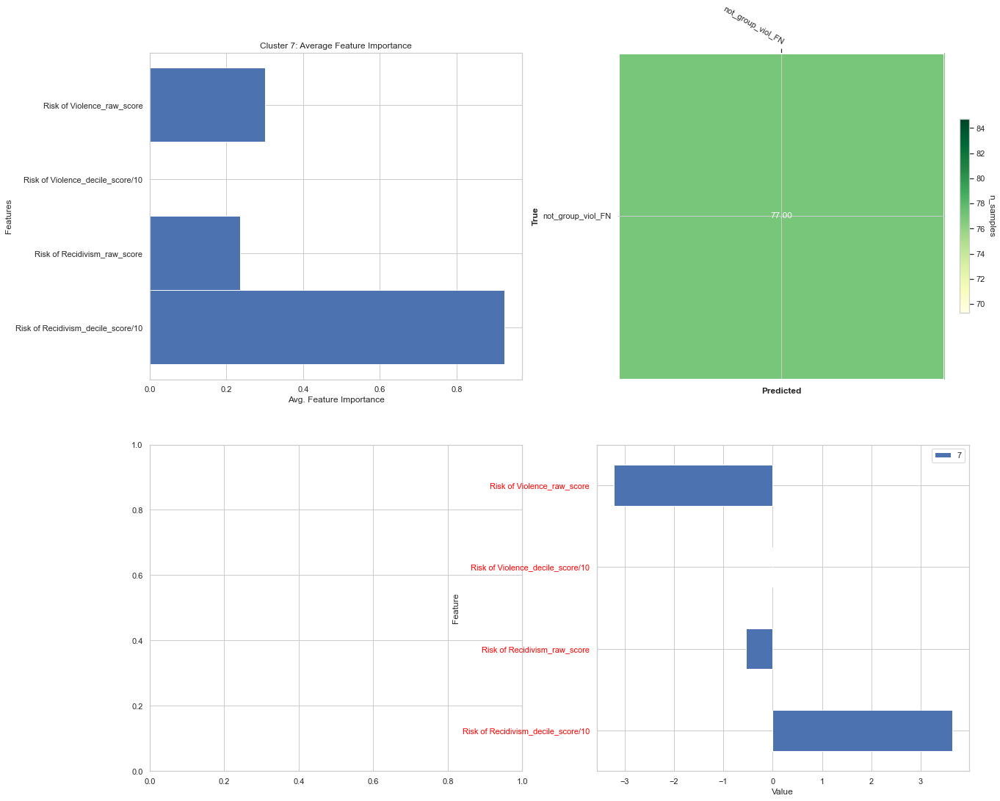

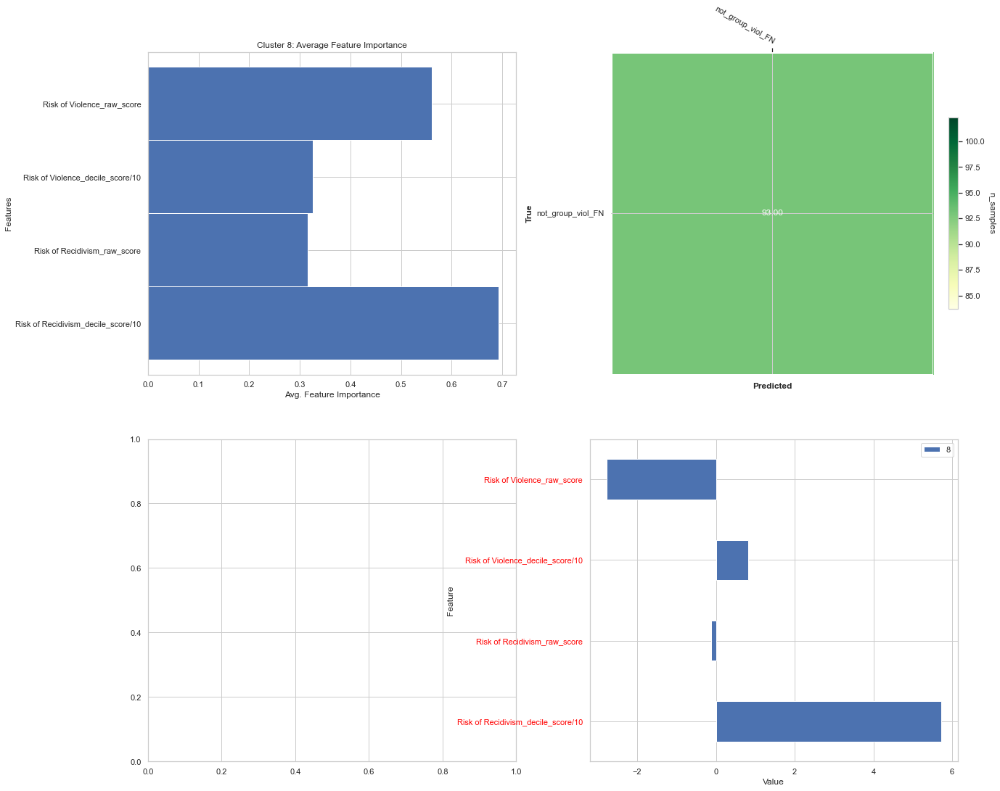

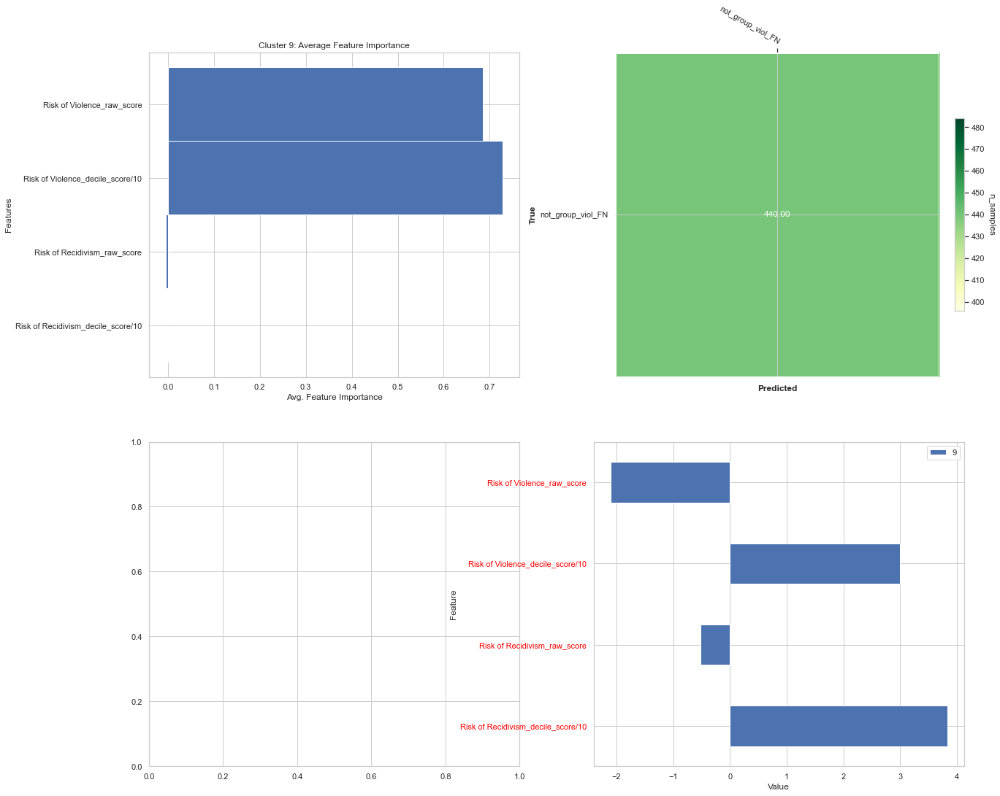

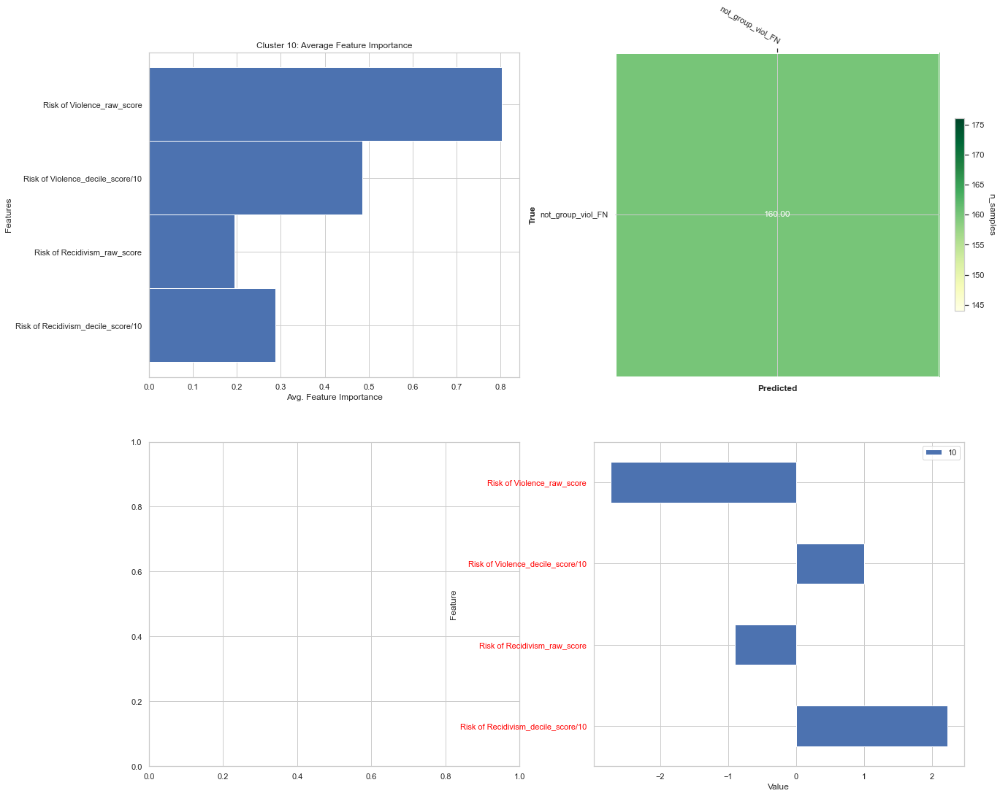

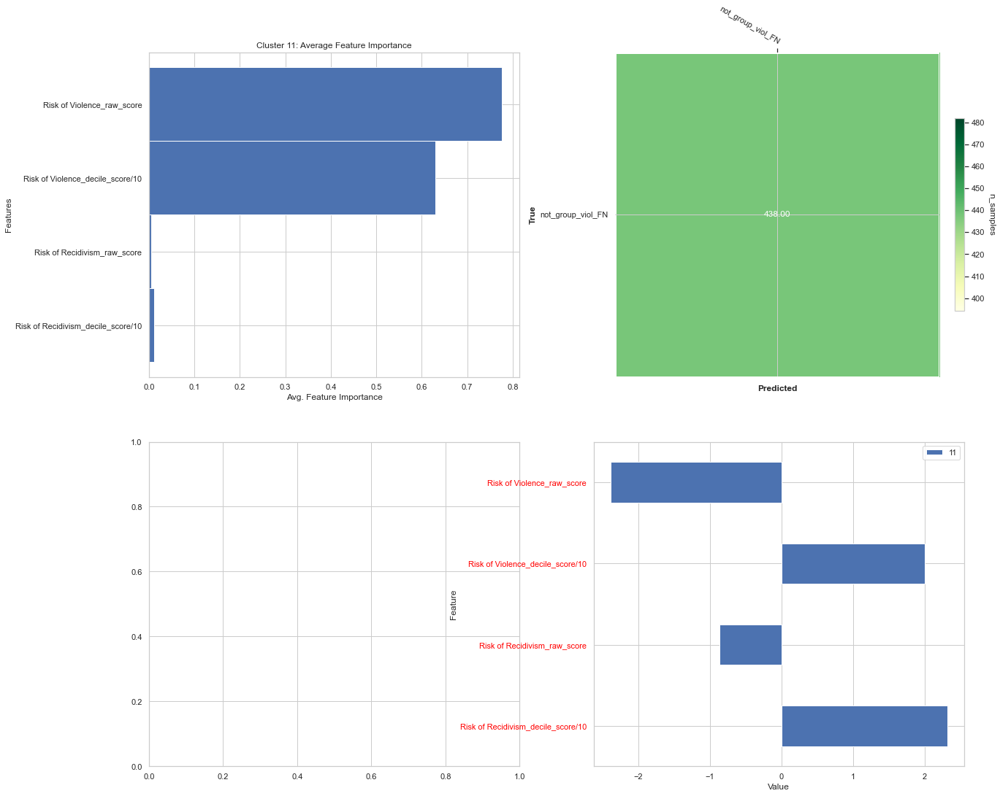

In [66]:
from plot_helpers import plot_clustered_relevance
labels = ward.labels_
fig = plot_clustered_relevance(X_plot, labels, relevance_array, y_predicted, target, Rs_dic, exclude, idx, mask_FP)

In [68]:

tmp_pca_star = -100
tmp_star = -100
sil.update({'kmeans_pca':{'components':[],'n_clusters':[], 'sil':[], 'labels':[]}})
sil.update({'kmeans':{'n_clusters':[], 'sil':[], 'labels':[]}})

for k in range (2, 20):
    km = KMeans(n_clusters=k, n_init=20, random_state=1).fit(X)
    sil['kmeans']['n_clusters'].append(k)
    sil['kmeans']['sil'].append(metrics.silhouette_score(X, km.labels_))
    sil['kmeans']['labels'].append(km.labels_)
    if sil['kmeans']['sil'][-1] > tmp_star:
        k_star = k
        tmp_star = sil['kmeans']['sil'][-1]
        
    for components in range(2, min([16, X.shape[1]])):
        pca = PCA(n_components=components, svd_solver='full')
        X_trans = pca.fit_transform(X)
        km_pca = KMeans(n_clusters = k, n_init=20, random_state=1).fit(X_trans)
        
        
        sil['kmeans_pca']['components'].append(components)
        sil['kmeans_pca']['n_clusters'].append(k)
        sil['kmeans_pca']['sil'].append(metrics.silhouette_score(X, km_pca.labels_))  
        sil['kmeans_pca']['labels'].append(km_pca.labels_)

        if  sil['kmeans_pca']['sil'][-1] > tmp_pca_star:
            components_star = components
            k_pca_star = k 
            tmp_pca_star =  sil['kmeans_pca']['sil'][-1]
            


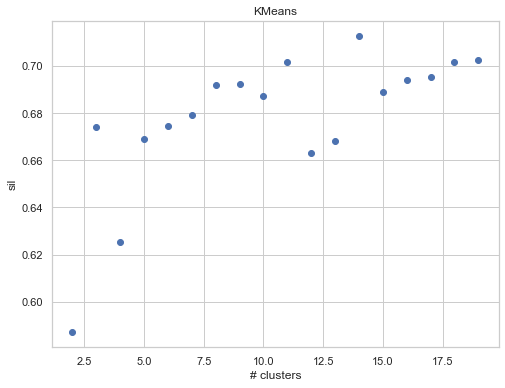

In [69]:
fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(8,6))
axs.scatter(sil['kmeans']['n_clusters'], sil['kmeans']['sil'])
axs.set_xlabel('# clusters')
axs.set_ylabel('sil')
axs.set_title('KMeans')
plt.show()

For n_clusters = 2 The average silhouette_score is : 0.5868394
For n_clusters = 3 The average silhouette_score is : 0.67409414
For n_clusters = 4 The average silhouette_score is : 0.6254342
For n_clusters = 5 The average silhouette_score is : 0.6690674
For n_clusters = 6 The average silhouette_score is : 0.6746824
For n_clusters = 7 The average silhouette_score is : 0.679216
For n_clusters = 8 The average silhouette_score is : 0.6919147
For n_clusters = 9 The average silhouette_score is : 0.69251764
For n_clusters = 10 The average silhouette_score is : 0.68754894
For n_clusters = 11 The average silhouette_score is : 0.7019913
For n_clusters = 12 The average silhouette_score is : 0.663268
For n_clusters = 13 The average silhouette_score is : 0.6682046
For n_clusters = 14 The average silhouette_score is : 0.7129576
For n_clusters = 15 The average silhouette_score is : 0.6892874
For n_clusters = 16 The average silhouette_score is : 0.69417244
For n_clusters = 17 The average silhouette_sco

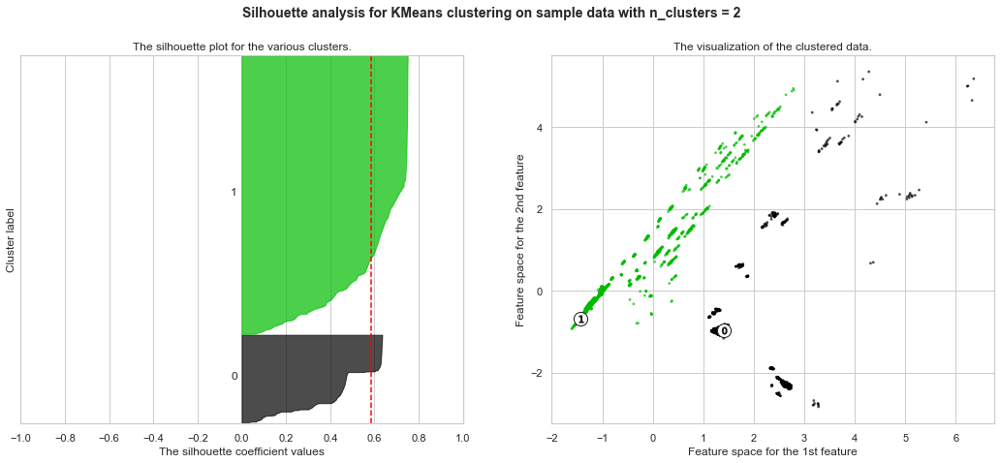

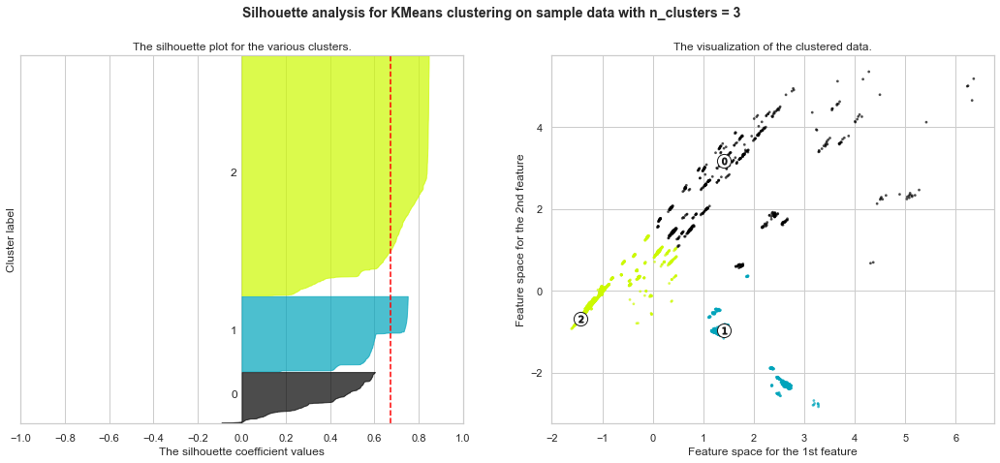

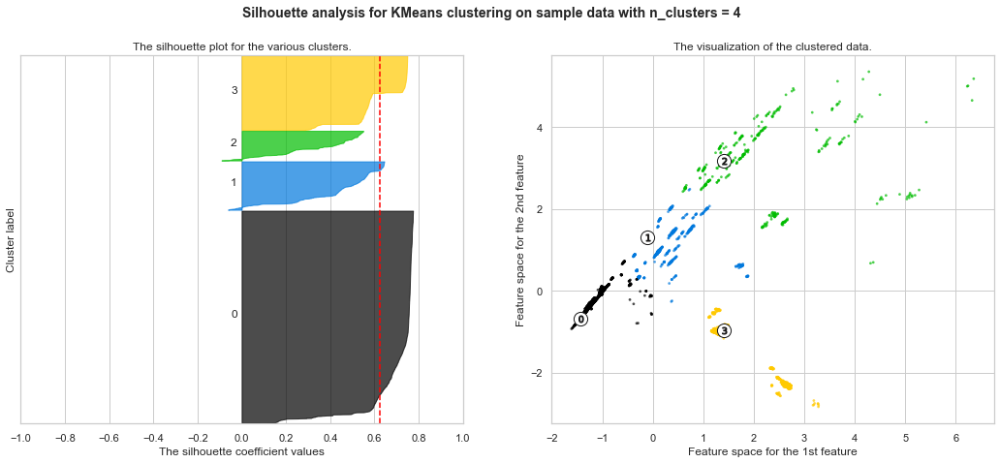

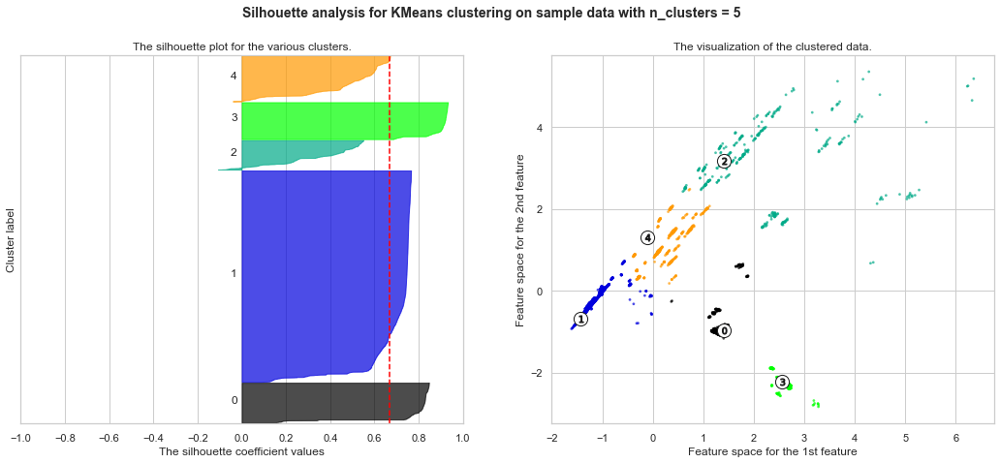

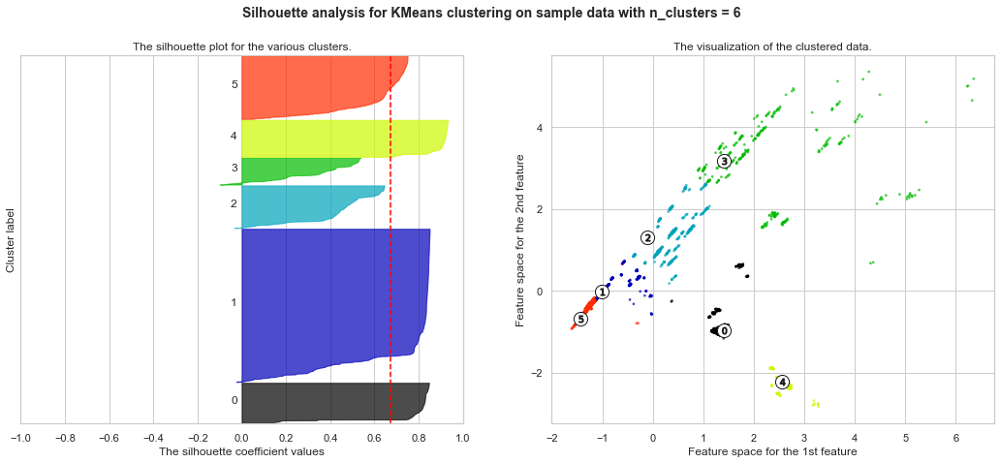

...

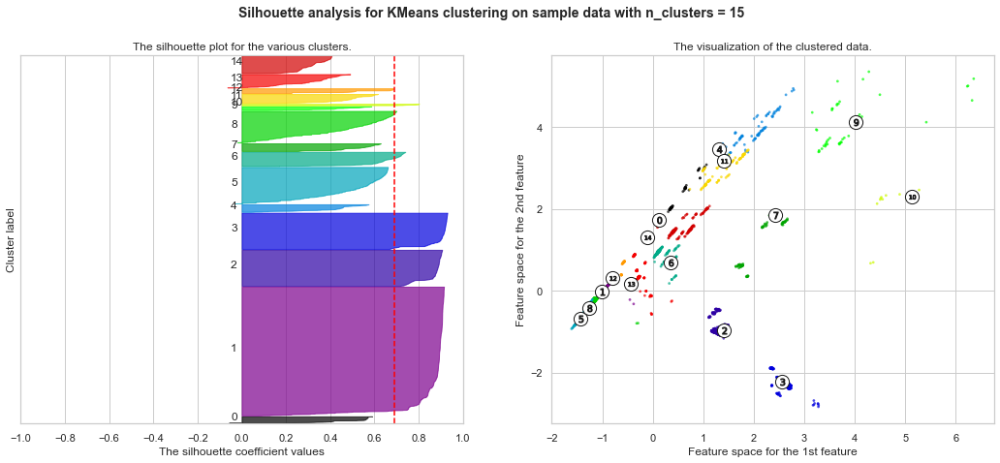

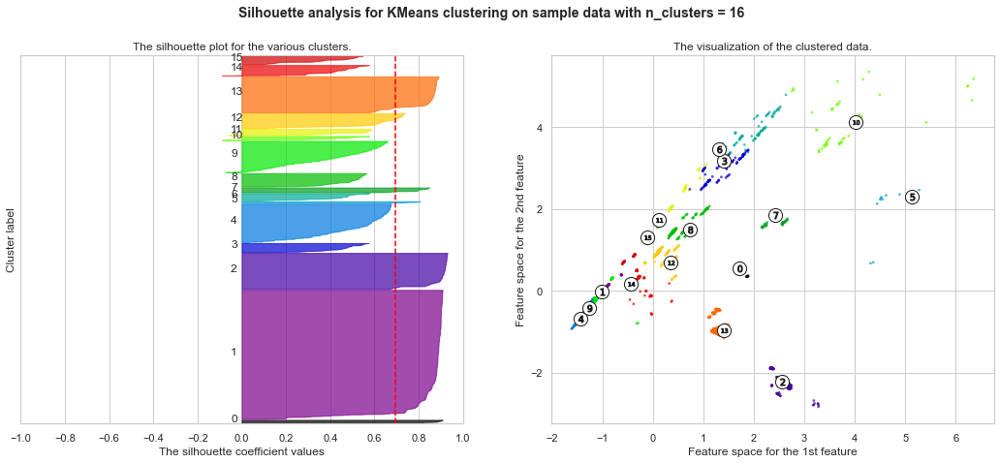

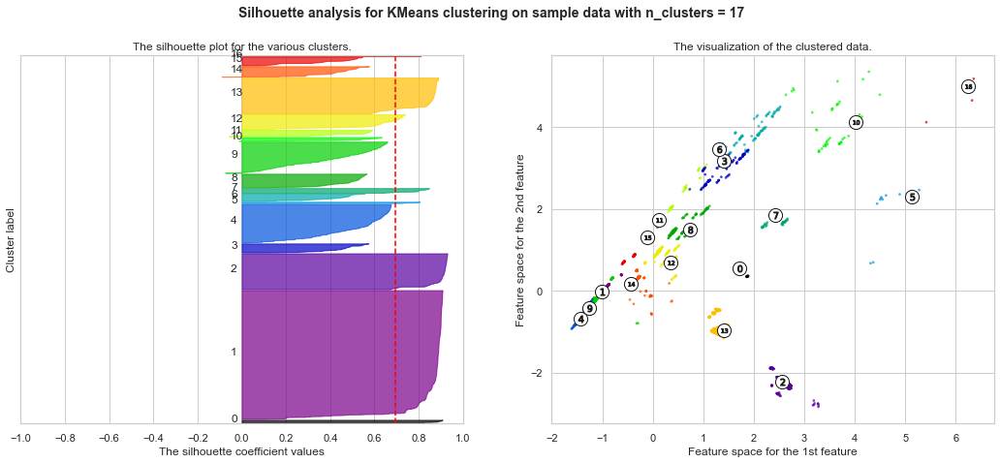

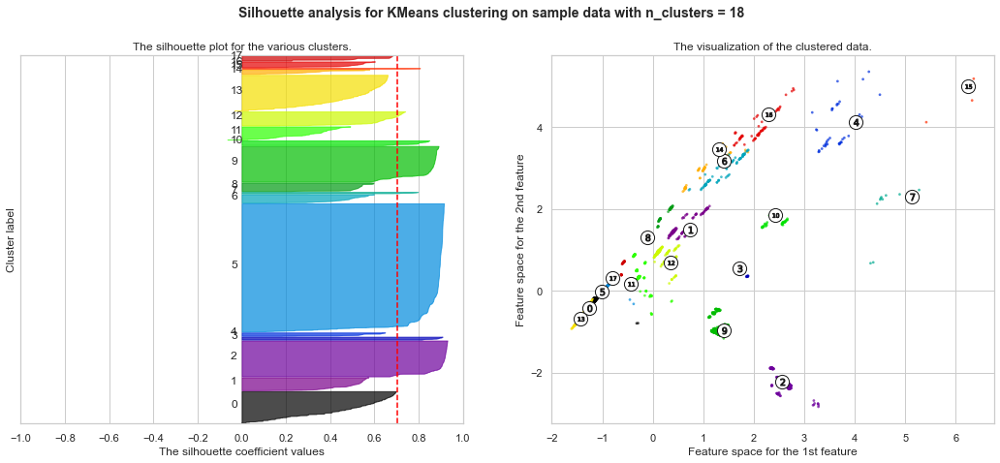

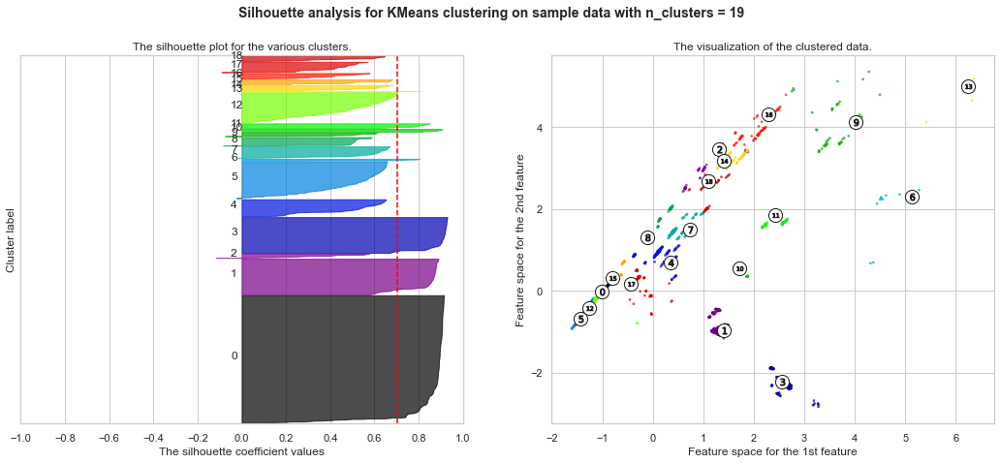

In [70]:
for clust_labels in sil['kmeans']['labels']:
    fig = silouette_plot(X, clust_labels, name= 'KMeans')

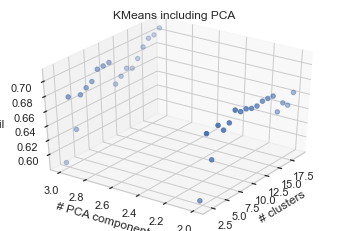

In [71]:
fig = plt.figure()
ax = plt.axes(projection='3d')
ax.scatter3D(sil['kmeans_pca']['n_clusters'],
             sil['kmeans_pca']['components'],
             sil['kmeans_pca']['sil'],
             cmap='Greens')
ax.set_xlabel('# clusters')
ax.set_ylabel('# PCA components')
ax.set_zlabel('sil')
ax.set_title('KMeans including PCA')
ax.view_init(35, 215)
plt.show()

For n_clusters = 2 The average silhouette_score is : 0.5868394
For n_clusters = 2 The average silhouette_score is : 0.5868394
For n_clusters = 3 The average silhouette_score is : 0.6740732
For n_clusters = 3 The average silhouette_score is : 0.67409414
For n_clusters = 4 The average silhouette_score is : 0.63471043
For n_clusters = 4 The average silhouette_score is : 0.6254342
For n_clusters = 5 The average silhouette_score is : 0.6766018
For n_clusters = 5 The average silhouette_score is : 0.6690674
For n_clusters = 6 The average silhouette_score is : 0.66610605
For n_clusters = 6 The average silhouette_score is : 0.6746824
For n_clusters = 7 The average silhouette_score is : 0.67152494
For n_clusters = 7 The average silhouette_score is : 0.679216
For n_clusters = 8 The average silhouette_score is : 0.68428105
For n_clusters = 8 The average silhouette_score is : 0.6919147
For n_clusters = 9 The average silhouette_score is : 0.6781808
For n_clusters = 9 The average silhouette_score is 

C:\Users\schubert\Documents\COMPAS\compas-analysis\code\plot_helpers.py:205: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(1, 2)


For n_clusters = 12 The average silhouette_score is : 0.6735253


C:\Users\schubert\Documents\COMPAS\compas-analysis\code\plot_helpers.py:205: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(1, 2)


For n_clusters = 12 The average silhouette_score is : 0.66732377


C:\Users\schubert\Documents\COMPAS\compas-analysis\code\plot_helpers.py:205: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(1, 2)


For n_clusters = 13 The average silhouette_score is : 0.6760755


C:\Users\schubert\Documents\COMPAS\compas-analysis\code\plot_helpers.py:205: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(1, 2)


For n_clusters = 13 The average silhouette_score is : 0.6744693


C:\Users\schubert\Documents\COMPAS\compas-analysis\code\plot_helpers.py:205: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(1, 2)


For n_clusters = 14 The average silhouette_score is : 0.6756646


C:\Users\schubert\Documents\COMPAS\compas-analysis\code\plot_helpers.py:205: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(1, 2)


For n_clusters = 14 The average silhouette_score is : 0.67074203


C:\Users\schubert\Documents\COMPAS\compas-analysis\code\plot_helpers.py:205: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(1, 2)


For n_clusters = 15 The average silhouette_score is : 0.6748972


C:\Users\schubert\Documents\COMPAS\compas-analysis\code\plot_helpers.py:205: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(1, 2)


For n_clusters = 15 The average silhouette_score is : 0.68029267


C:\Users\schubert\Documents\COMPAS\compas-analysis\code\plot_helpers.py:205: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(1, 2)


For n_clusters = 16 The average silhouette_score is : 0.6493436


C:\Users\schubert\Documents\COMPAS\compas-analysis\code\plot_helpers.py:205: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(1, 2)


For n_clusters = 16 The average silhouette_score is : 0.6924065


C:\Users\schubert\Documents\COMPAS\compas-analysis\code\plot_helpers.py:205: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(1, 2)


For n_clusters = 17 The average silhouette_score is : 0.65772235


C:\Users\schubert\Documents\COMPAS\compas-analysis\code\plot_helpers.py:205: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(1, 2)


For n_clusters = 17 The average silhouette_score is : 0.70061326


C:\Users\schubert\Documents\COMPAS\compas-analysis\code\plot_helpers.py:205: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(1, 2)


For n_clusters = 18 The average silhouette_score is : 0.65056384


C:\Users\schubert\Documents\COMPAS\compas-analysis\code\plot_helpers.py:205: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(1, 2)


For n_clusters = 18 The average silhouette_score is : 0.7016078


C:\Users\schubert\Documents\COMPAS\compas-analysis\code\plot_helpers.py:205: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(1, 2)


For n_clusters = 19 The average silhouette_score is : 0.664033


C:\Users\schubert\Documents\COMPAS\compas-analysis\code\plot_helpers.py:205: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(1, 2)


For n_clusters = 19 The average silhouette_score is : 0.7075677


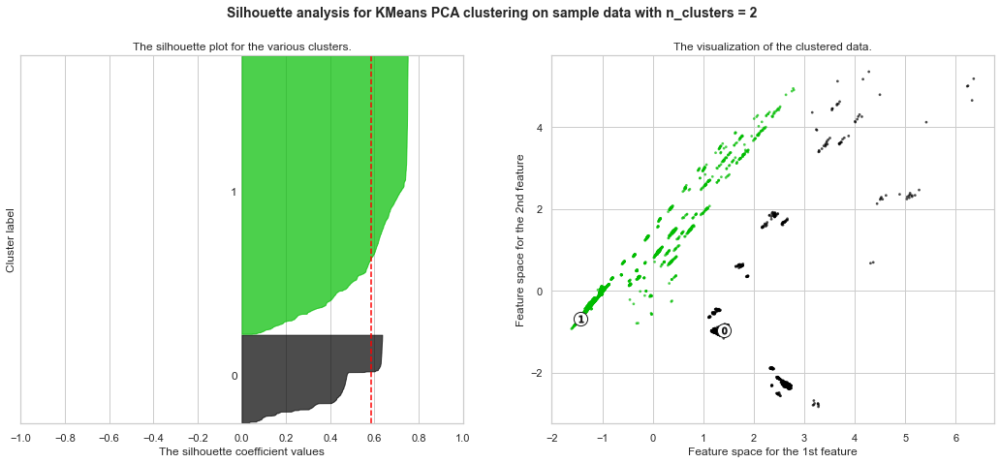

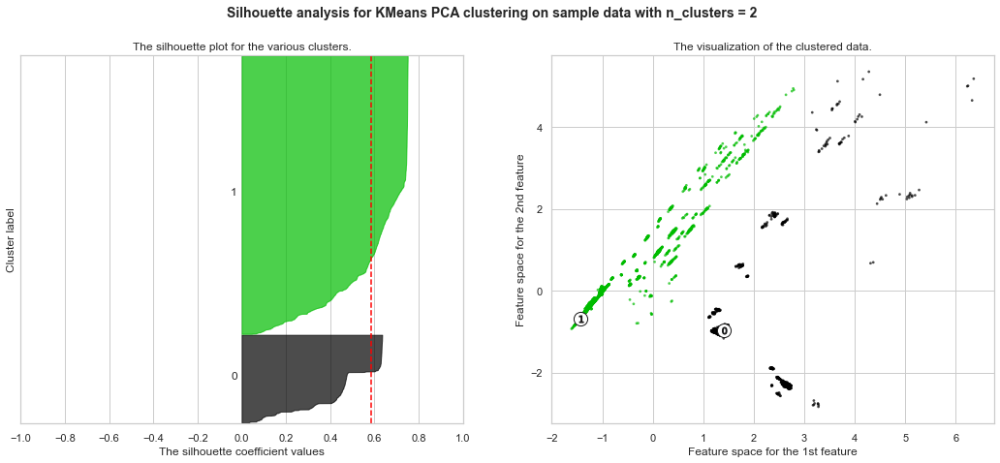

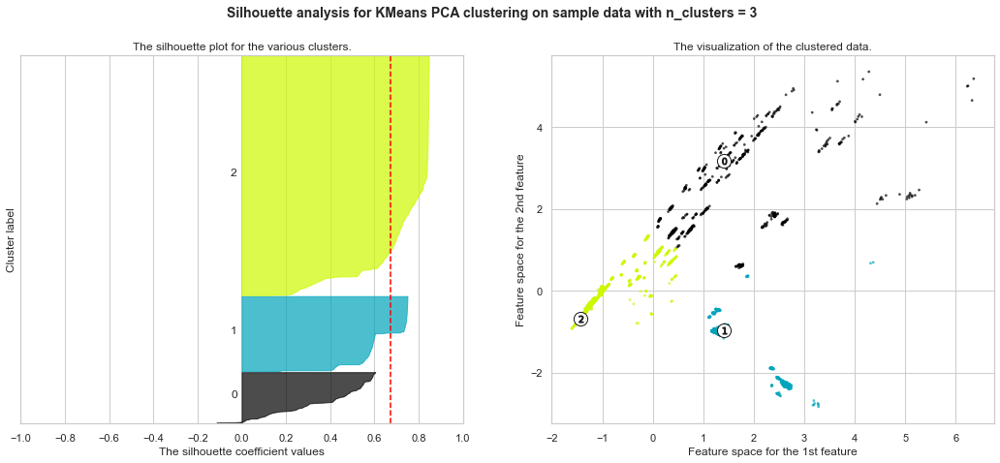

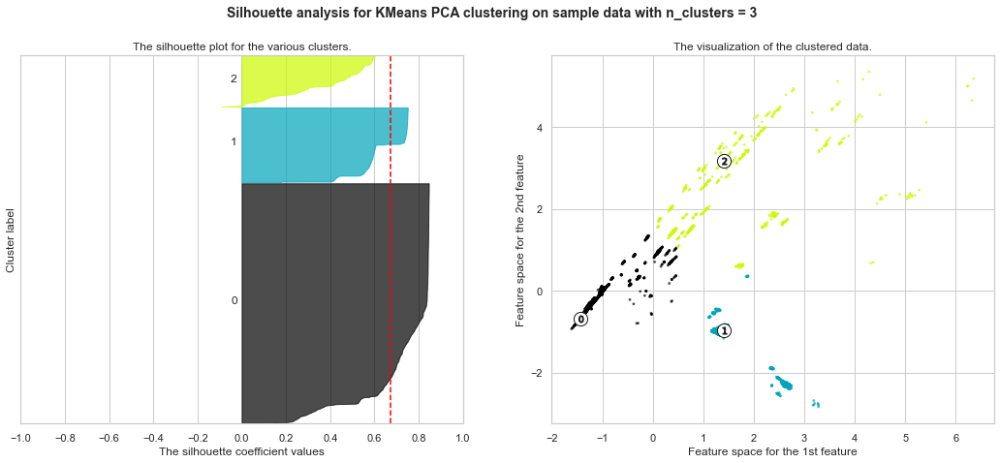

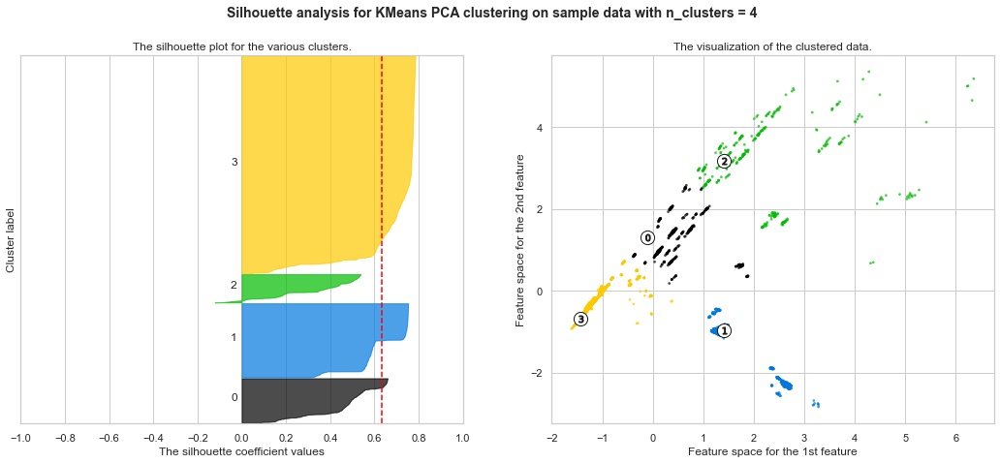

...

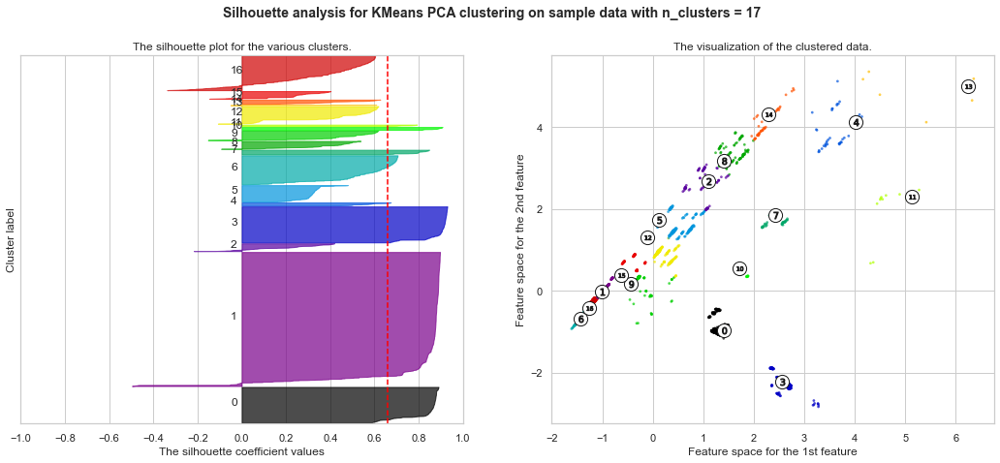

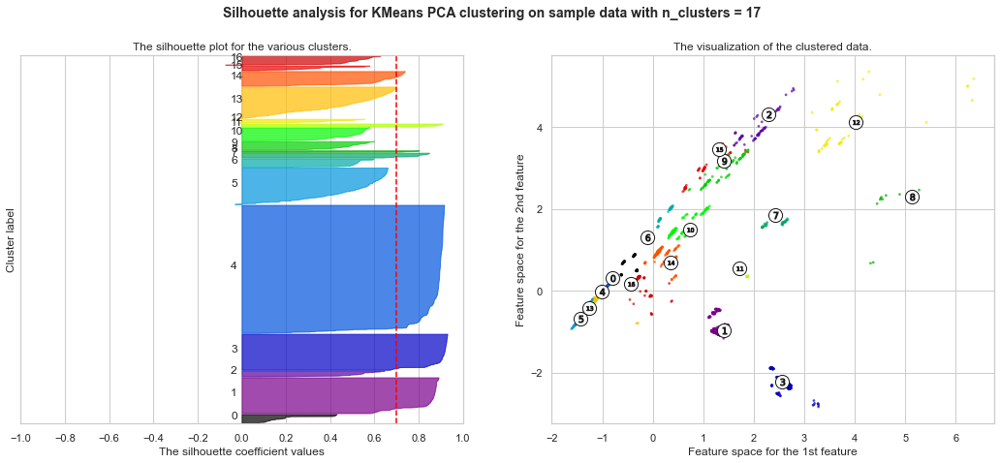

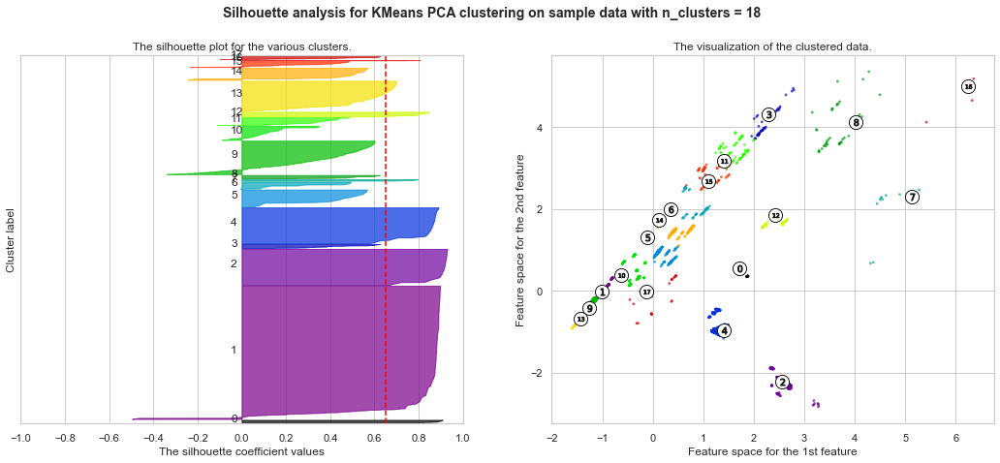

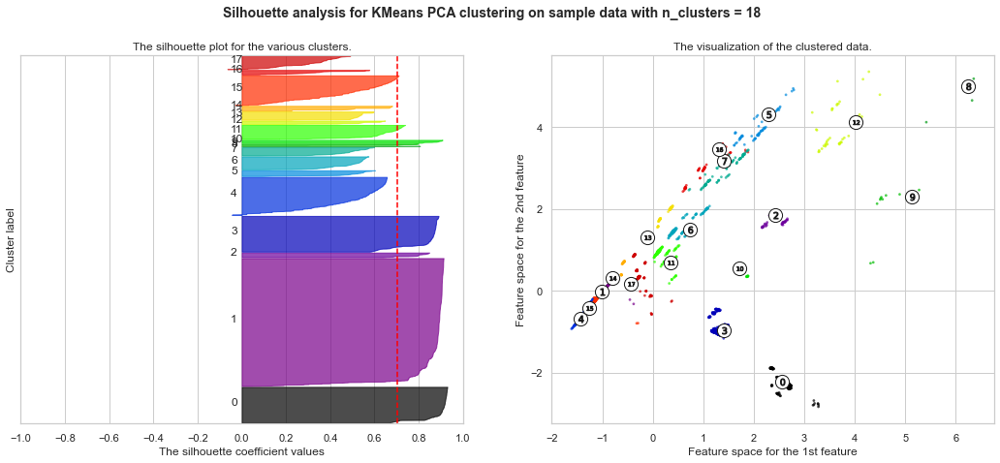

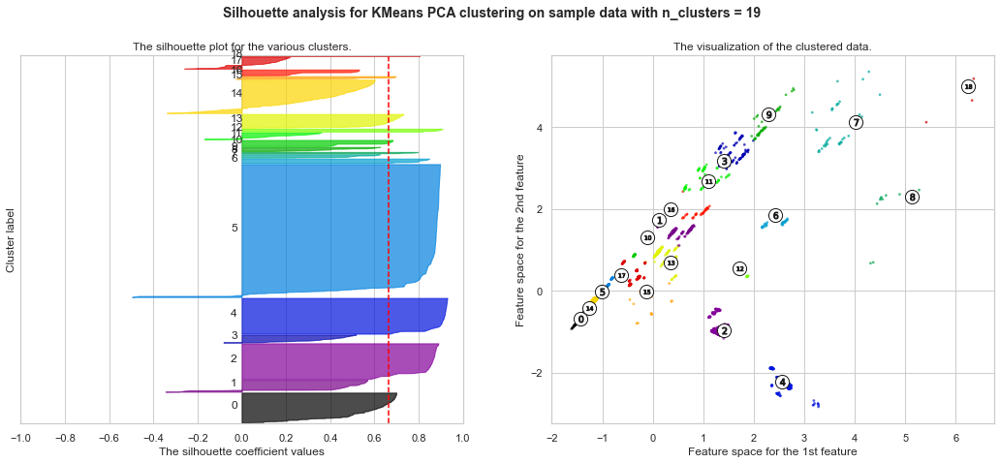

In [75]:
for clust_labels in sil['kmeans_pca']['labels']:
    fig = silouette_plot(X, clust_labels, name= 'KMeans PCA')
plt.close(fig)

In [77]:
k_pca_star = 2
components_star = 3
k_star = 2

pca = PCA(n_components=components_star, svd_solver='full')
X_trans = pca.fit_transform(X)
km_pca = KMeans(n_clusters = k_pca_star, n_init=20, random_state=1).fit(X_trans)
km = KMeans(n_clusters=k_star, n_init=20, random_state=1).fit(X)

print('Excluding PCA')
print('Estimated number of clusters: %d' % k_star)
print("Silhouette Coefficient: %0.3f"
      % metrics.silhouette_score(X, km.labels_))
print(Counter(km.labels_))
print('####################################')

print('Including PCA')
print('Estimated principal components %d', components_star)
print('Estimated number of clusters: %d' % k_pca_star)
print("Silhouette Coefficient: %0.3f"
      % metrics.silhouette_score(X_trans, km_pca.labels_))
print(Counter(km_pca.labels_))
print('####################################')

y_tmp.loc[list(mask_FP),'kmeans_labels'] = list(km.labels_)
y_tmp.loc[list(mask_FP),'kmeans_pca_labels'] = list(km_pca.labels_)

Excluding PCA
Estimated number of clusters: 2
Silhouette Coefficient: 0.587
Counter({0: 3281, 1: 1038})
####################################
Including PCA
Estimated principal components %d 3
Estimated number of clusters: 2
Silhouette Coefficient: 0.588
Counter({0: 3281, 1: 1038})
####################################


<class 'numpy.ndarray'>
--Correct: 2914
--Wrong:   367
########################################################################################
<class 'numpy.ndarray'>
--Correct: 1038
--Wrong:   0
########################################################################################


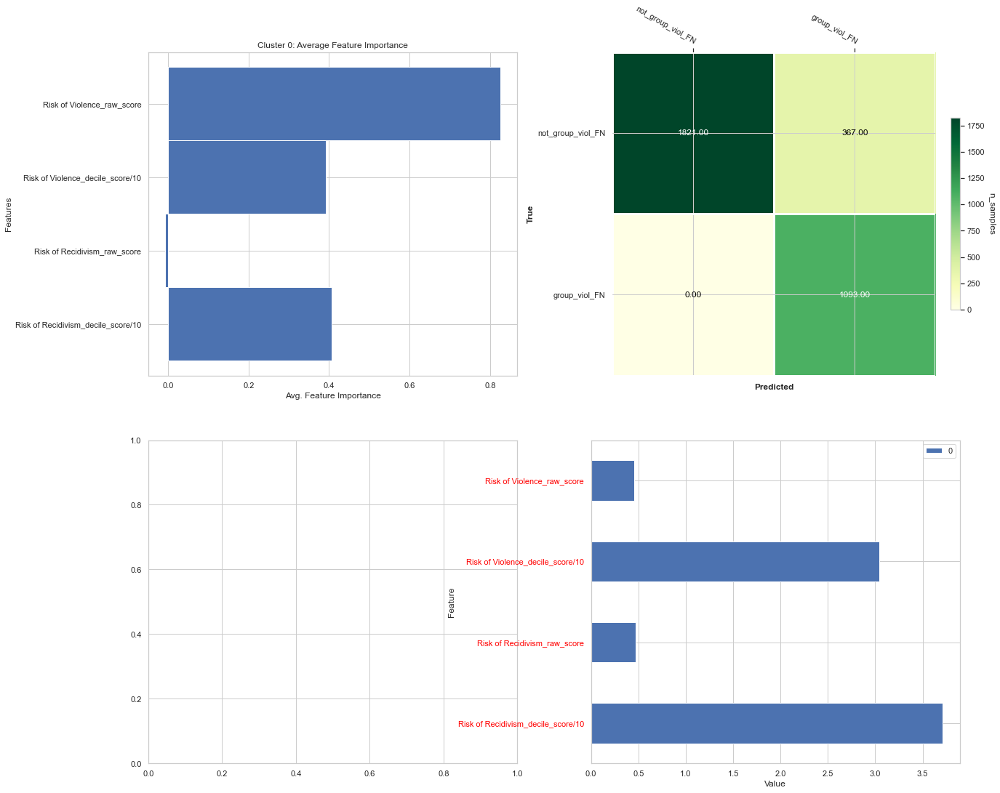

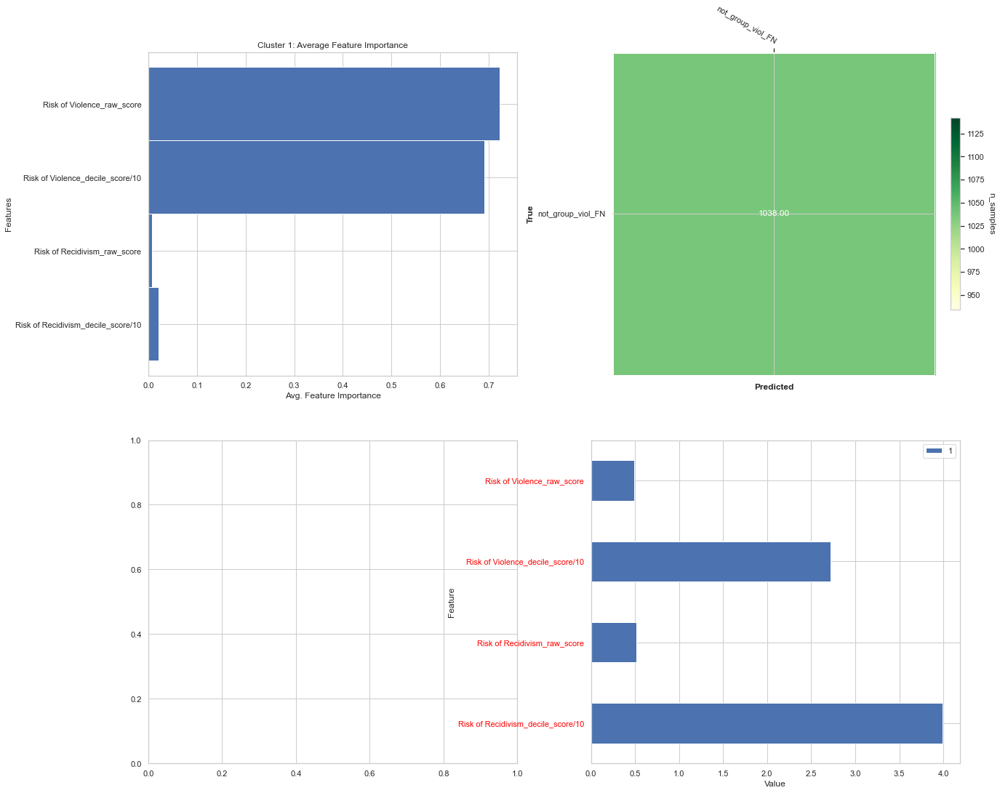

In [78]:
labels = km.labels_
fig = plot_clustered_relevance(X_tmp, labels, relevance_array, y_predicted, target, Rs_dic, exclude, idx, mask_FP)

<class 'numpy.ndarray'>
--Correct: 2914
--Wrong:   367
########################################################################################
<class 'numpy.ndarray'>
--Correct: 1038
--Wrong:   0
########################################################################################


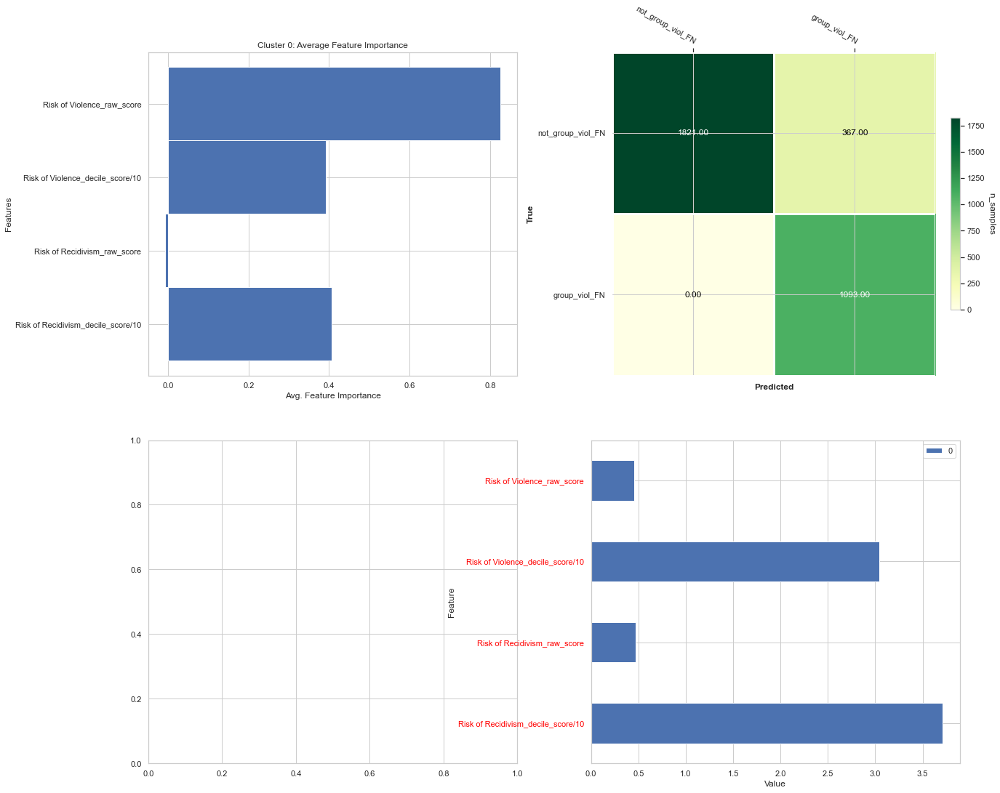

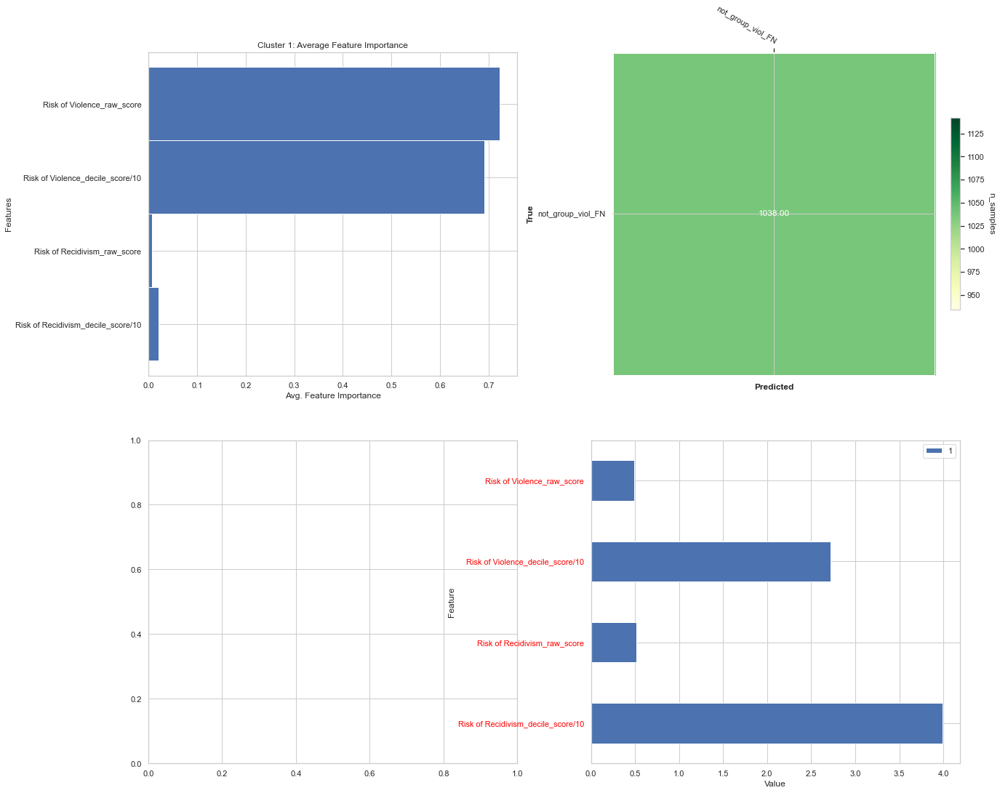

In [79]:
labels = km_pca.labels_
fig = plot_clustered_relevance(X_tmp, labels, relevance_array, y_predicted, target, Rs_dic, exclude, idx, mask_FP)